# Regression Notebook

In this task, we will work on some multivariable regression problems. The dataset we will be working on is a world happiness report from years `2015` to `2022`. It is a survey of the state of global happiness based on local economic production, social welfares, and etc.

Remember that this is an artifical use case which is supposed to serve a **Contributor level** purposes. Thereafter, you should practice skills such as **Data Preprocessing, Data Visualisation, Preparing Data for ML** and only after you receive feedback on your initial work it is recommended to try **to fit some baseline Machine Learning Model**.

Some insipirations that we can get out of this dataset: 
- imagine that you want to create a complete new country with the goal of having the happiest citizens, which factors or some variables that you might want to pay attention the most?
- imagine that you are the president of your country, how can you improve the happiness level of your country? What are some of the factors that you might want to look out for?

````
Goal: to find out which couple factors contribute the most to the happiness score that we have. Show a strong correlation between the factors that you can come up with.
````
    
One thing to keep in mind is that the result that you get at the end is highly subjective. Try to have a good correlation score, be creative, and be ready to explain the reasoning behind your work.

## 1. Dataset Information
We have 8 different files inside the ``Datasets`` folder prepared for you: `2015.csv`, `2016.csv`, ..., `2022.csv`. The name of the file corresponds to the year of which this report is describing.
    
Below is an explanation of our variables from the dataset:

### Country's profile:
- `country` the respective country
- `region` the region that the country belongs to
- `happiness rank` the ranking of this country based on its happiness score
- `happiness score` the happiness score

### Independent variables contributing to happiness score:
 - `economy gdp per capita` the monetary value of all finished goods and services made within a country during a specific period. 
 - `family` the national average of the binary responses (either 0 or 1) to the Gallup World Poll (GWP) question “If you were in trouble, do you have relatives or friends you can count on to help you whenever you need them, or not?”
 - `health life expectancy` the expected number of remaining years of life spent in good health from a particular age, typically birth
 - `freedom` freedom to make life choices, the national average of binary responses to the GWP question “Are you satisfied or dissatisfied with your freedom to choose what you do with your life?”
 - `trust government corruption` people's perception of corruption
 - `generosity`  the residual of regressing the national average of GWP responses to the question “Have you donated money to a charity in the past month?” on GDP per capita <br>
 Explanations are taken from: [world happiness report](https://worldhappiness.report/ed/2019/changing-world-happiness/)

### Other attributes:
- `dystopia` dystopia is an imaginary country that has the world’s least-happy people. The dystopia happiness score (1.85) i.e. the score of a hypothetical country that has a lower rank than the lowest ranking country on the report, plus the residual value of each country (a number that is left over from the normalization of the variables which cannot be explained)

## 2. Importing The Dataset
To import a dataset, you will need to specify the **relative** path of the csv-file, for example:
````python
'Datasets/2015.csv'
````
This is specific to our repository.

## 3. Task: Regression
The steps below are served as a **guide** to solve this problem. They are by no means a must or the only way to solve this partcular dataset. Feel free to use what you have learned in the previous classrooms and to be creative. Try to find out your own approach to this problem.


**Step 1: Data Loading & Describing**
- load the dataset into your Python Notebook
- convert the dataset to the desired format that you want to work with (dataframe, numpy.array, list, etc.)
- explore the dataset
- observe the variables carefully, and try to understand each variable and its meaning

**Step 2: Data Visualisation & Exploration**
- employ various visualization techniques to understand the data even more thoroughly
- `bonus: ` ex. correlation between happiness score & GDP
    
**Step 3: Data Preprocessing**
- harmonize the column names in all 5 files
- merge all 8 files into one big dataframe (or numpy.array, list, no restrictions here)
- speical treatment to null values 

**Step 4: Data Modelling**
- separate variables & labels
- split dataset into training & testing dataset
- pick one data modelling approach respectively the Python modelling package that you would like to use
- fit the training dataset to the model and train the model
- output the model 
- make prediction on testing dataset

**Step 5: OPTIONAL Fine Tuning the Model For a Better Result**
- map the prediction of the testing dataset against real numbers from your dataset and compare the result
- make adjustments on your model for a better result (but make sure don't overfit the model)
    
**Step 6: Result Extration & Interpretation**
- make your conclusions and interpretation on the model and final results
- evaluate the performance of your model and algorithm using different KPIs <br>
- `bonus: ` use more visualization techniques to demonstrate the correlation between one or more variables to the happiness score
- `bonus: ` as well as the difference between your prediction and the actual score

**Note!** Important criteria for evaluating your use case are well-documented cells, a good structure of the notebook with headers which are depicting various parts of it, and short comments on each part with reflections and insights that you gained.

## 4. Additional Resources: 

**Packages that might be useful for you:**
- pandas: https://pandas.pydata.org/pandas-docs/stable/reference/index.html
- numpy: https://numpy.org/doc/
- scikit-learn: https://scikit-learn.org/stable/
- plotly: https://plotly.com/python-api-reference/
- lightGBM: https://lightgbm.readthedocs.io/en/latest/
- seaborn: https://seaborn.pydata.org/api.html

**Useful Links:**
- Die Pipeline: https://wiki.rbinternational.com/confluence/display/AAT/MGF+-+Die+Pipeline
- Scikit homepage: https://scikit-learn.org/stable/
- https://scikit-learn.org/
- https://seaborn.pydata.org/
- https://plotly.com/python/
- https://matplotlib.org/
- https://medium.com/pursuitnotes/multiple-linear-regression-model-in-7-steps-with-python-c6f40c0a527
- https://medium.com/analytics-vidhya/a-beginners-guide-to-linear-regression-in-python-with-scikit-learn-6b0fe70b32d7

Dataset citation: <https://worldhappiness.report/ed/2020/social-environments-for-world-happiness/>

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns #https://towardsdatascience.com/a-major-seaborn-plotting-tip-i-wish-i-had-learned-earlier-d8209ad0a20e
import pandas as pd
import missingno as msno


In [2]:
df_list = []                                # create empty list, where all dataframes are stored. In next steps, we can print the results with loop or access the df with index 

for x in range(2015, 2023):                 # Changed -> beacause in the Datasets, there are only data until 2022
    var_df = r'Datasets/' + str(x) + '.csv' # create a variable dataset name for each year
    print(var_df)                           # print for text
    df = pd.read_csv(var_df)                # read csv 
    df['Year'] = x                          # add year column to dataframe
    df.name = 'df_' + str(x)                # add df name
    df_list.append(df)                      # add df names into a list  


Datasets/2015.csv
Datasets/2016.csv
Datasets/2017.csv
Datasets/2018.csv
Datasets/2019.csv
Datasets/2020.csv
Datasets/2021.csv
Datasets/2022.csv


In [3]:
for i in df_list:
    print(i.name) # print the names of dataframes

df_2015
df_2016
df_2017
df_2018
df_2019
df_2020
df_2021
df_2022


In [4]:
from IPython.display import display

for i in df_list:
    display(i.head(2)) # display dataframes (only the first 2 rows for columns)

,Country,Region,Happiness Rank,Happiness Score,Standard Error,Economy (GDP per Capita),Family,Health (Life Expectancy),Freedom,Trust (Government Corruption),Generosity,Dystopia Residual,Year
0,Switzerland,Western Europe,1,7.587,0.03411,1.39651,1.34951,0.94143,0.66557,0.41978,0.29678,2.51738,2015
1,Iceland,Western Europe,2,7.561,0.04884,1.30232,1.40223,0.94784,0.62877,0.14145,0.43630,2.70201,2015


,Country,Region,Happiness Rank,Happiness Score,Lower Confidence Interval,Upper Confidence Interval,Economy (GDP per Capita),Family,Health (Life Expectancy),Freedom,Trust (Government Corruption),Generosity,Dystopia Residual,Year
0,Denmark,Western Europe,1,7.526,7.460,7.592,1.44178,1.16374,0.79504,0.57941,0.44453,0.36171,2.73939,2016
1,Switzerland,Western Europe,2,7.509,7.428,7.590,1.52733,1.14524,0.86303,0.58557,0.41203,0.28083,2.69463,2016


,Country,Happiness.Rank,Happiness.Score,Whisker.high,Whisker.low,Economy..GDP.per.Capita.,Family,Health..Life.Expectancy.,Freedom,Generosity,Trust..Government.Corruption.,Dystopia.Residual,Year
0,Norway,1,7.537,7.594445,7.479556,1.616463,1.533524,0.796667,0.635423,0.362012,0.315964,2.277027,2017
1,Denmark,2,7.522,7.581728,7.462272,1.482383,1.551122,0.792566,0.626007,0.355280,0.400770,2.313707,2017


,Overall rank,Country or region,Score,GDP per capita,Social support,Healthy life expectancy,Freedom to make life choices,Generosity,Perceptions of corruption,Year
0,1,Finland,7.632,1.305,1.592,0.874,0.681,0.202,0.393,2018
1,2,Norway,7.594,1.456,1.582,0.861,0.686,0.286,0.340,2018


,Overall rank,Country or region,Score,GDP per capita,Social support,Healthy life expectancy,Freedom to make life choices,Generosity,Perceptions of corruption,Year
0,1,Finland,7.769,1.340,1.587,0.986,0.596,0.153,0.393,2019
1,2,Denmark,7.600,1.383,1.573,0.996,0.592,0.252,0.410,2019


,Country name,Regional indicator,Ladder score,Standard error of ladder score,upperwhisker,lowerwhisker,Logged GDP per capita,Social support,Healthy life expectancy,Freedom to make life choices,...,Perceptions of corruption,Ladder score in Dystopia,Explained by: Log GDP per capita,Explained by: Social support,Explained by: Healthy life expectancy,Explained by: Freedom to make life choices,Explained by: Generosity,Explained by: Perceptions of corruption,Dystopia + residual,Year
0,Finland,Western Europe,7.8087,0.031156,7.869766,7.747634,10.639267,0.954330,71.900825,0.949172,...,0.195445,1.972317,1.285190,1.499526,0.961271,0.662317,0.159670,0.477857,2.762835,2020
1,Denmark,Western Europe,7.6456,0.033492,7.711245,7.579955,10.774001,0.955991,72.402504,0.951444,...,0.168489,1.972317,1.326949,1.503449,0.979333,0.665040,0.242793,0.495260,2.432741,2020


,Country name,Regional indicator,Ladder score,Standard error of ladder score,upperwhisker,lowerwhisker,Logged GDP per capita,Social support,Healthy life expectancy,Freedom to make life choices,...,Perceptions of corruption,Ladder score in Dystopia,Explained by: Log GDP per capita,Explained by: Social support,Explained by: Healthy life expectancy,Explained by: Freedom to make life choices,Explained by: Generosity,Explained by: Perceptions of corruption,Dystopia + residual,Year
0,Finland,Western Europe,7.842,0.032,7.904,7.780,10.775,0.954,72.0,0.949,...,0.186,2.43,1.446,1.106,0.741,0.691,0.124,0.481,3.253,2021
1,Denmark,Western Europe,7.620,0.035,7.687,7.552,10.933,0.954,72.7,0.946,...,0.179,2.43,1.502,1.108,0.763,0.686,0.208,0.485,2.868,2021


,RANK,Country,Happiness score,Whisker-high,Whisker-low,Dystopia (1.83) + residual,Explained by: GDP per capita,Explained by: Social support,Explained by: Healthy life expectancy,Explained by: Freedom to make life choices,Explained by: Generosity,Explained by: Perceptions of corruption,Year
0,1,Finland,"7,821","7,886","7,756","2,518","1,892","1,258","0,775","0,736","0,109","0,534",2022
1,2,Denmark,"7,636","7,710","7,563","2,226","1,953","1,243","0,777","0,719","0,188","0,532",2022


# Checking columns and columns types

## For each year (2015 - 2022)
- As we can see, in each dataset we have some different data and not all columns all the same in all dataframes. <br>
- Each dataset should have a county or region name. This columns should be a string (we can convert this into string). <br>
- Other columns are numbers, we can convert this data into float64. <br>
- The last column is our new created column - year (for timeseries). This column is a integer64. <br>

## First check missing values
- in the first check, dataset info, we can see, that in 3 datasets (years - 2018 and 2022), we have probably NAN or missing values. This will be examined in detail in next steps. <br>
- 2018: one column - Perceptions of corruption <br>
- 2022: possible by one country we don't have any data <br>


In [5]:
for i in df_list:
    print("Dataframe: ", i.name)
    i.info(verbose=True, show_counts=True)
    print()

Dataframe:  df_2015
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 158 entries, 0 to 157
Data columns (total 13 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Country                        158 non-null    object 
 1   Region                         158 non-null    object 
 2   Happiness Rank                 158 non-null    int64  
 3   Happiness Score                158 non-null    float64
 4   Standard Error                 158 non-null    float64
 5   Economy (GDP per Capita)       158 non-null    float64
 6   Family                         158 non-null    float64
 7   Health (Life Expectancy)       158 non-null    float64
 8   Freedom                        158 non-null    float64
 9   Trust (Government Corruption)  158 non-null    float64
 10  Generosity                     158 non-null    float64
 11  Dystopia Residual              158 non-null    float64
 12  Year                          

## Converting columns in the dataset 2022 to float64 

referencing with index, index 7 = dataset 2022 <br>
- 1: we write the column types <br>
- 2: we display (print) the defined columns, where we need to change the string <br>
- 3: we change the comma to dot (with slice didn't work, then we do it with loop <br>
- 4: we display (print) the defined columns, to look if the replace worked <br>
- 5: converting all needed columns to float64 (to Info: with slice pd.to_numeric didn't work, then changed with column names) <br>
- 6: print column types <br>

In [6]:
print(df_list[7].dtypes)             # print column types
display(df_list[7].iloc[:, 2:12])    # display columns data

for i in range(2,12):                                                  # loop throught defined columns
    df_list[7].iloc[:, i] = df_list[7].iloc[:, i].str.replace(',','.') # change comma to dot, that we can convert the column to numeric

display(df_list[7].iloc[:, 2:12])   # display columns data (we can compare if the string is correctly changed

# CHANGE COLUMNS TYPES
print("Change columns types:")

numeric_cols = list(df_list[7].columns[2:12]) # get numeric columns
print(numeric_cols)                           # print numeric columns
print()

for col in numeric_cols:
    df_list[7][[col]] = df_list[7][[col]].apply(pd.to_numeric) # change column type to numeric (for each one column in the list)

print(df_list[7].dtypes)             # print column types

RANK                                           int64
Country                                       object
Happiness score                               object
Whisker-high                                  object
Whisker-low                                   object
Dystopia (1.83) + residual                    object
Explained by: GDP per capita                  object
Explained by: Social support                  object
Explained by: Healthy life expectancy         object
Explained by: Freedom to make life choices    object
Explained by: Generosity                      object
Explained by: Perceptions of corruption       object
Year                                           int64
dtype: object


,Happiness score,Whisker-high,Whisker-low,Dystopia (1.83) + residual,Explained by: GDP per capita,Explained by: Social support,Explained by: Healthy life expectancy,Explained by: Freedom to make life choices,Explained by: Generosity,Explained by: Perceptions of corruption
0,"7,821","7,886","7,756","2,518","1,892","1,258","0,775","0,736","0,109","0,534"
1,"7,636","7,710","7,563","2,226","1,953","1,243","0,777","0,719","0,188","0,532"
2,"7,557","7,651","7,464","2,320","1,936","1,320","0,803","0,718","0,270","0,191"
3,"7,512","7,586","7,437","2,153","2,026","1,226","0,822","0,677","0,147","0,461"
4,"7,415","7,471","7,359","2,137","1,945","1,206","0,787","0,651","0,271","0,419"
...,...,...,...,...,...,...,...,...,...,...
142,"3,268","3,462","3,074","0,536","0,785","0,133","0,462","0,621","0,187","0,544"
143,"2,995","3,110","2,880","0,548","0,947","0,690","0,270","0,329","0,106","0,105"
144,"2,955","3,049","2,862","0,216","1,392","0,498","0,631","0,103","0,082","0,034"
145,"2,404","2,469","2,339","1,263","0,758","0,000","0,289","0,000","0,089","0,005"


,Happiness score,Whisker-high,Whisker-low,Dystopia (1.83) + residual,Explained by: GDP per capita,Explained by: Social support,Explained by: Healthy life expectancy,Explained by: Freedom to make life choices,Explained by: Generosity,Explained by: Perceptions of corruption
0,7.821,7.886,7.756,2.518,1.892,1.258,0.775,0.736,0.109,0.534
1,7.636,7.710,7.563,2.226,1.953,1.243,0.777,0.719,0.188,0.532
2,7.557,7.651,7.464,2.320,1.936,1.320,0.803,0.718,0.270,0.191
3,7.512,7.586,7.437,2.153,2.026,1.226,0.822,0.677,0.147,0.461
4,7.415,7.471,7.359,2.137,1.945,1.206,0.787,0.651,0.271,0.419
...,...,...,...,...,...,...,...,...,...,...
142,3.268,3.462,3.074,0.536,0.785,0.133,0.462,0.621,0.187,0.544
143,2.995,3.110,2.880,0.548,0.947,0.690,0.270,0.329,0.106,0.105
144,2.955,3.049,2.862,0.216,1.392,0.498,0.631,0.103,0.082,0.034
145,2.404,2.469,2.339,1.263,0.758,0.000,0.289,0.000,0.089,0.005


Change columns types:
['Happiness score', 'Whisker-high', 'Whisker-low', 'Dystopia (1.83) + residual', 'Explained by: GDP per capita', 'Explained by: Social support', 'Explained by: Healthy life expectancy', 'Explained by: Freedom to make life choices', 'Explained by: Generosity', 'Explained by: Perceptions of corruption']

RANK                                            int64
Country                                        object
Happiness score                               float64
Whisker-high                                  float64
Whisker-low                                   float64
Dystopia (1.83) + residual                    float64
Explained by: GDP per capita                  float64
Explained by: Social support                  float64
Explained by: Healthy life expectancy         float64
Explained by: Freedom to make life choices    float64
Explained by: Generosity                      float64
Explained by: Perceptions of corruption       float64
Year                      

# Dataset manipulation

As we have seen, the dataset have different columns. After looking throught I decided, work only with the same columns. In this, I've manipulated the datasets, that all the datasets have the same columns with the same meaning. In this case, I can do all the basis statistics and data visualisations to the same data and after, I can create an one big dataset with all the years. <br>

After the analysis of dataset we decided to work only with 9 columns, which we have in all our datasets. The columns are: <br>
- 1: Country <br>
- 2: Happiness Score <br>             
- 3: Economy (GDP per Capita) <br>       
- 4: Family (Social support) <br>
- 5: Health (Life Expectancy) <br>                                
- 6: Freedom <br>
- 7: Trust (Government Corruption) or Perceptions of corruption <br>     
- 8: Generosity <br>                     
- 9: Year <br>

We deleted from all datasets the columns, that we didn't need any more.         

In [7]:
df_list[0].drop(df_list[0].columns[[1, 2, 4, 11]], axis = 1, inplace = True) # 2015
df_list[1].drop(df_list[1].columns[[1, 2, 4, 5, 12]], axis = 1, inplace = True) # 2016
df_list[2].drop(df_list[2].columns[[1, 3, 4, 11]], axis = 1, inplace = True) # 2017
df_list[3].drop(df_list[3].columns[[0]], axis = 1, inplace = True) # 2018
df_list[4].drop(df_list[4].columns[[0]], axis = 1, inplace = True) # 2019
df_list[5].drop(df_list[5].columns[[1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 19]], axis = 1, inplace = True) # 2020
df_list[6].drop(df_list[6].columns[[1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 19]], axis = 1, inplace = True) # 2021
df_list[7].drop(df_list[7].columns[[0, 3, 4, 5]], axis = 1, inplace = True) # 2021
#df_list[8].drop(df_list[8].columns[[2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 18]], axis = 1, inplace = True) # 2023

for i in df_list:
    print("Dataset: ", i.name)
    print(i.dtypes)
    print()

Dataset:  df_2015
Country                           object
Happiness Score                  float64
Economy (GDP per Capita)         float64
Family                           float64
Health (Life Expectancy)         float64
Freedom                          float64
Trust (Government Corruption)    float64
Generosity                       float64
Year                               int64
dtype: object

Dataset:  df_2016
Country                           object
Happiness Score                  float64
Economy (GDP per Capita)         float64
Family                           float64
Health (Life Expectancy)         float64
Freedom                          float64
Trust (Government Corruption)    float64
Generosity                       float64
Year                               int64
dtype: object

Dataset:  df_2017
Country                           object
Happiness.Score                  float64
Economy..GDP.per.Capita.         float64
Family                           float64
Health..Life.E

After this step, also we change the column positions, that all the columns are in order:
- 1: Country <br>
- 2: Happiness Score <br>             
- 3: Economy (GDP per Capita) <br>       
- 4: Family (Social support) <br>
- 5: Health (Life Expectancy) <br>                                
- 6: Freedom <br>
- 7: Trust (Government Corruption) or Perceptions of corruption <br>     
- 8: Generosity <br>                     
- 9: Year <br>

we only need to change this columns in this datasets: <br>
- df_2015: Generosity before Trust (Government Corruption) <br>    
- df_2016: Generosity before Trust (Government Corruption) <br>    

In [8]:
# Function: move column in dataframe. We move with this function a column in dataframe and after this step, we print the types
# Variable:
# - dataframe: dataframe list
# - index: index of the dataframe in the list
# - columnindex: column index, that should been moved
# - columnname: column name, that should been moved

def move_column(dataframe, index, columnindex, columnname):
    col = dataframe[index].pop(columnname)                    # column to move
    dataframe[index].insert(columnindex, columnname, col)     # move the column    
    print(dataframe[index].dtypes)                            # print dataframe
    print()
    
move_column(df_list, 0, 6, "Generosity") # Move column in dataframe
move_column(df_list, 1, 6, "Generosity") # Move column in dataframe

# Check: print all dataset columns and types
print("Check after columns move: ")
for i in df_list:
    print("Dataset: ", i.name)
    print(i.dtypes)
    print()

Country                           object
Happiness Score                  float64
Economy (GDP per Capita)         float64
Family                           float64
Health (Life Expectancy)         float64
Freedom                          float64
Generosity                       float64
Trust (Government Corruption)    float64
Year                               int64
dtype: object

Country                           object
Happiness Score                  float64
Economy (GDP per Capita)         float64
Family                           float64
Health (Life Expectancy)         float64
Freedom                          float64
Generosity                       float64
Trust (Government Corruption)    float64
Year                               int64
dtype: object

Check after columns move: 
Dataset:  df_2015
Country                           object
Happiness Score                  float64
Economy (GDP per Capita)         float64
Family                           float64
Health (Life Expectancy

After this step, we have in all datasets the same columns with the order, we decide to rename all the columns, that we habe the same columns in datasets. <br>
Defined new column names: <br>
- 1: Country <br>
- 2: Happiness_Score <br>
- 3: Economy_GDP_Per_Capita <br>
- 4: Social_Support <br>
- 5: Health_Life_Expectancy <br>
- 6: Freedom <br>
- 7: Generosity <br>
- 8: Perceptions_Of_Corruption <br>
- 9: Year <br>

In [9]:
column_names = ["Country", "Happiness_Score", "Economy_GDP_Per_Capita", "Social_Support", "Health_Life_Expectancy", "Freedom", "Generosity", "Perceptions_Of_Corruption", "Year"]

for i in df_list:
    i.rename(columns = lambda x, y = iter(column_names): next(y), inplace = True) # Change column names

# Check: print all dataset columns and types
print("Check after columns move: ")
for i in df_list:
    print("Dataset: ", i.name)
    print(i.dtypes)
    print()

Check after columns move: 
Dataset:  df_2015
Country                       object
Happiness_Score              float64
Economy_GDP_Per_Capita       float64
Social_Support               float64
Health_Life_Expectancy       float64
Freedom                      float64
Generosity                   float64
Perceptions_Of_Corruption    float64
Year                           int64
dtype: object

Dataset:  df_2016
Country                       object
Happiness_Score              float64
Economy_GDP_Per_Capita       float64
Social_Support               float64
Health_Life_Expectancy       float64
Freedom                      float64
Generosity                   float64
Perceptions_Of_Corruption    float64
Year                           int64
dtype: object

Dataset:  df_2017
Country                       object
Happiness_Score              float64
Economy_GDP_Per_Capita       float64
Social_Support               float64
Health_Life_Expectancy       float64
Freedom                      float64
G

# Describing datasets for basic statistics
- we manipulated the datasets (deleting columns, that we have the same data and order columns)
- we changed the dataset 2022 column types to numeric, also we can do the basic statistics

In [10]:
for i in df_list:
    print("Dataset = ", i.name, ", Standard Statistics")
    display(i.describe())
    print()

Dataset =  df_2015 , Standard Statistics


,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
count,158.000000,158.000000,158.000000,158.000000,158.000000,158.000000,158.000000,158.0
mean,5.375734,0.846137,0.991046,0.630259,0.428615,0.237296,0.143422,2015.0
std,1.145010,0.403121,0.272369,0.247078,0.150693,0.126685,0.120034,0.0
min,2.839000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2015.0
25%,4.526000,0.545808,0.856823,0.439185,0.328330,0.150553,0.061675,2015.0
50%,5.232500,0.910245,1.029510,0.696705,0.435515,0.216130,0.107220,2015.0
75%,6.243750,1.158448,1.214405,0.811013,0.549092,0.309883,0.180255,2015.0
max,7.587000,1.690420,1.402230,1.025250,0.669730,0.795880,0.551910,2015.0



Dataset =  df_2016 , Standard Statistics


,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
count,157.000000,157.000000,157.000000,157.000000,157.000000,157.000000,157.000000,157.0
mean,5.382185,0.953880,0.793621,0.557619,0.370994,0.242635,0.137624,2016.0
std,1.141674,0.412595,0.266706,0.229349,0.145507,0.133756,0.111038,0.0
min,2.905000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2016.0
25%,4.404000,0.670240,0.641840,0.382910,0.257480,0.154570,0.061260,2016.0
50%,5.314000,1.027800,0.841420,0.596590,0.397470,0.222450,0.105470,2016.0
75%,6.269000,1.279640,1.021520,0.729930,0.484530,0.311850,0.175540,2016.0
max,7.526000,1.824270,1.183260,0.952770,0.608480,0.819710,0.505210,2016.0



Dataset =  df_2017 , Standard Statistics


,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
count,155.000000,155.000000,155.000000,155.000000,155.000000,155.000000,155.000000,155.0
mean,5.354019,0.984718,1.188898,0.551341,0.408786,0.246883,0.123120,2017.0
std,1.131230,0.420793,0.287263,0.237073,0.149997,0.134780,0.101661,0.0
min,2.693000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2017.0
25%,4.505500,0.663371,1.042635,0.369866,0.303677,0.154106,0.057271,2017.0
50%,5.279000,1.064578,1.253918,0.606042,0.437454,0.231538,0.089848,2017.0
75%,6.101500,1.318027,1.414316,0.723008,0.516561,0.323762,0.153296,2017.0
max,7.537000,1.870766,1.610574,0.949492,0.658249,0.838075,0.464308,2017.0



Dataset =  df_2018 , Standard Statistics


,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
count,156.000000,156.000000,156.000000,156.000000,156.000000,156.000000,155.000000,156.0
mean,5.375917,0.891449,1.213237,0.597346,0.454506,0.181006,0.112000,2018.0
std,1.119506,0.391921,0.302372,0.247579,0.162424,0.098471,0.096492,0.0
min,2.905000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2018.0
25%,4.453750,0.616250,1.066750,0.422250,0.356000,0.109500,0.051000,2018.0
50%,5.378000,0.949500,1.255000,0.644000,0.487000,0.174000,0.082000,2018.0
75%,6.168500,1.197750,1.463000,0.777250,0.578500,0.239000,0.137000,2018.0
max,7.632000,2.096000,1.644000,1.030000,0.724000,0.598000,0.457000,2018.0



Dataset =  df_2019 , Standard Statistics


,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
count,156.000000,156.000000,156.000000,156.000000,156.000000,156.000000,156.000000,156.0
mean,5.407096,0.905147,1.208814,0.725244,0.392571,0.184846,0.110603,2019.0
std,1.113120,0.398389,0.299191,0.242124,0.143289,0.095254,0.094538,0.0
min,2.853000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2019.0
25%,4.544500,0.602750,1.055750,0.547750,0.308000,0.108750,0.047000,2019.0
50%,5.379500,0.960000,1.271500,0.789000,0.417000,0.177500,0.085500,2019.0
75%,6.184500,1.232500,1.452500,0.881750,0.507250,0.248250,0.141250,2019.0
max,7.769000,1.684000,1.624000,1.141000,0.631000,0.566000,0.453000,2019.0



Dataset =  df_2020 , Standard Statistics


,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
count,153.00000,153.000000,153.000000,153.000000,153.000000,153.000000,153.000000,153.0
mean,5.47324,0.868771,1.155607,0.692869,0.463583,0.189375,0.130718,2020.0
std,1.11227,0.372416,0.286866,0.254094,0.141172,0.100401,0.113097,0.0
min,2.56690,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2020.0
25%,4.72410,0.575862,0.986718,0.495443,0.381457,0.115006,0.055805,2020.0
50%,5.51500,0.918549,1.203987,0.759818,0.483293,0.176745,0.098435,2020.0
75%,6.22850,1.169229,1.387139,0.867249,0.576665,0.255510,0.163064,2020.0
max,7.80870,1.536676,1.547567,1.137814,0.693270,0.569814,0.533162,2020.0



Dataset =  df_2021 , Standard Statistics


,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
count,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000,149.0
mean,5.532839,0.977161,0.793315,0.520161,0.498711,0.178047,0.135141,2021.0
std,1.073924,0.404740,0.258871,0.213019,0.137888,0.098270,0.114361,0.0
min,2.523000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2021.0
25%,4.852000,0.666000,0.647000,0.357000,0.409000,0.105000,0.060000,2021.0
50%,5.534000,1.025000,0.832000,0.571000,0.514000,0.164000,0.101000,2021.0
75%,6.255000,1.323000,0.996000,0.665000,0.603000,0.239000,0.174000,2021.0
max,7.842000,1.751000,1.172000,0.897000,0.716000,0.541000,0.547000,2021.0



Dataset =  df_2022 , Standard Statistics


,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
count,146.000000,146.000000,146.000000,146.000000,146.000000,146.000000,146.000000,147.0
mean,5.553575,1.410445,0.905863,0.586171,0.517226,0.147377,0.154781,2022.0
std,1.086843,0.421663,0.280122,0.176336,0.145859,0.082799,0.127514,0.0
min,2.404000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2022.0
25%,4.888750,1.095500,0.732000,0.463250,0.440500,0.089000,0.068250,2022.0
50%,5.568500,1.445500,0.957500,0.621500,0.543500,0.132500,0.119500,2022.0
75%,6.305000,1.784750,1.114250,0.719750,0.626000,0.197750,0.198500,2022.0
max,7.821000,2.209000,1.320000,0.942000,0.740000,0.468000,0.587000,2022.0


## for loop for each year

### 2015:
- ***Count statistics:*** - we don't have a "nan" numbers <br>
- ***Other statistics:*** - we can see for example the min and max value, mean etc. for our dataset <br>
### 2016:
- ***Count statistics:*** - we don't have a "nan" numbers <br>
- ***Other statistics:*** - we can see for example the min and max value, mean etc. for our dataset <br>
### 2017:
- ***Count statistics:*** - we don't have a "nan" numbers <br>
- ***Other statistics:*** - we can see for example the min and max value, mean etc. for our dataset <br>
### 2018:
- ***Count statistics:*** - we have a "nan" numbers *Perceptions_Of_Corruption* <br>
- ***Other statistics:*** - we can see for example the min and max value, mean etc. for our dataset <br>
### 2019:
- ***Count statistics:*** - we don't have a "nan" numbers <br>
- ***Other statistics:*** - we can see for example the min and max value, mean etc. for our dataset <br>
### 2020:
- ***Count statistics:*** - we don't have a "nan" numbers <br>
- ***Other statistics:*** - we can see for example the min and max value, mean etc. for our dataset <br>
### 2021:
- ***Count statistics:*** - we don't have a "nan" numbers <br>
- ***Other statistics:*** - we can see for example the min and max value, mean etc. for our dataset <br>
### 2022:
- ***Count statistics:*** - we don't have a "nan" numbers <br>
- ***Other statistics:*** - we can see for example the min and max value, mean etc. for our dataset <br>

# Print Lists with types of columns

we can see the type of columns for all our columns in dataset
- we see, that only Country name is as string column
- all other columns are numbers

In [11]:
for i in df_list:
    print("Dataset: ", i.name)
    print("Numbers =", i.select_dtypes(include="number").columns)
    print("Objects =", i.select_dtypes(include="object").columns)
    print("Category = ", i.select_dtypes(include="category").columns)
    print()

Dataset:  df_2015
Numbers = Index(['Happiness_Score', 'Economy_GDP_Per_Capita', 'Social_Support',
       'Health_Life_Expectancy', 'Freedom', 'Generosity',
       'Perceptions_Of_Corruption', 'Year'],
      dtype='object')
Objects = Index(['Country'], dtype='object')
Category =  Index([], dtype='object')

Dataset:  df_2016
Numbers = Index(['Happiness_Score', 'Economy_GDP_Per_Capita', 'Social_Support',
       'Health_Life_Expectancy', 'Freedom', 'Generosity',
       'Perceptions_Of_Corruption', 'Year'],
      dtype='object')
Objects = Index(['Country'], dtype='object')
Category =  Index([], dtype='object')

Dataset:  df_2017
Numbers = Index(['Happiness_Score', 'Economy_GDP_Per_Capita', 'Social_Support',
       'Health_Life_Expectancy', 'Freedom', 'Generosity',
       'Perceptions_Of_Corruption', 'Year'],
      dtype='object')
Objects = Index(['Country'], dtype='object')
Category =  Index([], dtype='object')

Dataset:  df_2018
Numbers = Index(['Happiness_Score', 'Economy_GDP_Per_Capita',

# Check for missing values

In [12]:
for i in df_list:
    print("Dataset = ", i.name)
    print(i.isnull().sum())
    print()

Dataset =  df_2015
Country                      0
Happiness_Score              0
Economy_GDP_Per_Capita       0
Social_Support               0
Health_Life_Expectancy       0
Freedom                      0
Generosity                   0
Perceptions_Of_Corruption    0
Year                         0
dtype: int64

Dataset =  df_2016
Country                      0
Happiness_Score              0
Economy_GDP_Per_Capita       0
Social_Support               0
Health_Life_Expectancy       0
Freedom                      0
Generosity                   0
Perceptions_Of_Corruption    0
Year                         0
dtype: int64

Dataset =  df_2017
Country                      0
Happiness_Score              0
Economy_GDP_Per_Capita       0
Social_Support               0
Health_Life_Expectancy       0
Freedom                      0
Generosity                   0
Perceptions_Of_Corruption    0
Year                         0
dtype: int64

Dataset =  df_2018
Country                      0
Happiness_Scor

As mentoined/excepted, we have **missing values**: <br>

**Year 2018:** <br>
- Perceptions_Of_Corruption <br>

**Year 2022:** <br>
- Happiness_Score <br>
- Economy_GDP_Per_Capita <br>
- Social_Support <br>
- Health_Life_Expectancy <br>
- Freedom <br>
- Generosity <br>
- Perceptions_Of_Corruption <br>



# Checking for wrong entries like symbols -,?,#,*,etc.

in this step we are looking for unique values in all columns. We can identify possible wrong entries in our dataset, which we can clean up in next steps

In [13]:
for i in df_list:
    print("Dataset =", i.name)
    for col in i.columns:
        print('{} : {}'.format(col, i[col].unique()))
        print() # print an empty line, only for a better difference between columns
    print()

Dataset = df_2015
Country : ['Switzerland' 'Iceland' 'Denmark' 'Norway' 'Canada' 'Finland'
 'Netherlands' 'Sweden' 'New Zealand' 'Australia' 'Israel' 'Costa Rica'
 'Austria' 'Mexico' 'United States' 'Brazil' 'Luxembourg' 'Ireland'
 'Belgium' 'United Arab Emirates' 'United Kingdom' 'Oman' 'Venezuela'
 'Singapore' 'Panama' 'Germany' 'Chile' 'Qatar' 'France' 'Argentina'
 'Czech Republic' 'Uruguay' 'Colombia' 'Thailand' 'Saudi Arabia' 'Spain'
 'Malta' 'Taiwan' 'Kuwait' 'Suriname' 'Trinidad and Tobago' 'El Salvador'
 'Guatemala' 'Uzbekistan' 'Slovakia' 'Japan' 'South Korea' 'Ecuador'
 'Bahrain' 'Italy' 'Bolivia' 'Moldova' 'Paraguay' 'Kazakhstan' 'Slovenia'
 'Lithuania' 'Nicaragua' 'Peru' 'Belarus' 'Poland' 'Malaysia' 'Croatia'
 'Libya' 'Russia' 'Jamaica' 'North Cyprus' 'Cyprus' 'Algeria' 'Kosovo'
 'Turkmenistan' 'Mauritius' 'Hong Kong' 'Estonia' 'Indonesia' 'Vietnam'
 'Turkey' 'Kyrgyzstan' 'Nigeria' 'Bhutan' 'Azerbaijan' 'Pakistan' 'Jordan'
 'Montenegro' 'China' 'Zambia' 'Romania' 'Serbia' 

# Result of unique values:

we also write here some other columns with numbers, where we have a zero value. I'm not 100% sure, if this value is correct. In the next code, we try to search in this column, how often we have here the zero values. Columns, where we must check whe values or clean the values (missing values):

## Year 2015:
- Economy_GDP_Per_Capita - 0 <br>
- Social_Support - 0 <br>
- Health_Life_Expectancy - 0 <br>
- Freedom - 0 <br>
- Generosity - 0 <br>
- Perceptions_Of_Corruption - 0 <br>

## Year 2016:
- Economy_GDP_Per_Capita - 0 <br>
- Social_Support - 0 <br>
- Health_Life_Expectancy - 0 <br>
- Freedom - 0 <br>
- Generosity - 0 <br>
- Perceptions_Of_Corruption - 0 <br>

## Year 2017:
- Economy_GDP_Per_Capita - 0 <br>
- Social_Support - 0 <br>
- Health_Life_Expectancy - 0 <br>
- Freedom - 0 <br>
- Generosity - 0 <br>
- Perceptions_Of_Corruption - 0 <br>

## Year 2018:
- Economy_GDP_Per_Capita - 0 <br>
- Social_Support - 0 <br>
- Health_Life_Expectancy - 0 <br>
- Freedom - 0 <br>
- Generosity - 0 <br>
- Perceptions_Of_Corruption - we have nan number <br>

## Year 2019:
- Economy_GDP_Per_Capita - 0 <br>
- Social_Support - 0 <br>
- Health_Life_Expectancy - 0 <br>
- Freedom - 0 <br>
- Generosity - 0 <br>
- Perceptions_Of_Corruption - 0 <br>

## Year 2020:
- Economy_GDP_Per_Capita - 0 <br>
- Social_Support - 0 <br>
- Health_Life_Expectancy - 0 <br>
- Freedom - 0 <br>
- Generosity - 0 <br>
- Perceptions_Of_Corruption - 0 <br>

## Year 2021:
- Economy_GDP_Per_Capita - 0 <br>
- Social_Support - 0 <br>
- Health_Life_Expectancy - 0 <br>
- Freedom - 0 <br>
- Generosity - 0 <br>
- Perceptions_Of_Corruption - 0 <br>

## Year 2022:
- Country: some countries have a "*" by the name. We can delete this character
- Country: "xx", we have a row for this country with nan values. We can delete this one row, don't needed for our analysis. 
- Economy_GDP_Per_Capita - 0 <br>
- Social_Support - 0 <br>
- Health_Life_Expectancy - 0 <br>
- Freedom - 0 <br>
- Generosity - 0 <br>
- Perceptions_Of_Corruption - 0 <br>


## Delete defined country:
- YEAR 2022: Delete "xx" country
- YEAR 2022: Delete "*" character from country

In [14]:
df_list[7].name # Dataset name

xx_country = df_list[7][df_list[7].Country == "xx"].index         # get index of the row, that we are deleting
display(df_list[7].loc[xx_country])                               # test - display the country by index
df_list[7].drop(xx_country, inplace = True)                       # delete the row

df_list[7].iloc[:, 0] = df_list[7].iloc[:, 0].str.replace('*','') # delete the "*" character from country

display(df_list[7])                                               # print the dataset without the one row and special character

,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
146,xx,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2022


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
0,Finland,7.821,1.892,1.258,0.775,0.736,0.109,0.534,2022
1,Denmark,7.636,1.953,1.243,0.777,0.719,0.188,0.532,2022
2,Iceland,7.557,1.936,1.320,0.803,0.718,0.270,0.191,2022
3,Switzerland,7.512,2.026,1.226,0.822,0.677,0.147,0.461,2022
4,Netherlands,7.415,1.945,1.206,0.787,0.651,0.271,0.419,2022
...,...,...,...,...,...,...,...,...,...
141,Botswana,3.471,1.503,0.815,0.280,0.571,0.012,0.102,2022
142,Rwanda,3.268,0.785,0.133,0.462,0.621,0.187,0.544,2022
143,Zimbabwe,2.995,0.947,0.690,0.270,0.329,0.106,0.105,2022
144,Lebanon,2.955,1.392,0.498,0.631,0.103,0.082,0.034,2022


In [15]:
for i in df_list:
    print("Dataset = ", i.name)
    print(i.isnull().sum())
    print()

Dataset =  df_2015
Country                      0
Happiness_Score              0
Economy_GDP_Per_Capita       0
Social_Support               0
Health_Life_Expectancy       0
Freedom                      0
Generosity                   0
Perceptions_Of_Corruption    0
Year                         0
dtype: int64

Dataset =  df_2016
Country                      0
Happiness_Score              0
Economy_GDP_Per_Capita       0
Social_Support               0
Health_Life_Expectancy       0
Freedom                      0
Generosity                   0
Perceptions_Of_Corruption    0
Year                         0
dtype: int64

Dataset =  df_2017
Country                      0
Happiness_Score              0
Economy_GDP_Per_Capita       0
Social_Support               0
Health_Life_Expectancy       0
Freedom                      0
Generosity                   0
Perceptions_Of_Corruption    0
Year                         0
dtype: int64

Dataset =  df_2018
Country                      0
Happiness_Scor

# Search in columns with zero, how often they occur

- Economy_GDP_Per_Capita <br>
- Social_Support <br>
- Health_Life_Expectancy <br>
- Freedom <br>
- Generosity <br>
- Perceptions_Of_Corruption <br>

In [16]:
for i in df_list:
    print("Dataset = ", i.name)
    
    Economy_GDP_Per_Capita = i[i["Economy_GDP_Per_Capita"] == 0]
    display(Economy_GDP_Per_Capita.head())

    Social_Support = i[i["Social_Support"] == 0]
    display(Social_Support.head())

    Health_Life_Expectancy = i[i["Health_Life_Expectancy"] == 0]
    display(Health_Life_Expectancy.head())

    Freedom = i[i["Freedom"] == 0]
    display(Freedom.head())

    Generosity = i[i["Generosity"] == 0]
    display(Generosity.head())

    Perceptions_Of_Corruption = i[i["Perceptions_Of_Corruption"] == 0]
    display(Perceptions_Of_Corruption.head())

Dataset =  df_2015


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
119,Congo (Kinshasa),4.517,0.0,1.0012,0.09806,0.22605,0.24834,0.07625,2015


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
147,Central African Republic,3.678,0.0785,0.0,0.06699,0.48879,0.23835,0.08289,2015


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
122,Sierra Leone,4.507,0.33024,0.95571,0.0,0.4084,0.21488,0.08786,2015


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
111,Iraq,4.677,0.98549,0.81889,0.60237,0.0,0.17922,0.13788,2015


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
101,Greece,4.857,1.15406,0.92933,0.88213,0.07699,0.0,0.01397,2015


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
73,Indonesia,5.399,0.82827,1.08708,0.63793,0.46611,0.51535,0.0,2015


Dataset =  df_2016


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
75,Somalia,5.44,0.0,0.33613,0.11466,0.56778,0.27225,0.3118,2016


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
154,Togo,3.303,0.28123,0.0,0.24811,0.34678,0.17517,0.11587,2016


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
110,Sierra Leone,4.635,0.36485,0.628,0.0,0.30685,0.23897,0.08196,2016


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
132,Sudan,4.139,0.63069,0.81928,0.29759,0.0,0.18077,0.10039,2016


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
98,Greece,5.033,1.24886,0.75473,0.80029,0.05822,0.0,0.04127,2016


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
86,Bosnia and Herzegovina,5.163,0.93383,0.64367,0.70766,0.09511,0.29889,0.0,2016


Dataset =  df_2017


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
154,Central African Republic,2.693,0.0,0.0,0.018773,0.270842,0.280876,0.056565,2017


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
154,Central African Republic,2.693,0.0,0.0,0.018773,0.270842,0.280876,0.056565,2017


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
138,Lesotho,3.808,0.521021,1.190095,0.0,0.390661,0.157497,0.119095,2017


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
139,Angola,3.795,0.858428,1.104412,0.049869,0.0,0.097926,0.06972,2017


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
86,Greece,5.227,1.289487,1.239415,0.810199,0.095731,0.0,0.04329,2017


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
89,Bosnia and Herzegovina,5.182,0.982409,1.069336,0.705186,0.204403,0.328867,0.0,2017


Dataset =  df_2018


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
97,Somalia,4.982,0.0,0.712,0.115,0.674,0.238,0.282,2018


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
154,Central African Republic,3.083,0.024,0.0,0.01,0.305,0.218,0.038,2018


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
112,Sierra Leone,4.571,0.256,0.813,0.0,0.355,0.238,0.053,2018


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
141,Angola,3.795,0.73,1.125,0.269,0.0,0.079,0.061,2018


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
78,Greece,5.358,1.154,1.202,0.879,0.131,0.0,0.044,2018


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
66,Moldova,5.640,0.657,1.301,0.620,0.232,0.171,0.0,2018
92,Bosnia and Herzegovina,5.129,0.915,1.078,0.758,0.280,0.216,0.0,2018


Dataset =  df_2019


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
111,Somalia,4.668,0.0,0.698,0.268,0.559,0.243,0.27,2019


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
154,Central African Republic,3.083,0.026,0.0,0.105,0.225,0.235,0.035,2019


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
134,Swaziland,4.212,0.811,1.149,0.0,0.313,0.074,0.135,2019


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
153,Afghanistan,3.203,0.35,0.517,0.361,0.0,0.158,0.025,2019


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
81,Greece,5.287,1.181,1.156,0.999,0.067,0.0,0.034,2019


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
70,Moldova,5.529,0.685,1.328,0.739,0.245,0.181,0.0,2019


Dataset =  df_2020


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
139,Burundi,3.7753,0.0,0.403575,0.295213,0.275399,0.187402,0.212187,2020


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
148,Central African Republic,3.4759,0.041072,0.0,0.0,0.292814,0.253513,0.028265,2020


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
148,Central African Republic,3.4759,0.041072,0.0,0.0,0.292814,0.253513,0.028265,2020


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
152,Afghanistan,2.5669,0.300706,0.356434,0.266052,0.0,0.135235,0.001226,2020


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
76,Greece,5.515,1.12807,1.168974,0.979432,0.173516,0.0,0.048844,2020


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
95,Bulgaria,5.1015,1.046555,1.460579,0.777777,0.41782,0.103834,0.0,2020


Dataset =  df_2021


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
139,Burundi,3.775,0.0,0.062,0.155,0.298,0.172,0.212,2021


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
148,Afghanistan,2.523,0.37,0.0,0.126,0.0,0.122,0.01,2021


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
127,Chad,4.355,0.255,0.353,0.0,0.24,0.215,0.084,2021


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
148,Afghanistan,2.523,0.37,0.0,0.126,0.0,0.122,0.01,2021


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
67,Greece,5.723,1.273,0.811,0.76,0.243,0.0,0.074,2021


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
59,Croatia,5.882,1.251,1.039,0.703,0.453,0.111,0.0,2021


Dataset =  df_2022


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
107,Venezuela,4.925,0.0,0.968,0.578,0.283,0.225,0.082,2022


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
145,Afghanistan,2.404,0.758,0.0,0.289,0.0,0.089,0.005,2022


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
140,Lesotho,3.512,0.839,0.848,0.0,0.419,0.076,0.018,2022


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
145,Afghanistan,2.404,0.758,0.0,0.289,0.0,0.089,0.005,2022


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
104,Georgia,4.973,1.467,0.612,0.595,0.508,0.0,0.208,2022


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
46,Croatia,6.125,1.705,1.183,0.709,0.535,0.109,0.0,2022


# Visualisation - Missing values

Visualisation of missing values, for each dataset we print ont heatmap with title: <br>
- in the first heatmap we can see, where the missing values are. It's showing, that only in the year 2018 and 2023 we have missing values. Also we can decide, that the missing values are only by one country. <br>
- in the second plot we can see, that in the years 2018 and 2023, we have missing only 1 value <br>
- in the third plot - matrix, we can also identify the missing values in the year 2018 and 2023 <br>
- the the fourth heatmap, we can see where the missing values are <br>


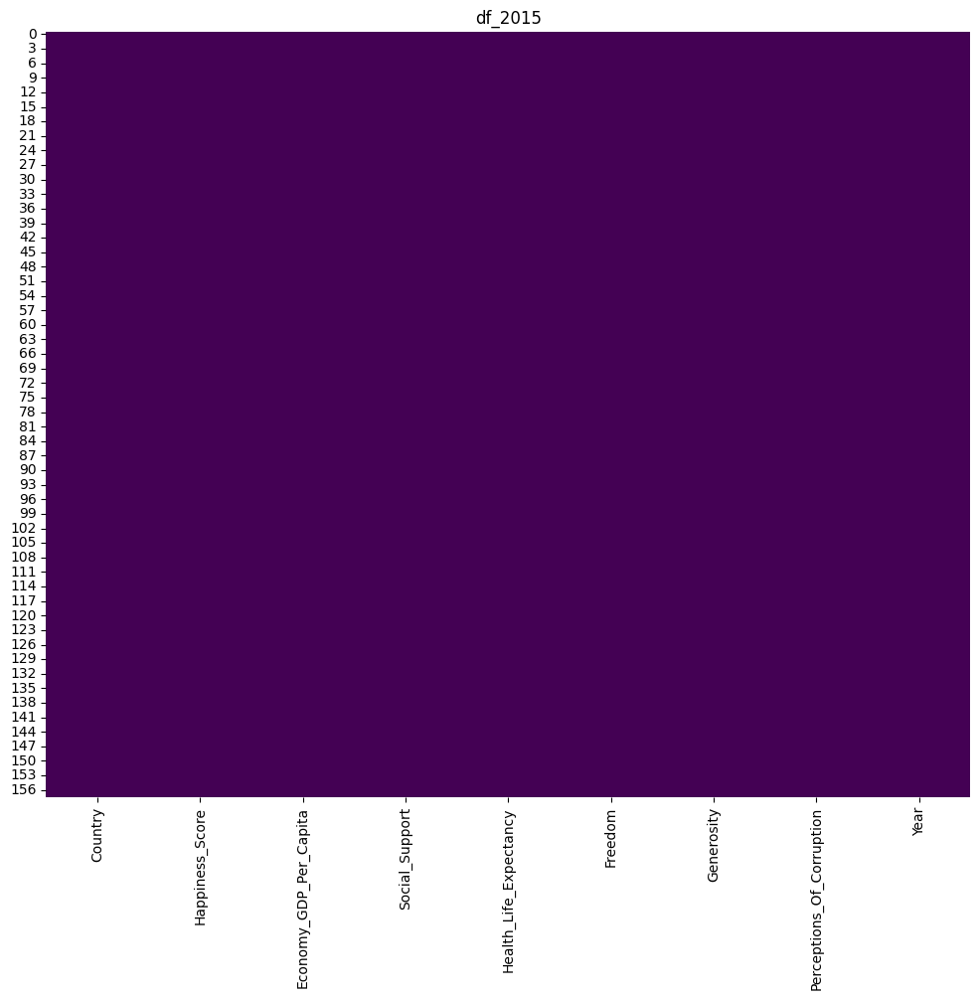

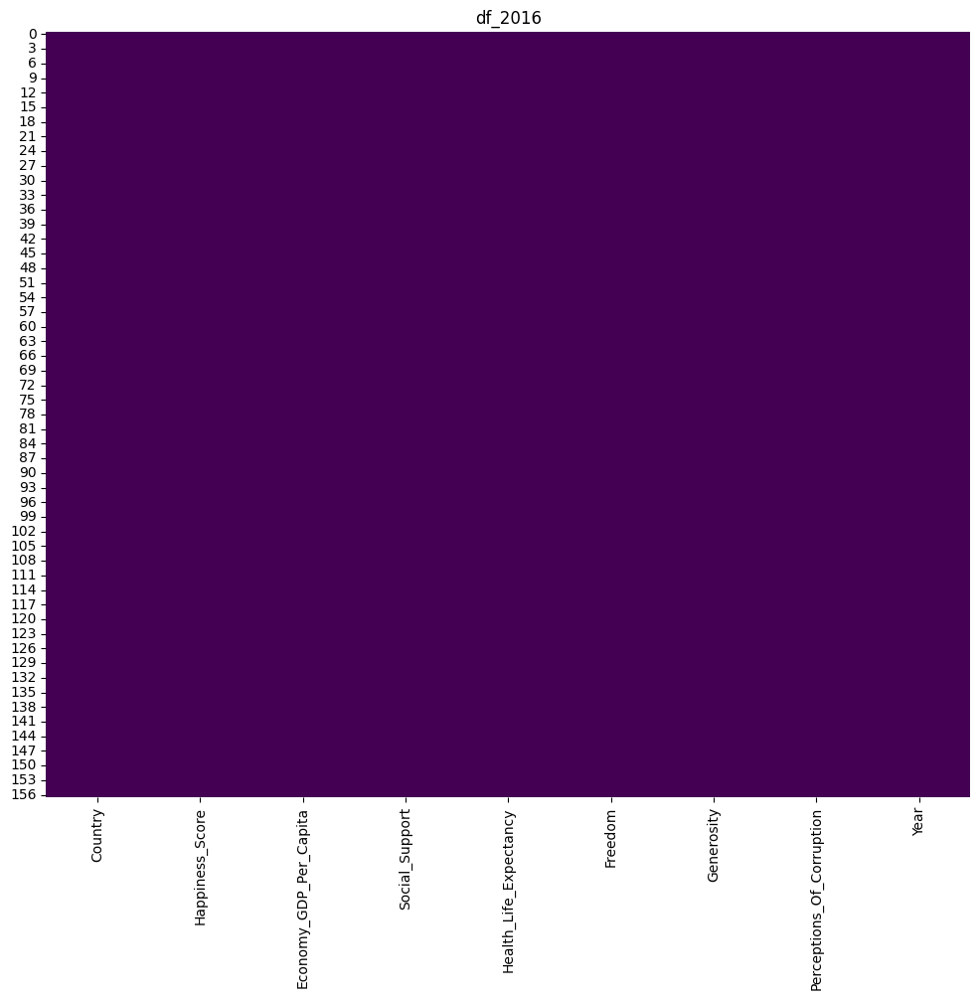

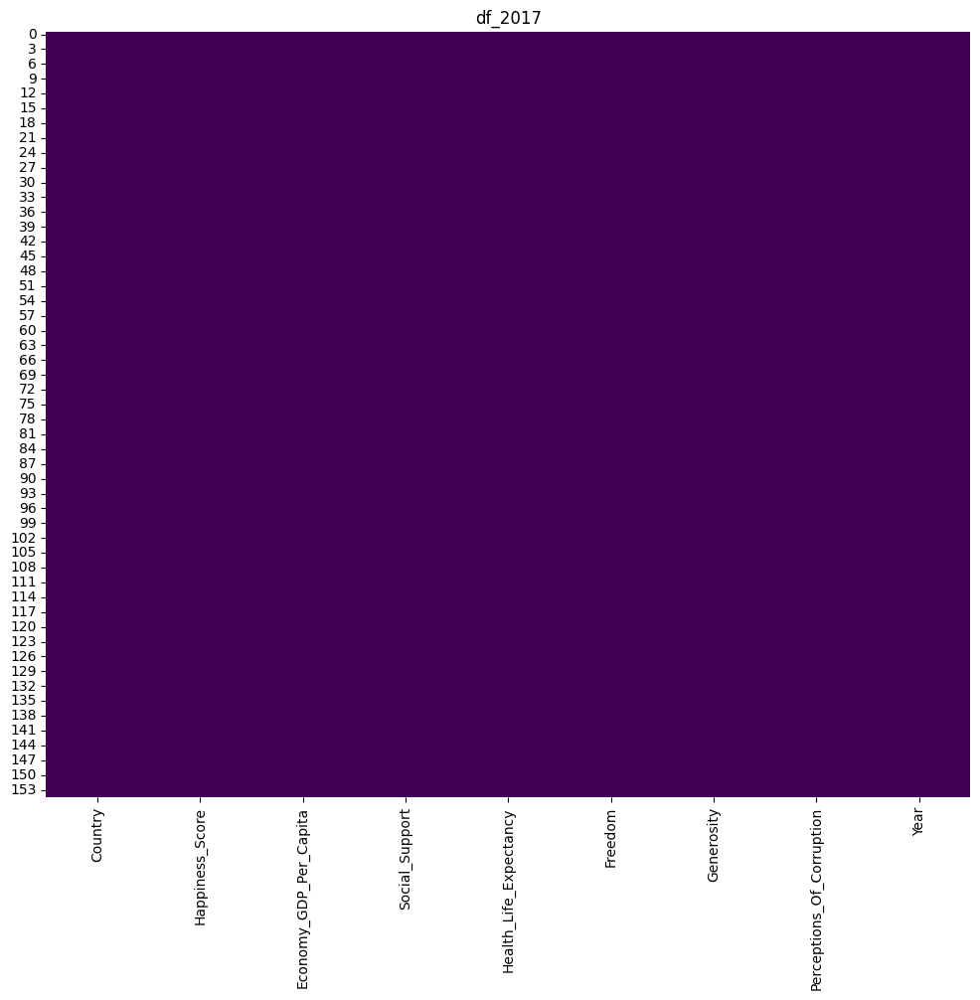

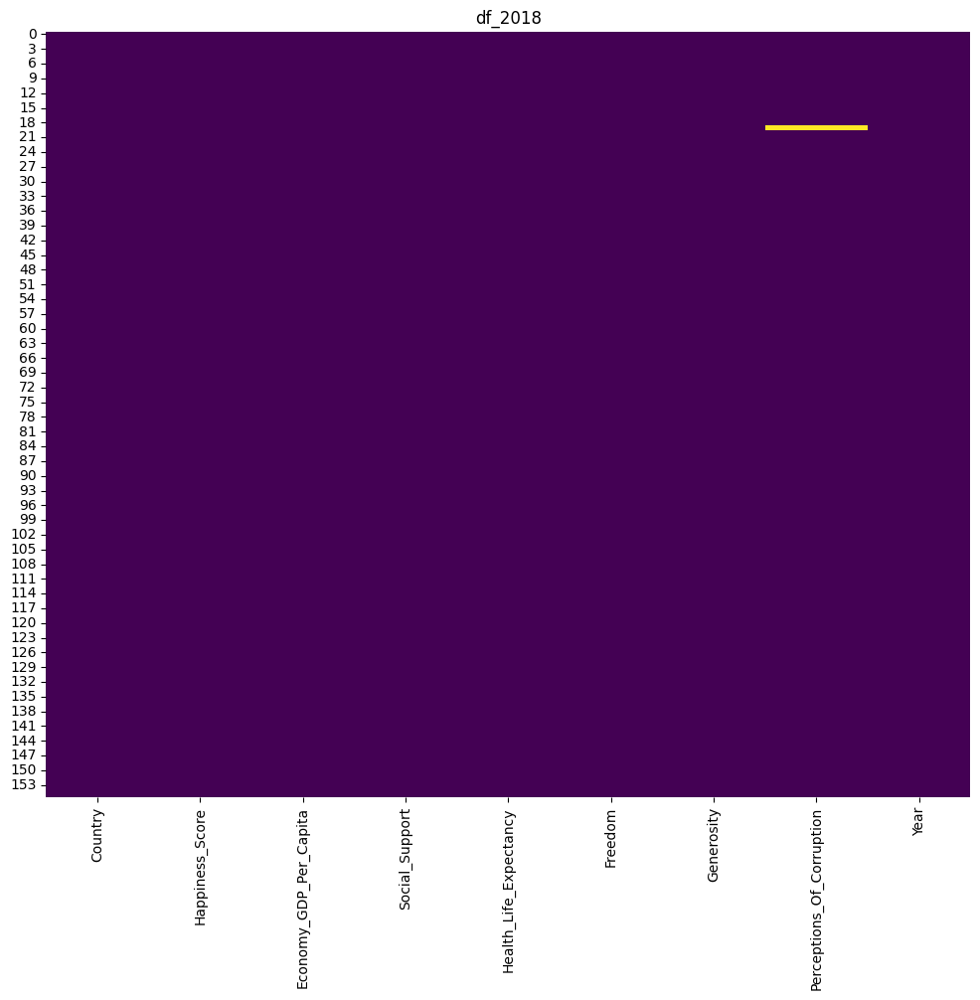

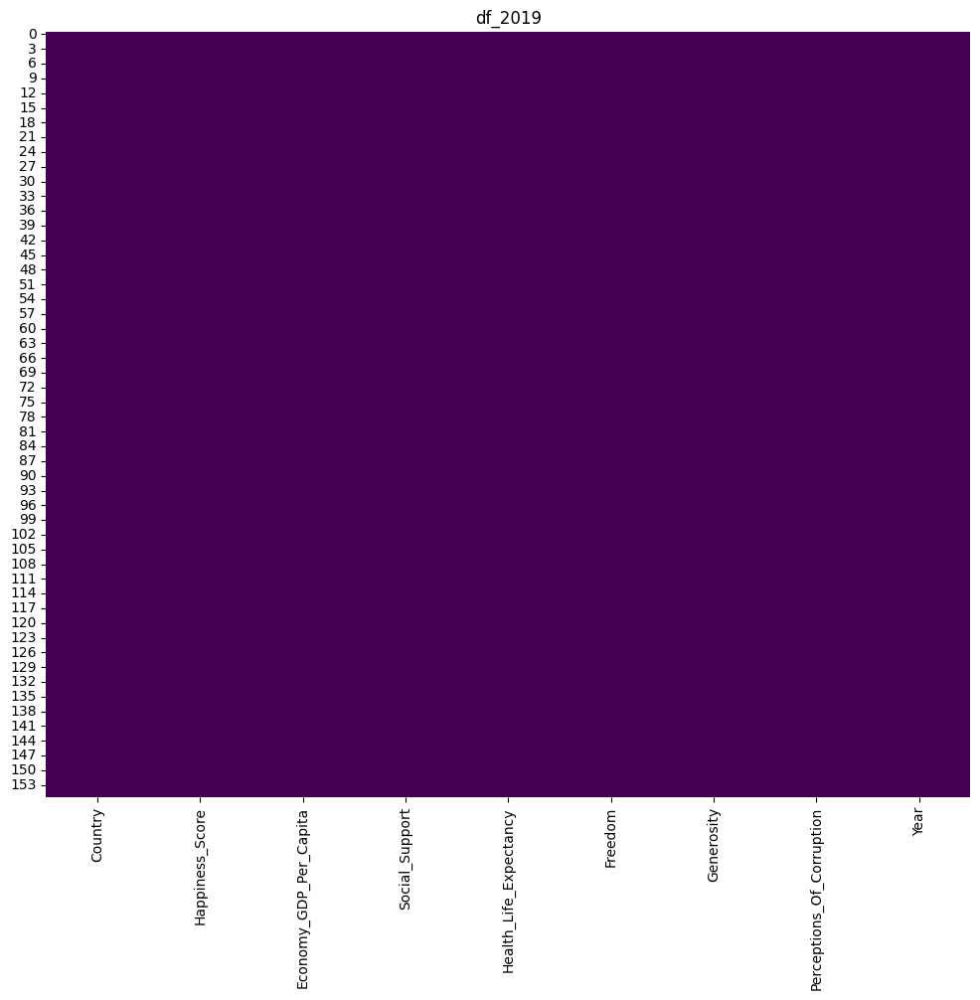

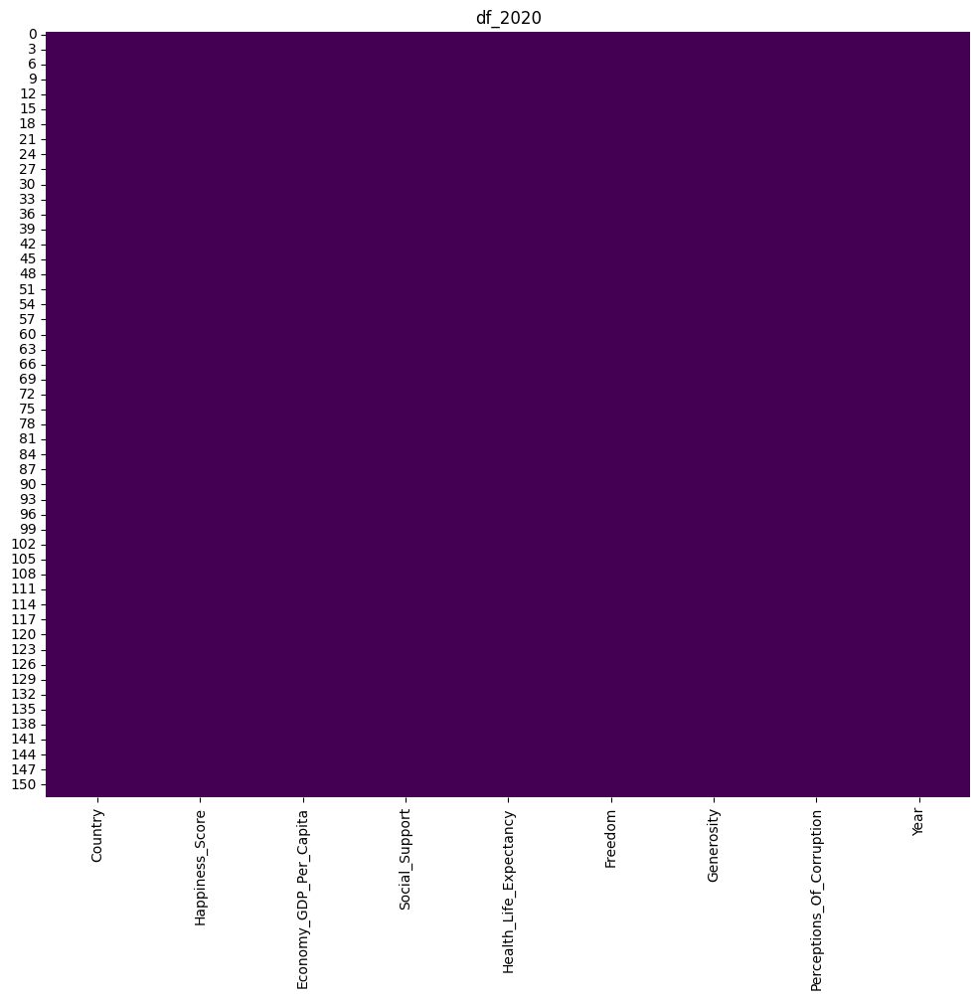

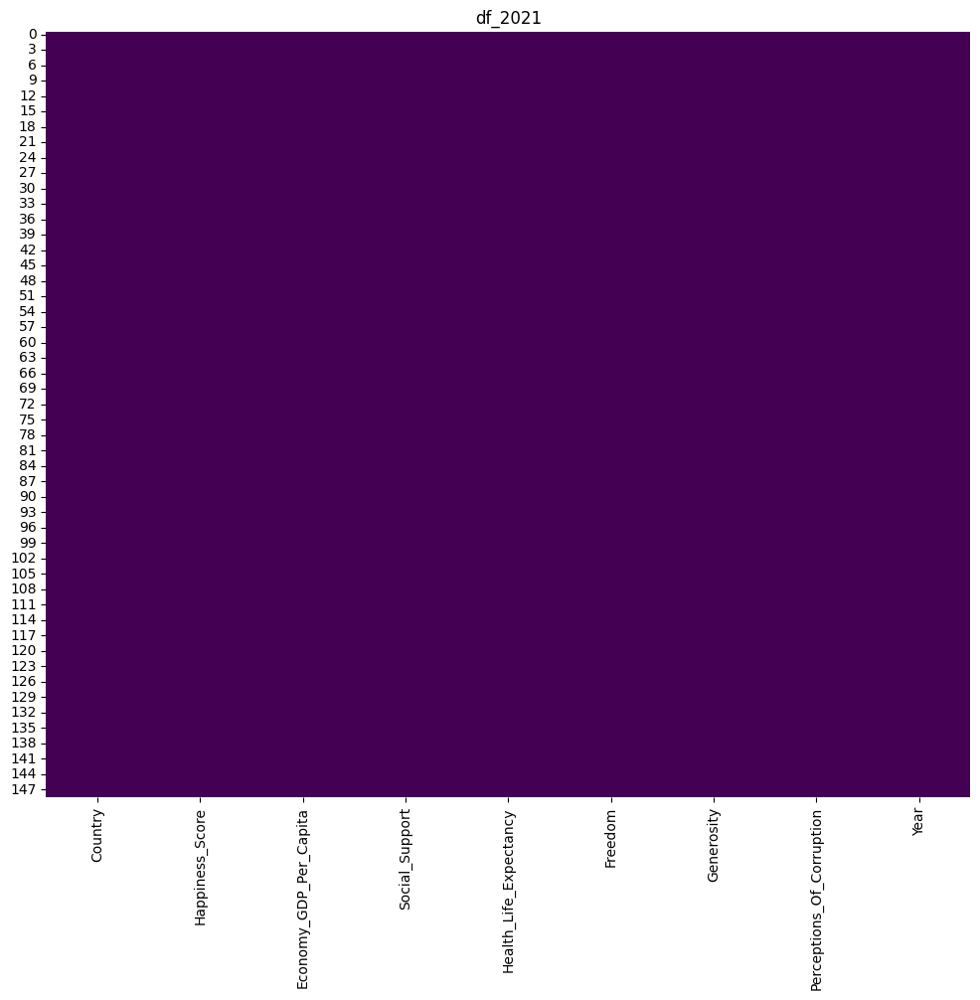

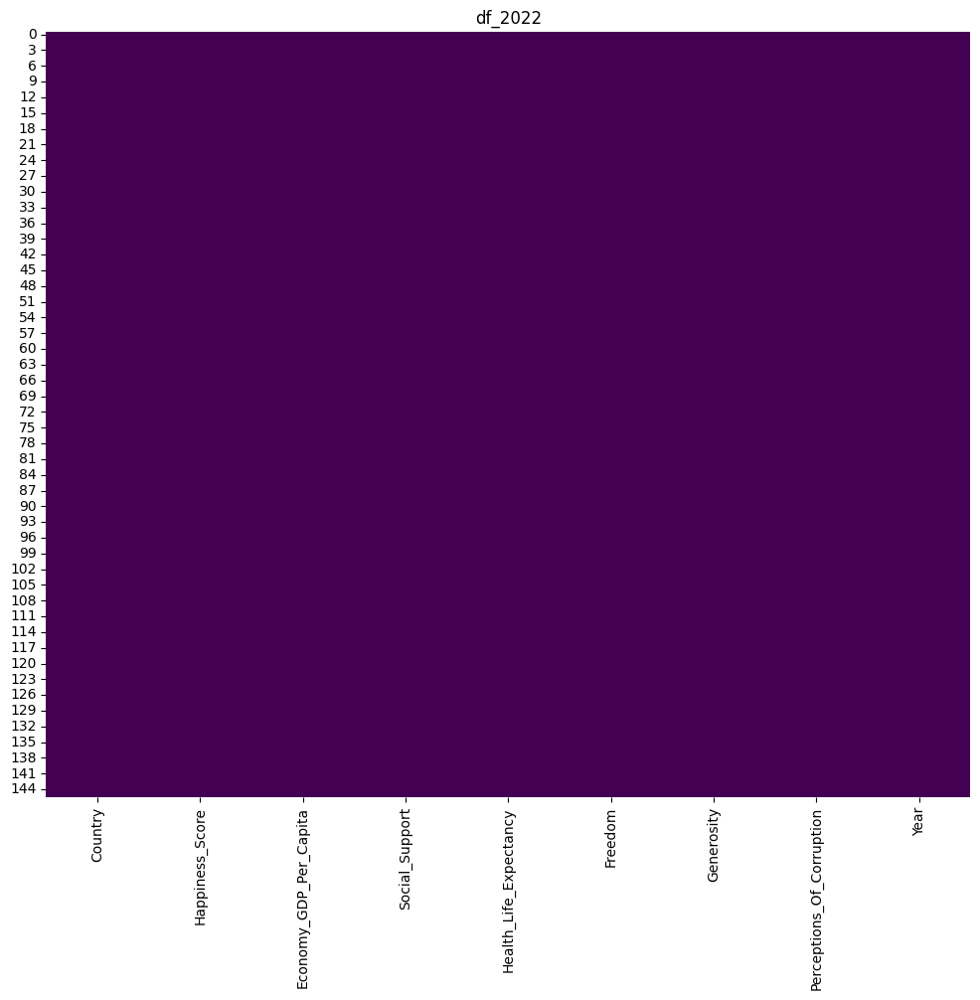

In [17]:
for i in df_list:
    plt.figure(figsize=(12,10))
    sns.heatmap(i.isnull(),cbar=False,cmap='viridis')
    plt.title(i.name)

df_2015


<Axes: >

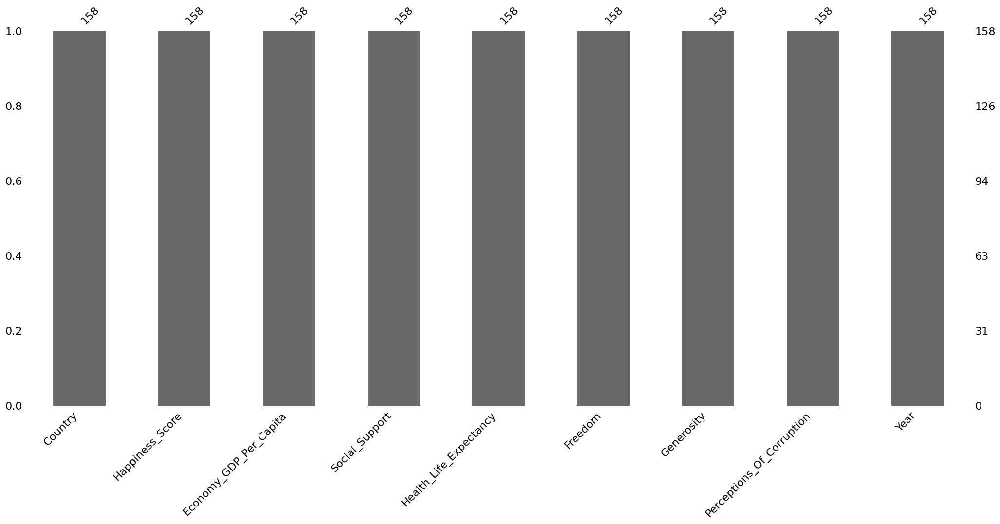

In [18]:
print(df_list[0].name)
msno.bar(df_list[0])

df_2016


<Axes: >

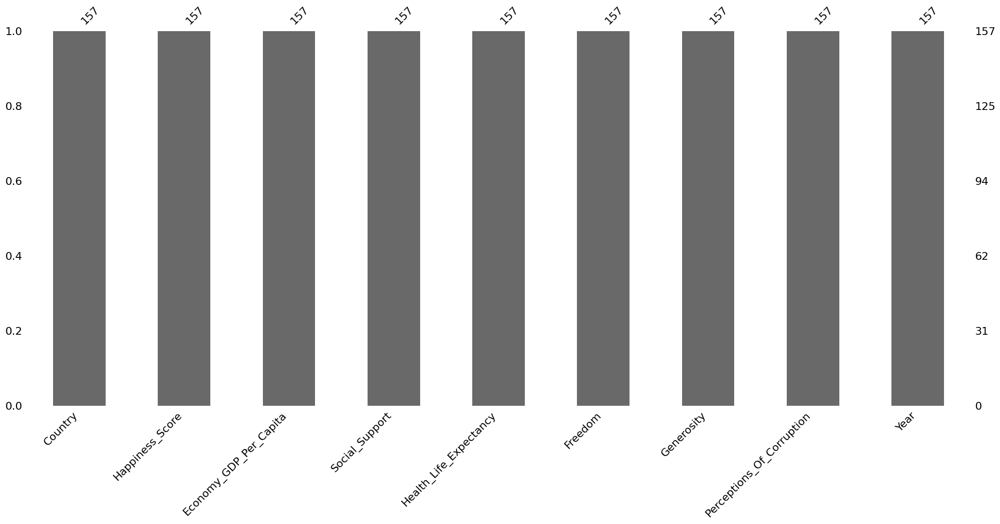

In [19]:
print(df_list[1].name)
msno.bar(df_list[1])

df_2017


<Axes: >

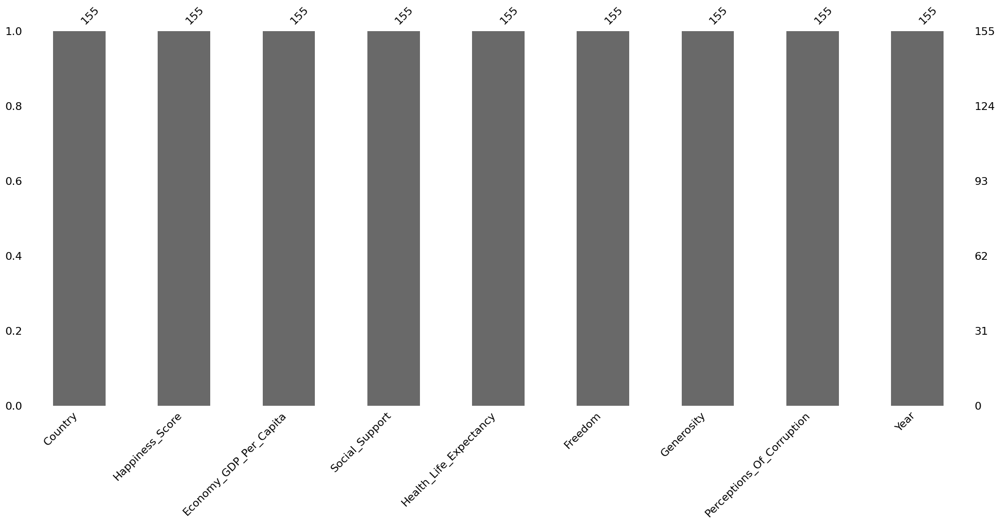

In [20]:
print(df_list[2].name)
msno.bar(df_list[2])

df_2018


<Axes: >

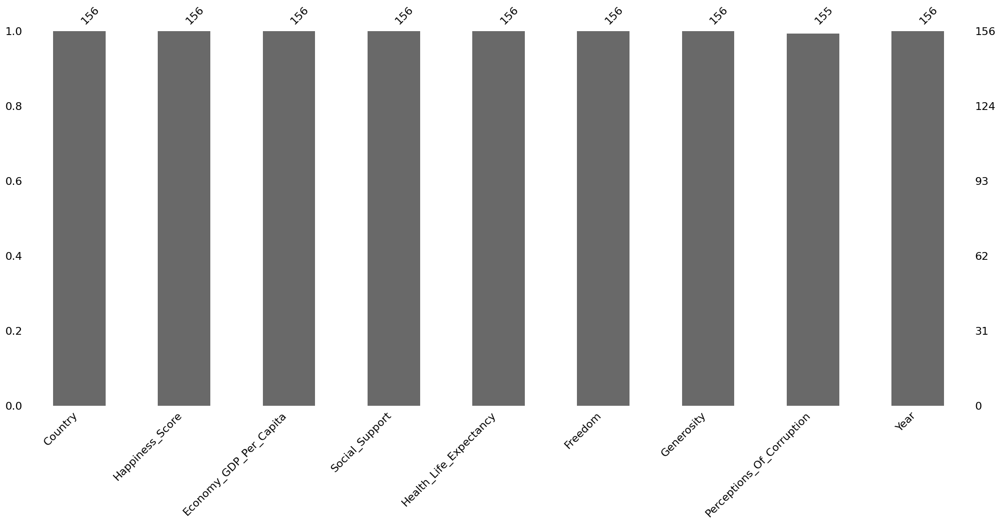

In [21]:
print(df_list[3].name)
msno.bar(df_list[3])

df_2019


<Axes: >

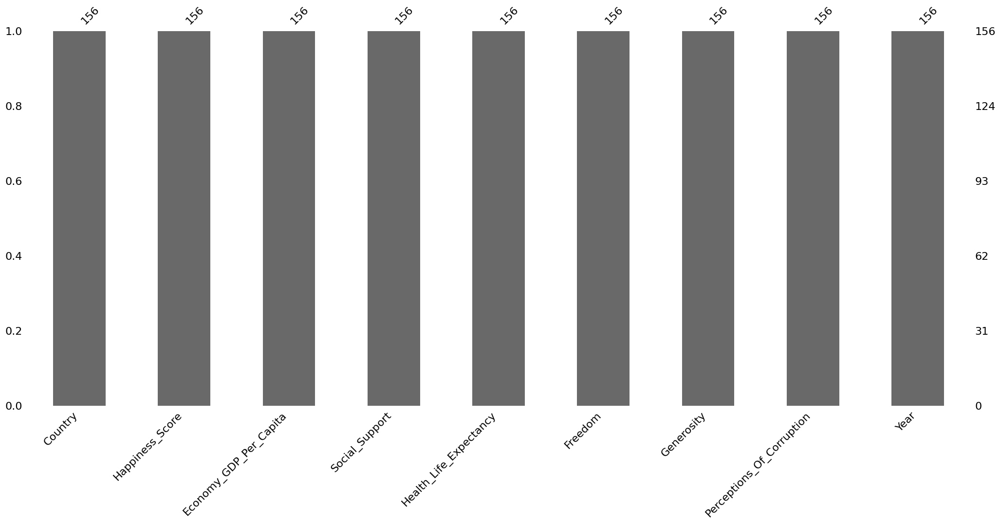

In [22]:
print(df_list[4].name)
msno.bar(df_list[4])

df_2020


<Axes: >

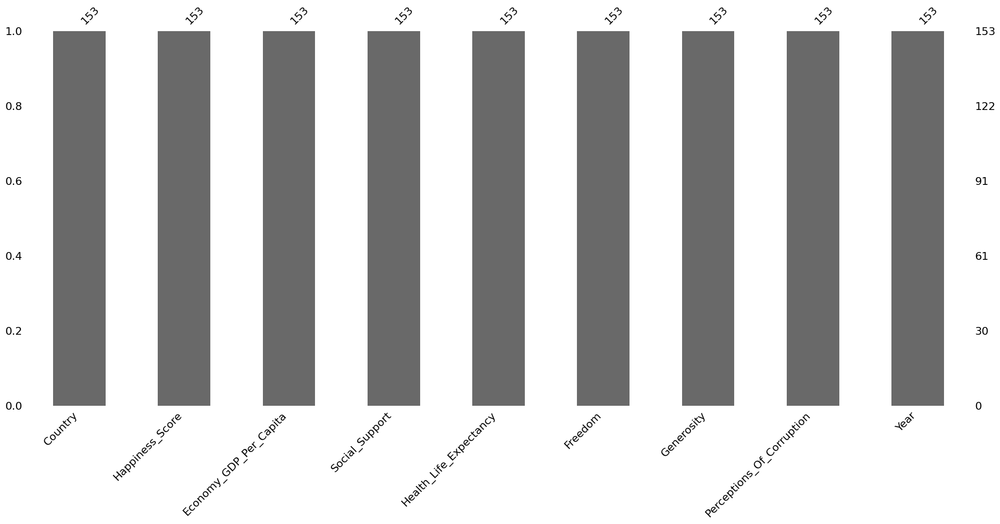

In [23]:
print(df_list[5].name)
msno.bar(df_list[5])

df_2021


<Axes: >

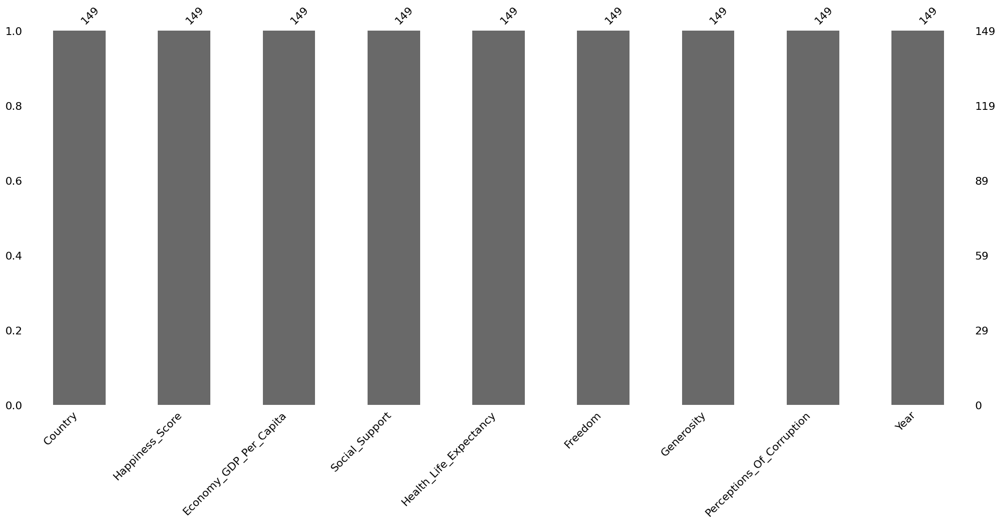

In [24]:
print(df_list[6].name)
msno.bar(df_list[6])

df_2022


<Axes: >

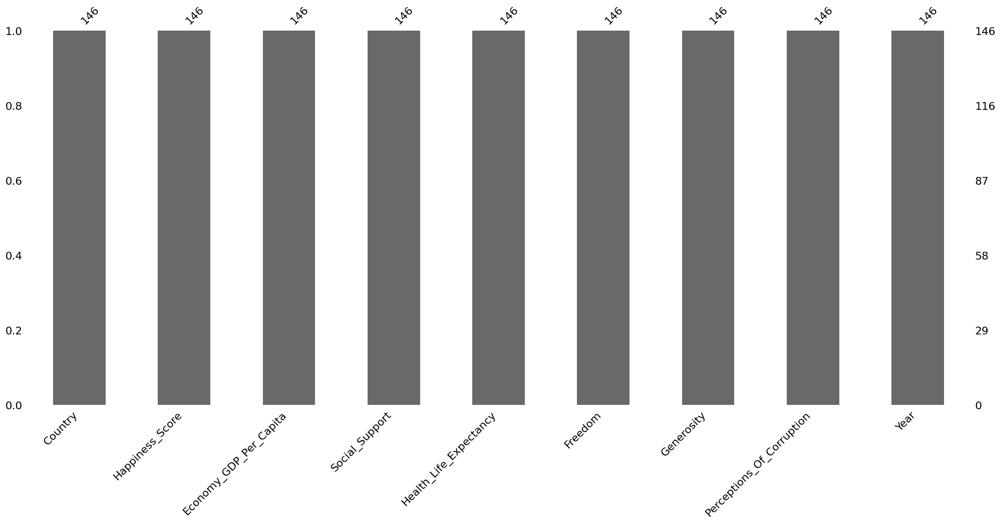

In [25]:
print(df_list[7].name)
msno.bar(df_list[7])

In [26]:
#print(df_list[8].name)
#msno.bar(df_list[8])

df_2015


<Axes: >

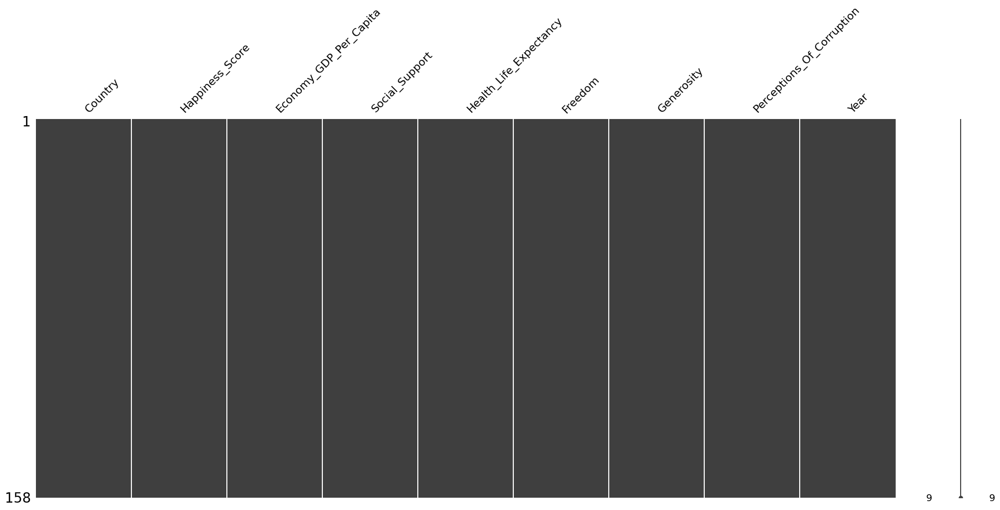

In [27]:
print(df_list[0].name)
msno.matrix(df_list[0])

df_2016


<Axes: >

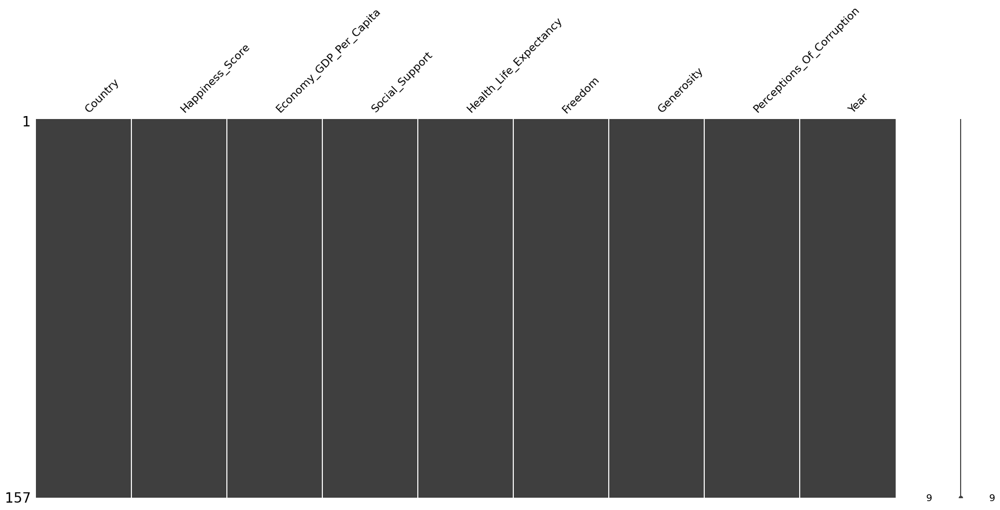

In [28]:
print(df_list[1].name)
msno.matrix(df_list[1])

df_2017


<Axes: >

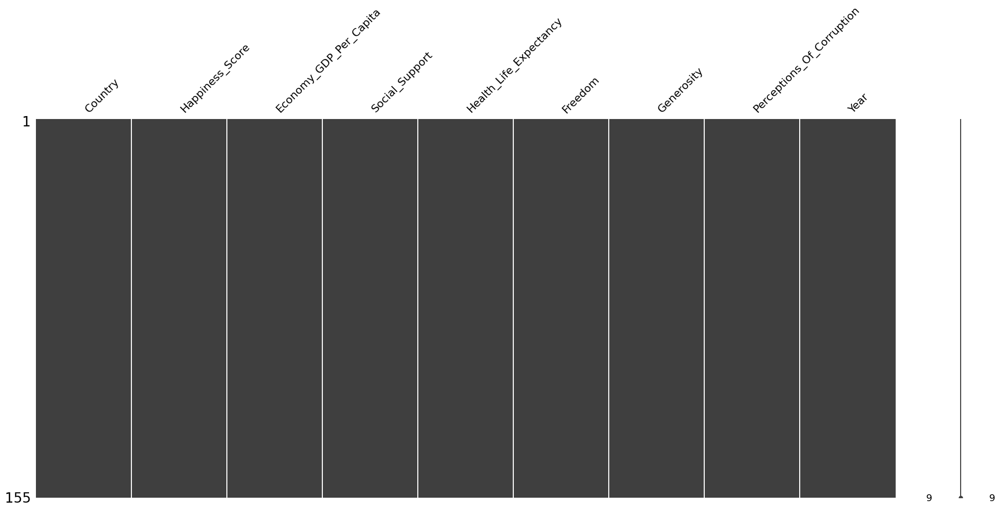

In [29]:
print(df_list[2].name)
msno.matrix(df_list[2])

df_2018


<Axes: >

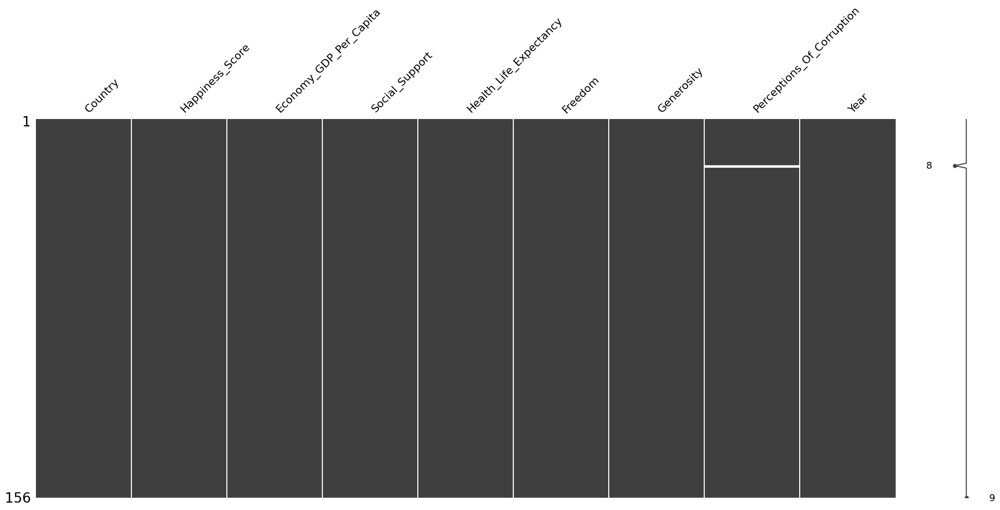

In [30]:
print(df_list[3].name)
msno.matrix(df_list[3])

df_2019


<Axes: >

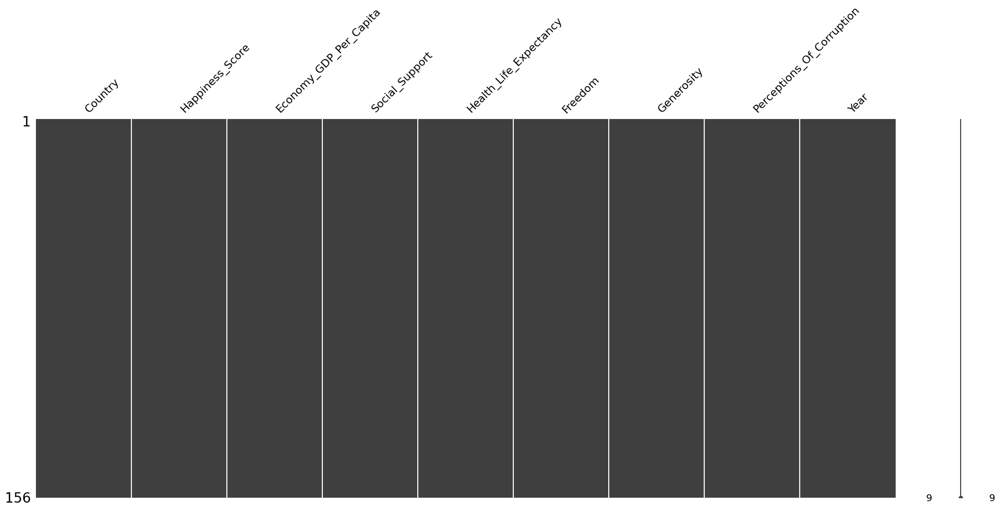

In [31]:
print(df_list[4].name)
msno.matrix(df_list[4])

df_2020


<Axes: >

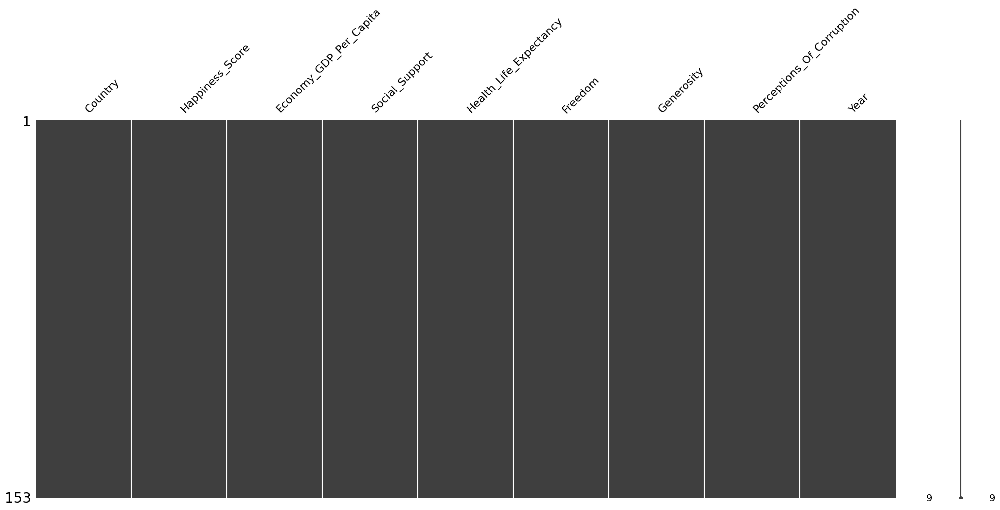

In [32]:
print(df_list[5].name)
msno.matrix(df_list[5])

df_2021


<Axes: >

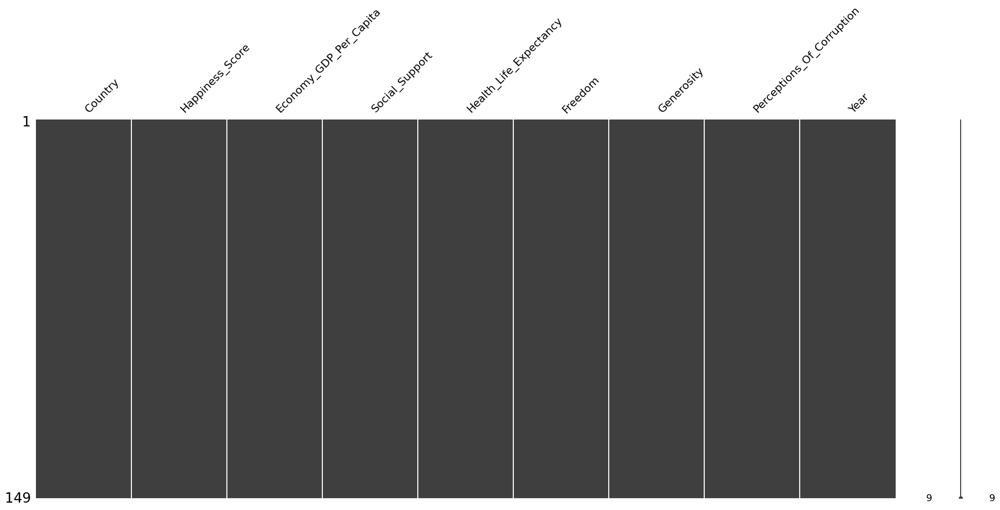

In [33]:
print(df_list[6].name)
msno.matrix(df_list[6])

df_2022


<Axes: >

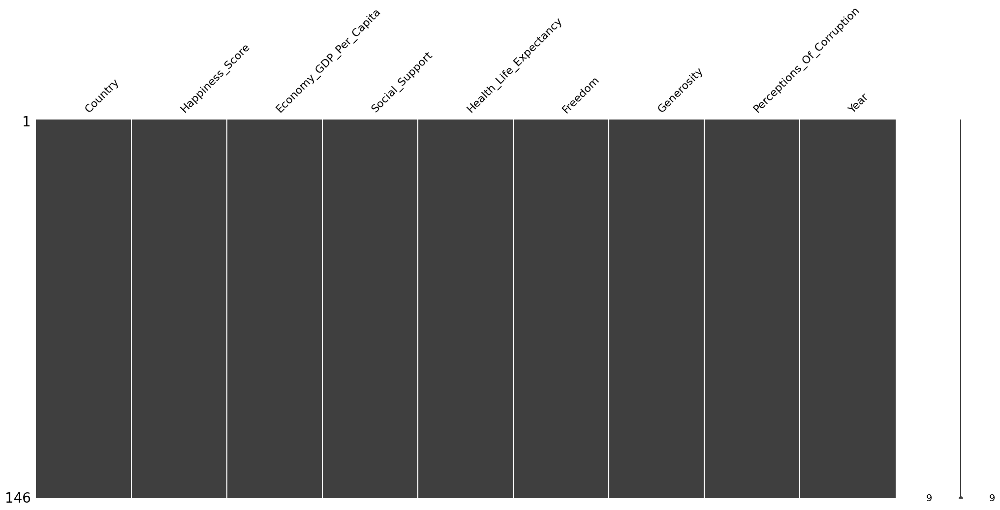

In [34]:
print(df_list[7].name)
msno.matrix(df_list[7])

In [35]:
#print(df_list[8].name)
#msno.matrix(df_list[8])

df_2018


<Axes: >

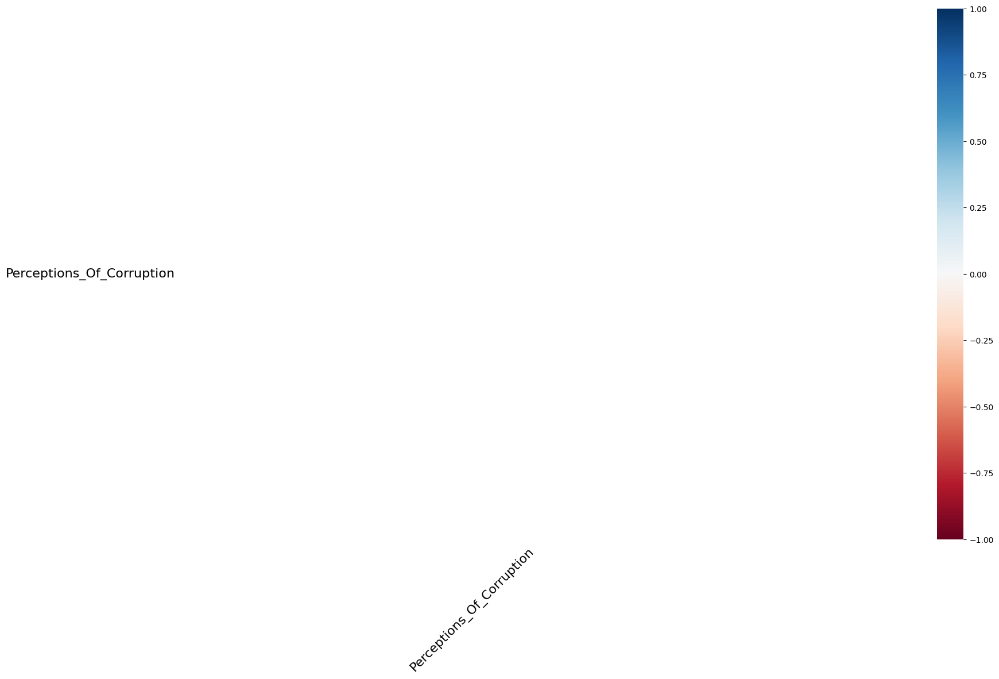

In [36]:
print(df_list[3].name)
msno.heatmap(df_list[3])

In [37]:
#print(df_list[8].name)
#msno.heatmap(df_list[8])

# Finding missing values

in this code, we find the Country's with columns, which have missing values:
- we created a loop over all datasets and print the row with missing values
- we can see, that only in year 2018 (United Arab Emirates) - Perceptions_Of_Corruption and 2023 (State of Palestine) - Health_Life_Expectancy we have missing values

In [38]:
for i in df_list:
    display(i[i.isnull().any(axis = 1)]) # display rows with missing values

,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
19,United Arab Emirates,6.774,2.096,0.776,0.67,0.284,0.186,NaN,2018


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year


# Replacing missing values 

For the replacing of missing values, we use in this step the mean.
- 2018: Perceptions_Of_Corruption

In [39]:
# code for replacing missing values:
# - replace missing values with mean
# - round the number to 4 decimal


df = pd.concat(df_list)                                 # concatenate all Dataset into one dataframe   
df_nan = df[df['Country'] == 'United Arab Emirates']    # get only the defined country (with nan)

display(df_nan)

df_list[3]["Perceptions_Of_Corruption"].fillna(df_nan['Perceptions_Of_Corruption'].mean(), inplace = True) # Change the "NAN" value: use the mean for all years from the one country
display(df_list[3][df_list[3]['Country'] == 'United Arab Emirates'])

#df_list[3]["Perceptions_Of_Corruption"].fillna(df_list[3]["Perceptions_Of_Corruption"].mean(), inplace = True)                                # year 2018
#df_list[3]["Perceptions_Of_Corruption"] = df_list[3]["Perceptions_Of_Corruption"].apply(lambda x: round(x, 4) if isinstance(x, float) else x) # round the columns to 4 decimal numbers

#df_list[8]["Health_Life_Expectancy"].fillna(df_list[8]["Health_Life_Expectancy"].mean(), inplace = True)                                      # year 2023
#df_list[8]["Health_Life_Expectancy"] = df_list[8]["Health_Life_Expectancy"].apply(lambda x: round(x, 4) if isinstance(x, float) else x)       # round the columns to 4 decimal numbers

,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
19,United Arab Emirates,6.9010,1.427270,1.125750,0.809250,0.641570,0.264280,0.385830,2015
27,United Arab Emirates,6.5730,1.573520,0.871140,0.729930,0.562150,0.265910,0.355610,2016
20,United Arab Emirates,6.6480,1.626343,1.266410,0.726798,0.608345,0.360942,0.324490,2017
19,United Arab Emirates,6.7740,2.096000,0.776000,0.670000,0.284000,0.186000,NaN,2018
20,United Arab Emirates,6.8250,1.503000,1.310000,0.825000,0.598000,0.262000,0.182000,2019
20,United Arab Emirates,6.7908,1.431086,1.251171,0.787814,0.652936,0.280656,0.220214,2020
24,United Arab Emirates,6.5610,1.555000,0.860000,0.594000,0.670000,0.236000,0.223000,2021
23,United Arab Emirates,6.5760,1.998000,0.980000,0.633000,0.702000,0.204000,0.250000,2022


C:\Users\vidpm05\AppData\Local\Temp\1\ipykernel_12092\2060275898.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_list[3]["Perceptions_Of_Corruption"].fillna(df_nan['Perceptions_Of_Corruption'].mean(), inplace = True) # Change the "NAN" value: use the mean for all years from the one country


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
19,United Arab Emirates,6.774,2.096,0.776,0.67,0.284,0.186,0.277306,2018


# Check missing values

- loop over all datasets (2015 - 2022)
- checking the sum of missing values, when result = 0, then OK

In [40]:
for i in df_list:
    print("Dataset: ", i.name)
    print(i.isnull().sum())
    print()

Dataset:  df_2015
Country                      0
Happiness_Score              0
Economy_GDP_Per_Capita       0
Social_Support               0
Health_Life_Expectancy       0
Freedom                      0
Generosity                   0
Perceptions_Of_Corruption    0
Year                         0
dtype: int64

Dataset:  df_2016
Country                      0
Happiness_Score              0
Economy_GDP_Per_Capita       0
Social_Support               0
Health_Life_Expectancy       0
Freedom                      0
Generosity                   0
Perceptions_Of_Corruption    0
Year                         0
dtype: int64

Dataset:  df_2017
Country                      0
Happiness_Score              0
Economy_GDP_Per_Capita       0
Social_Support               0
Health_Life_Expectancy       0
Freedom                      0
Generosity                   0
Perceptions_Of_Corruption    0
Year                         0
dtype: int64

Dataset:  df_2018
Country                      0
Happiness_Score   

# Checking data distibution 

- the columns are in all datasets equal, we need only one list
- we delete the column "YEAR", we don't need this column for data distibution, is only for time series

In [41]:
numeric_cols = df_list[0].select_dtypes(include='number').columns
numeric_cols = numeric_cols.drop("Year")
numeric_cols

Index(['Happiness_Score', 'Economy_GDP_Per_Capita', 'Social_Support',
       'Health_Life_Expectancy', 'Freedom', 'Generosity',
       'Perceptions_Of_Corruption'],
      dtype='object')

- print plots over years:

Dataset =  df_2015


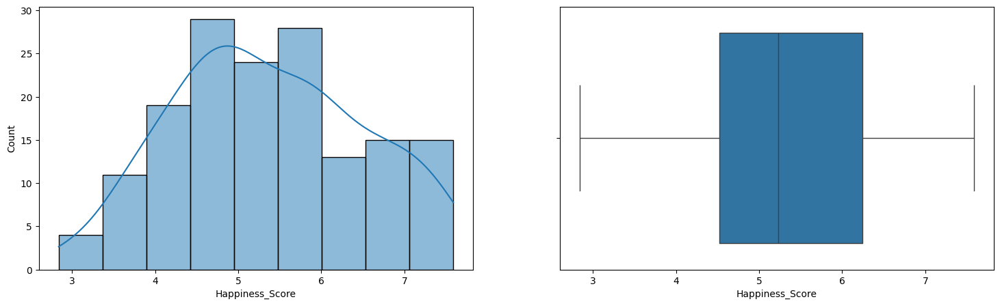

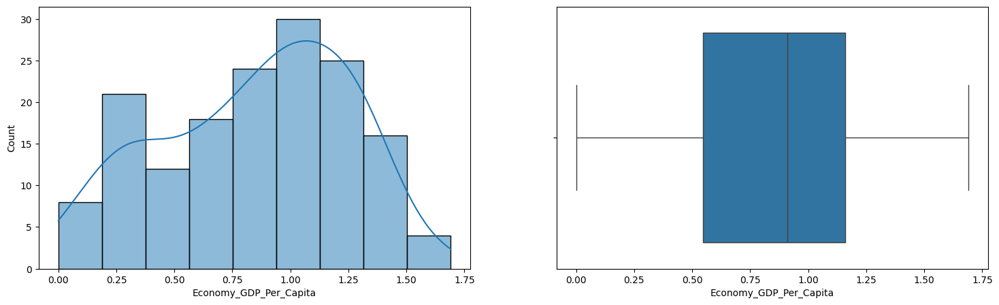

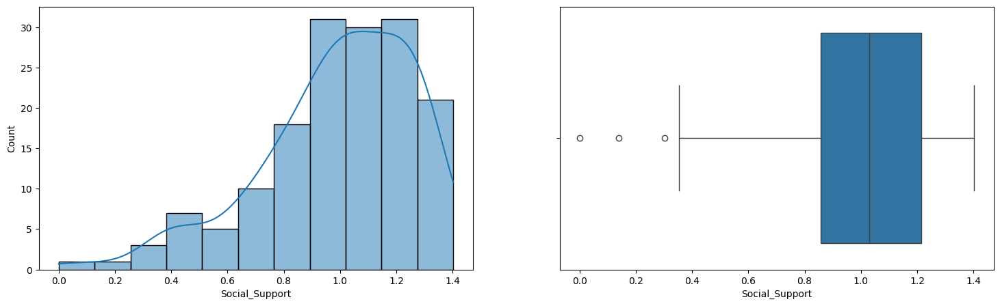

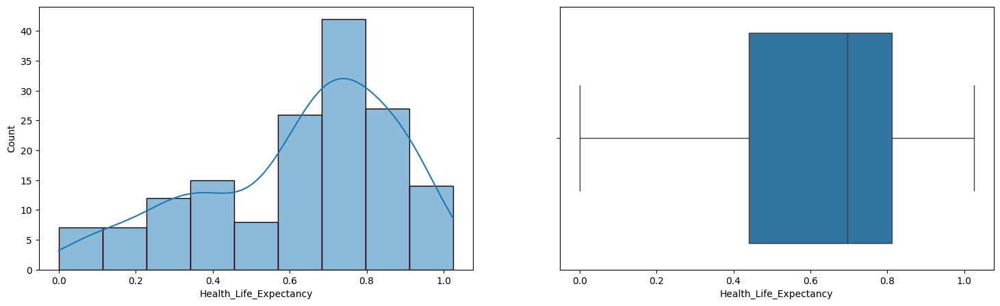

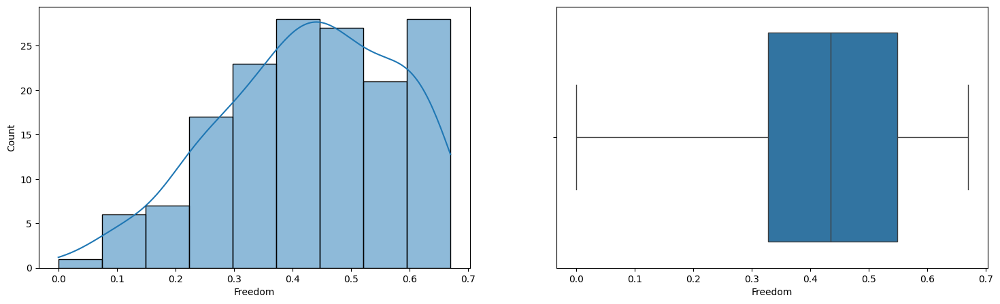

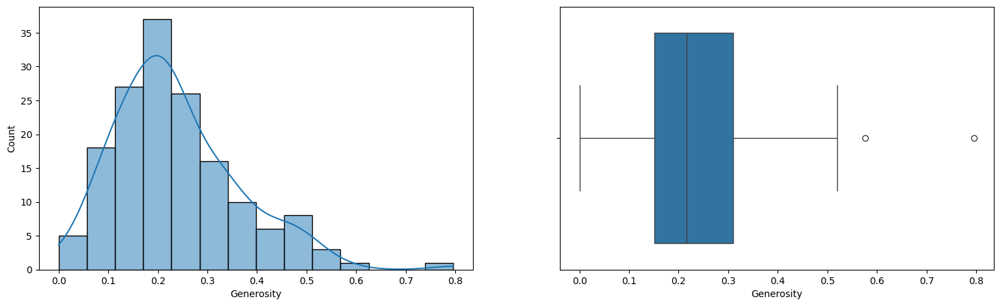

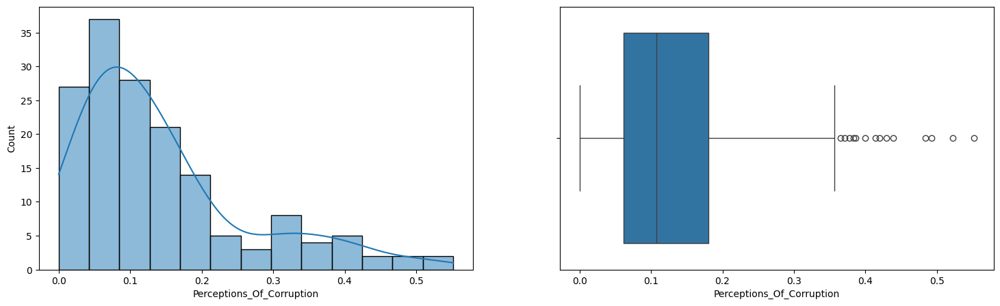

Dataset =  df_2016


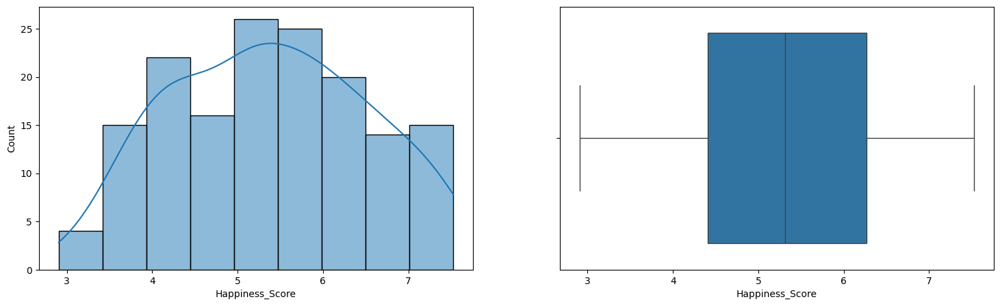

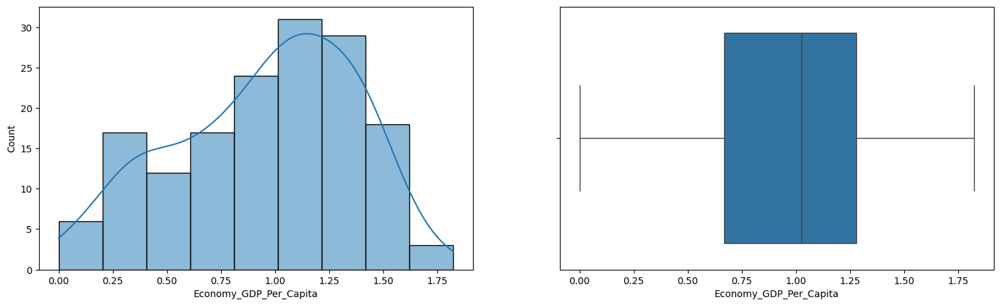

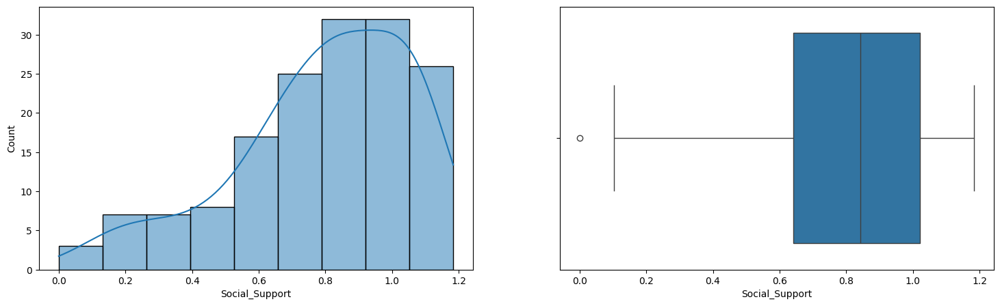

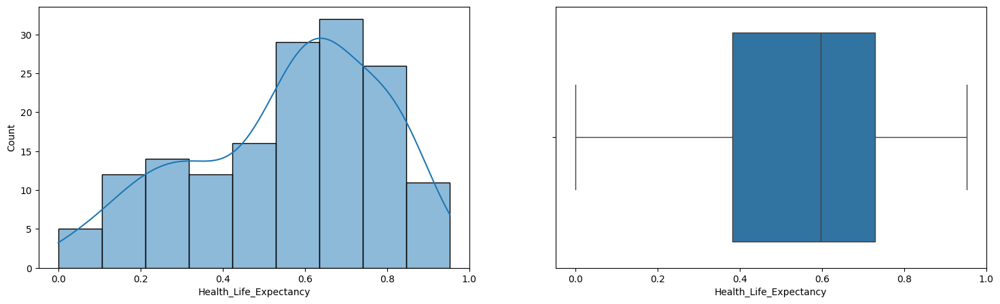

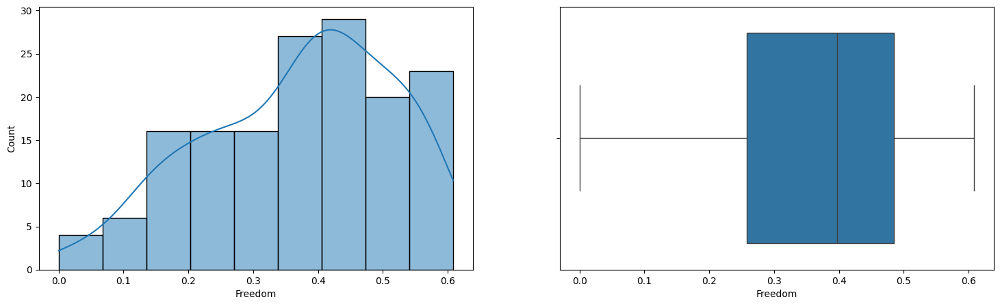

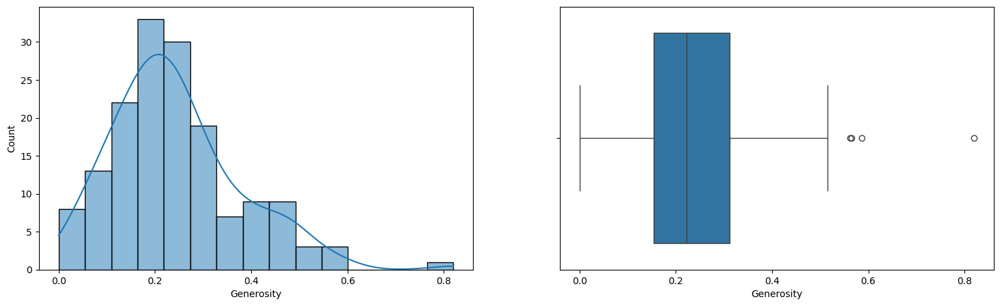

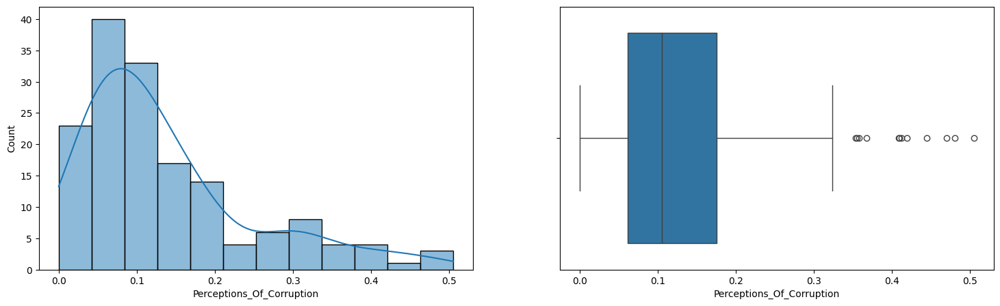

Dataset =  df_2017


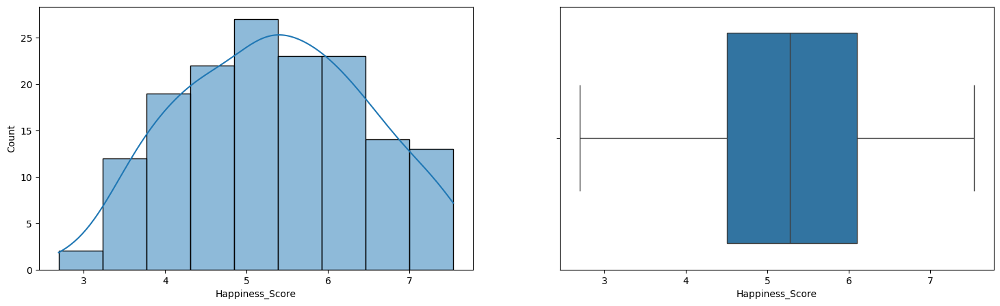

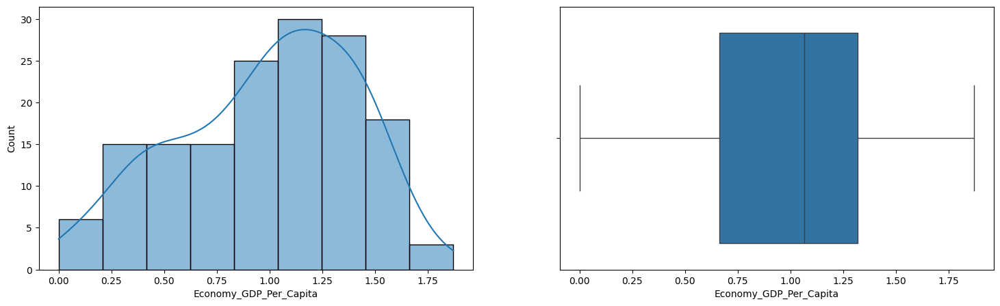

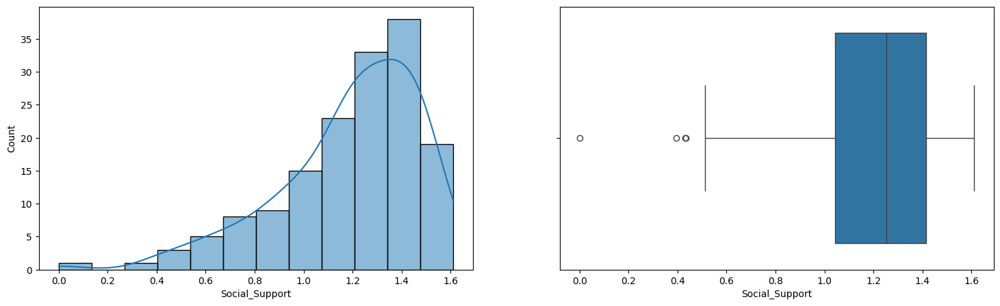

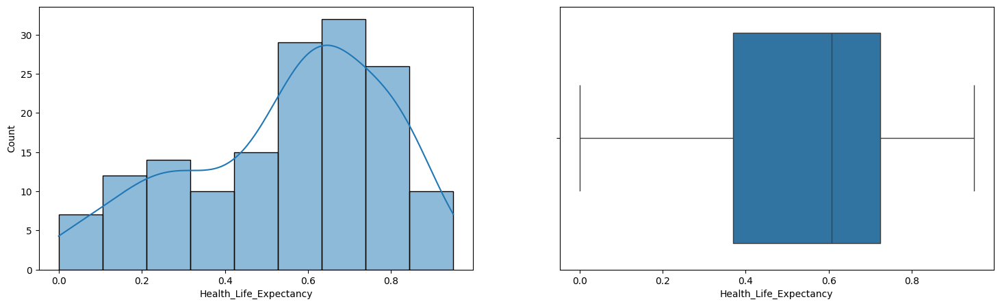

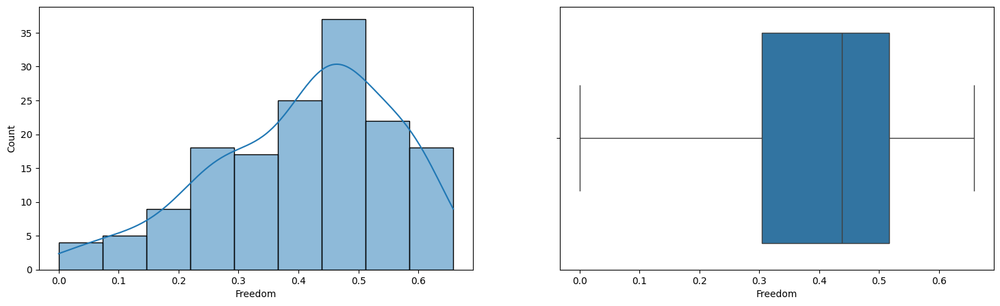

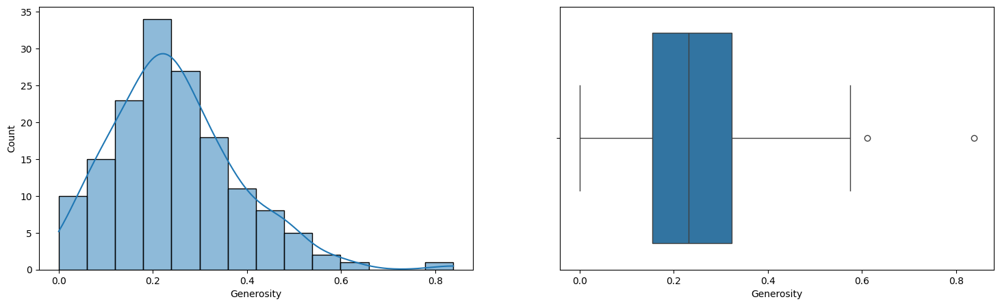

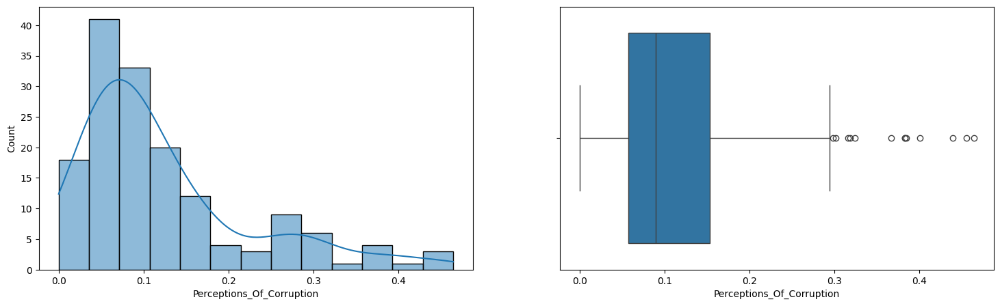

Dataset =  df_2018


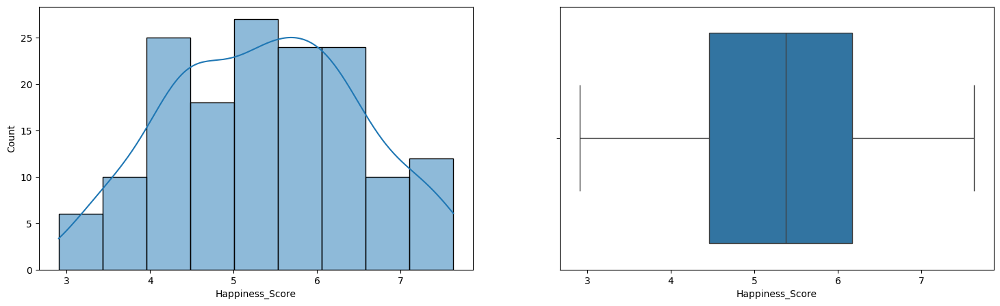

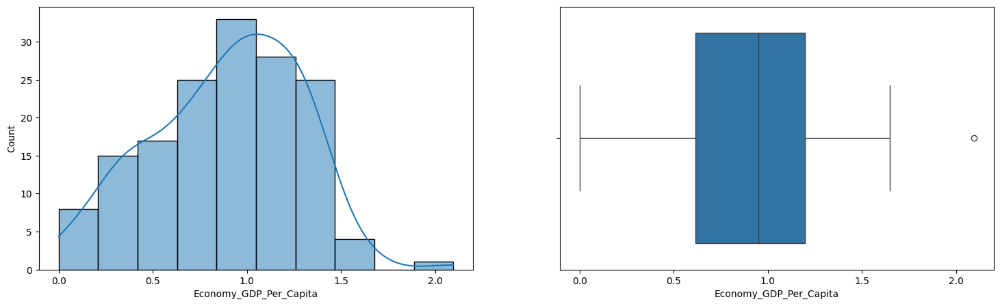

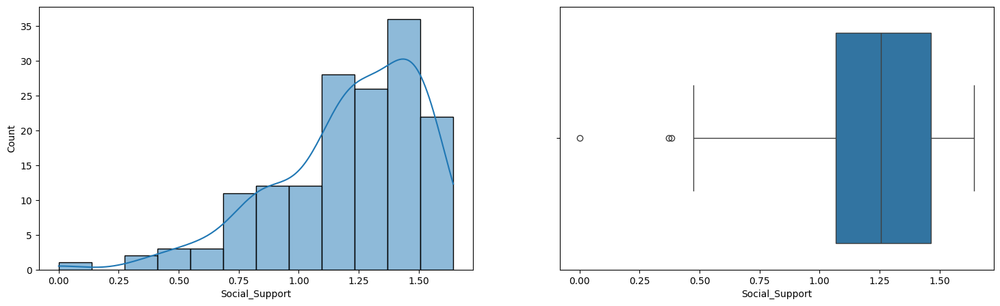

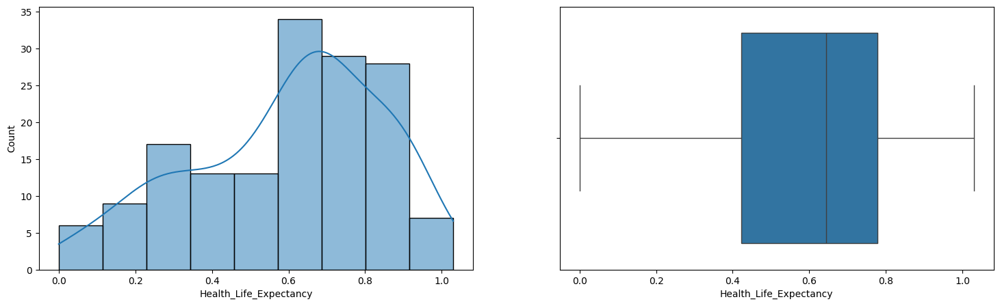

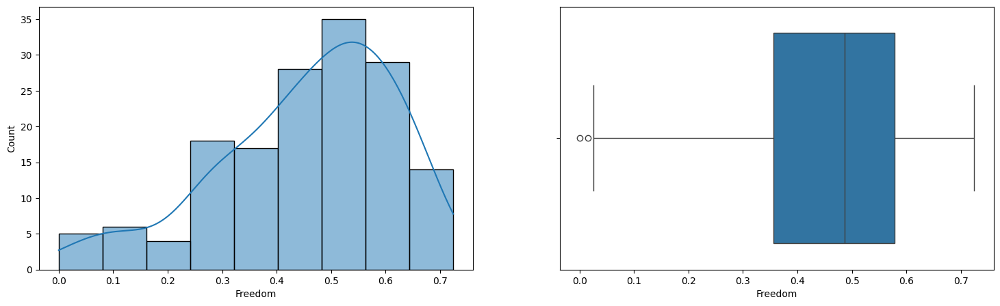

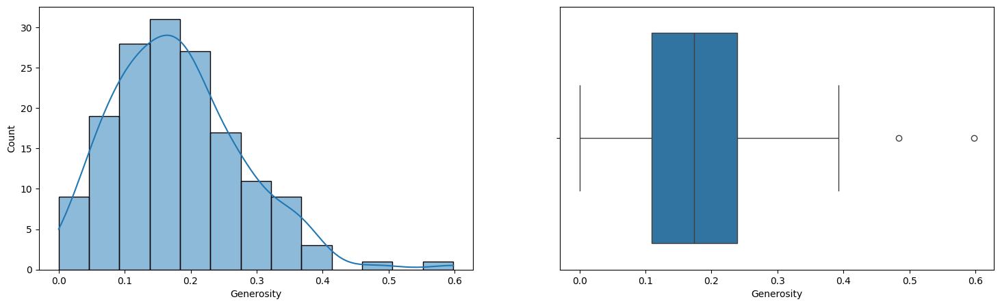

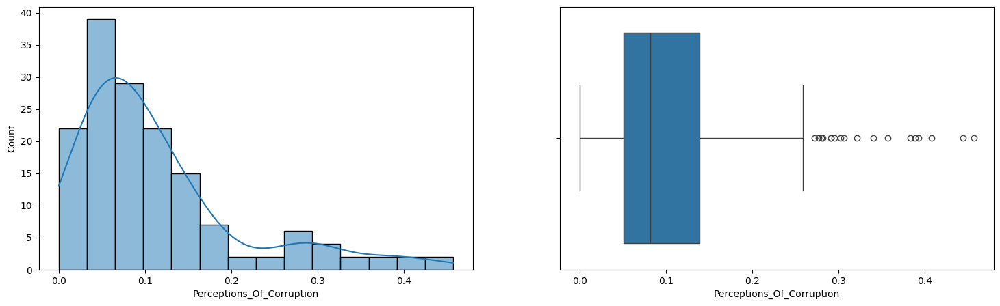

Dataset =  df_2019


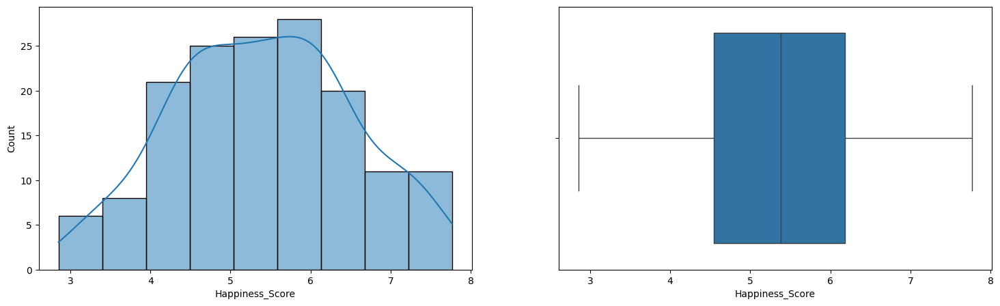

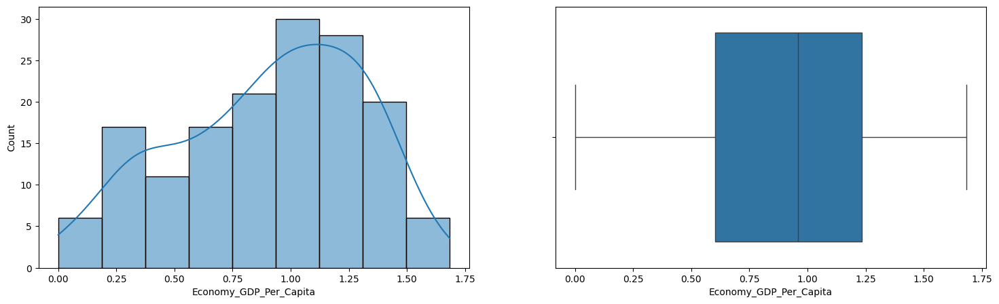

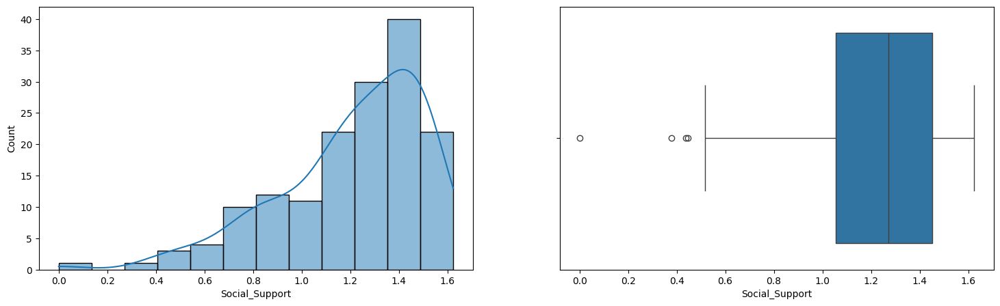

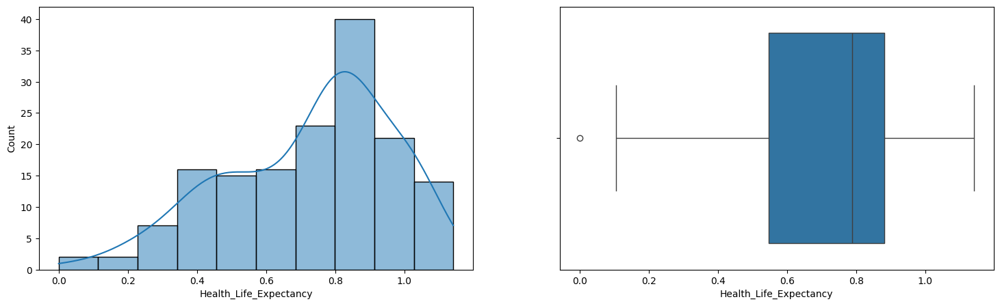

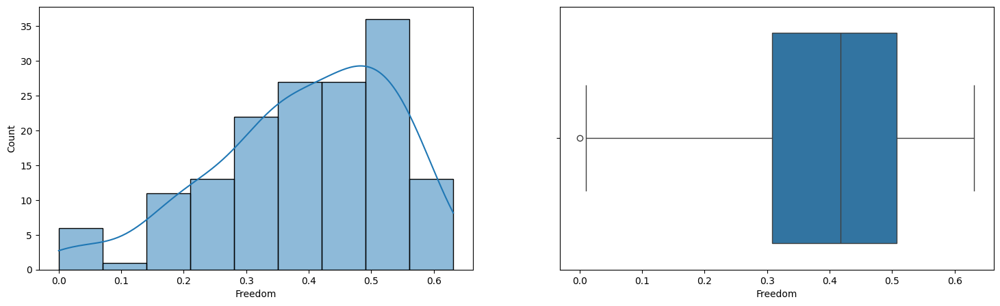

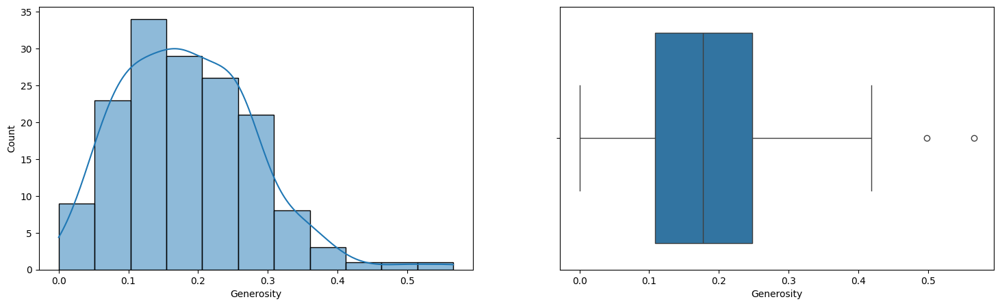

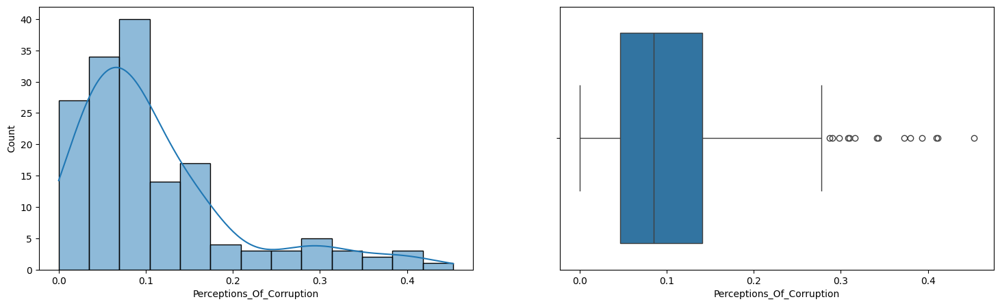

Dataset =  df_2020


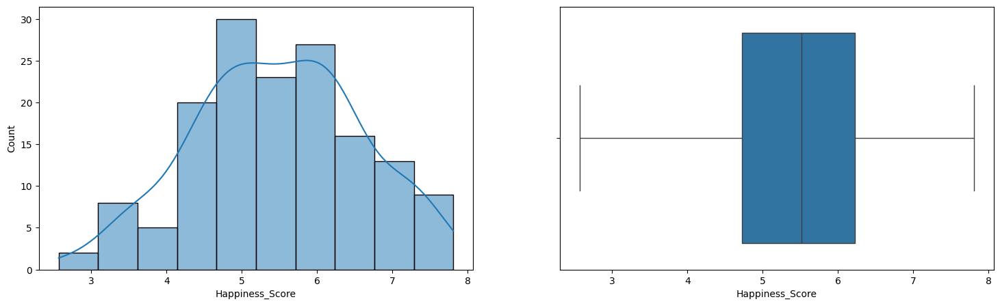

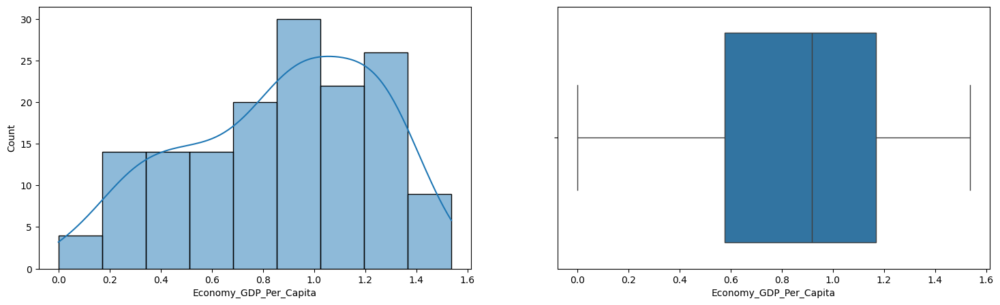

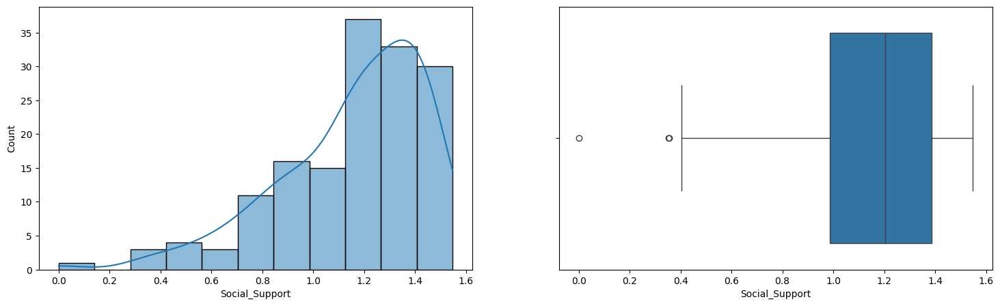

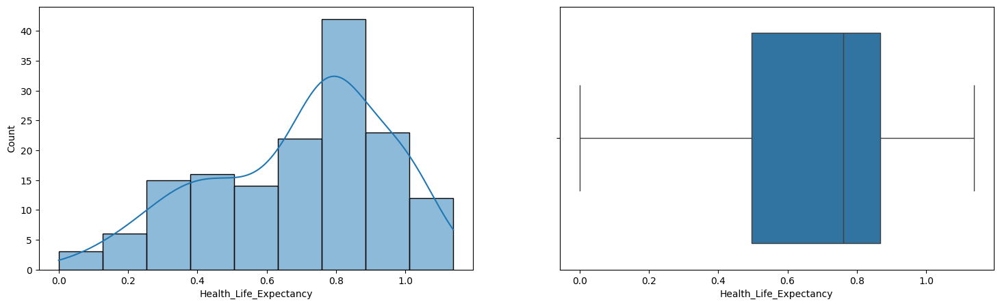

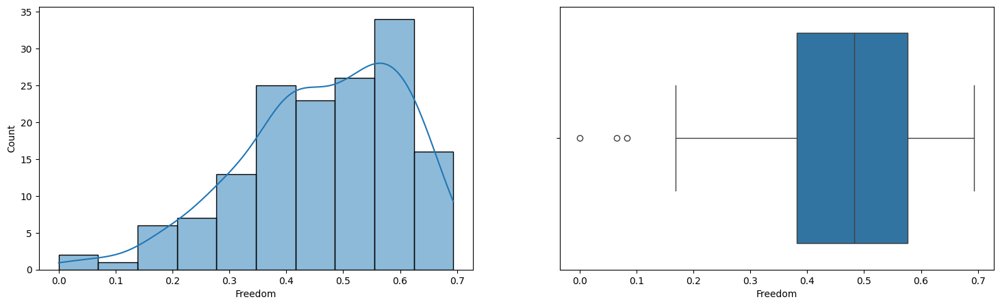

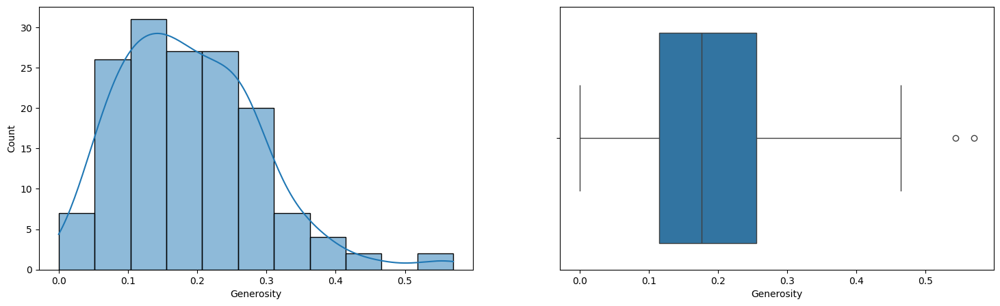

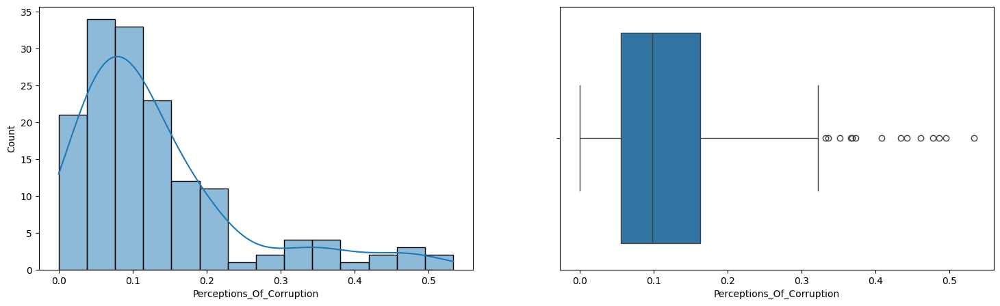

Dataset =  df_2021


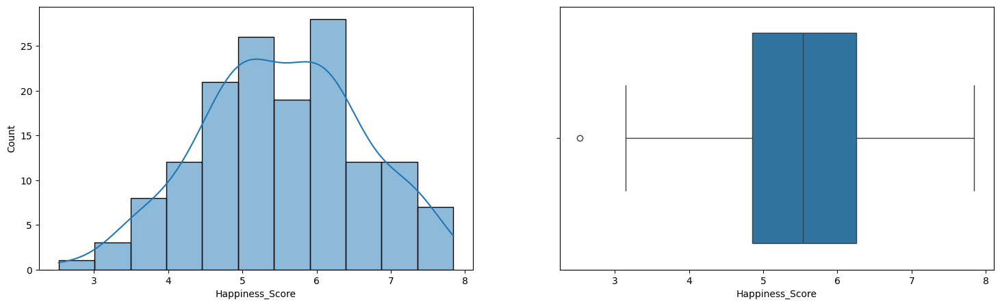

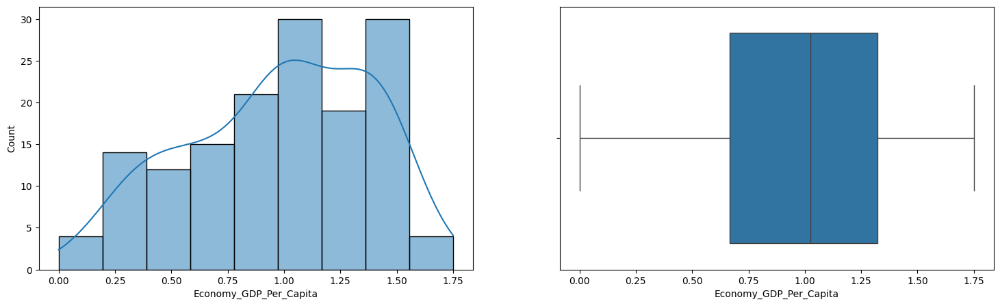

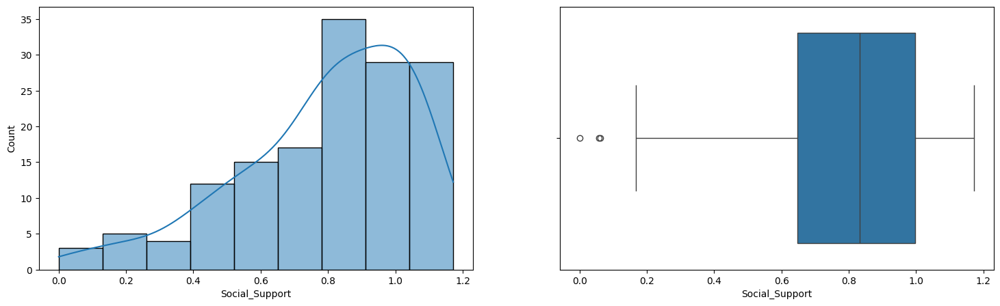

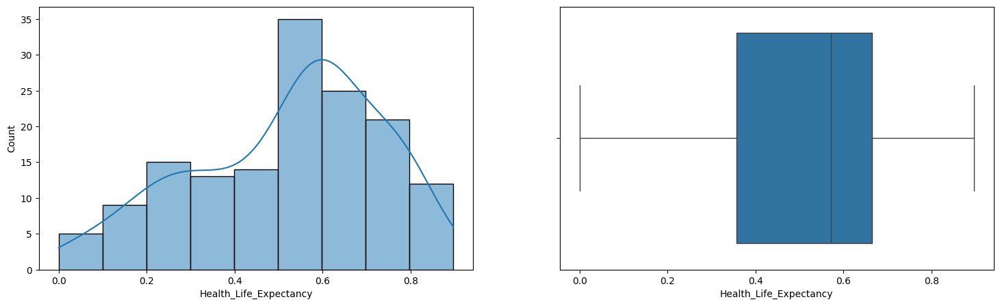

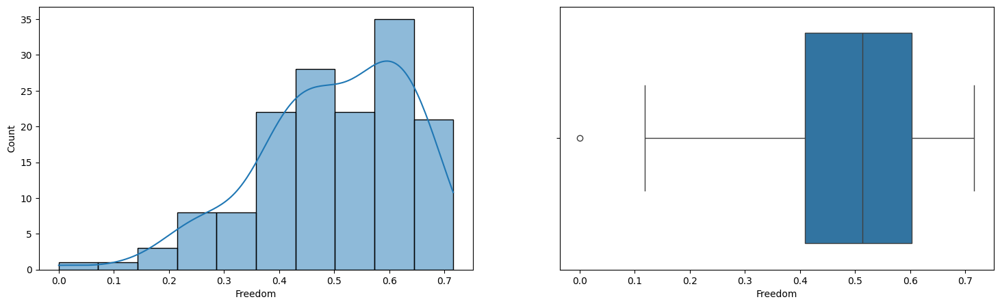

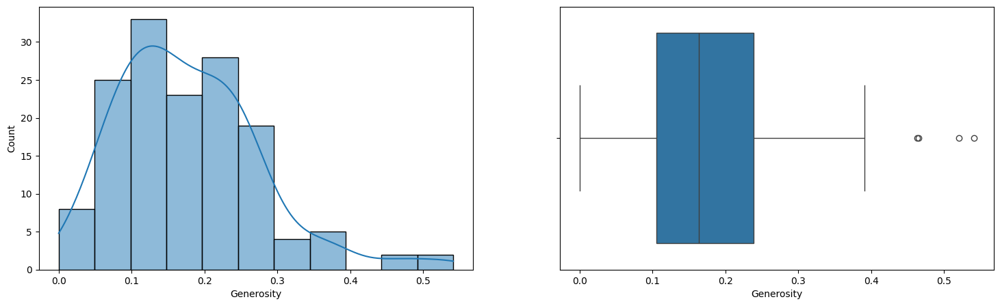

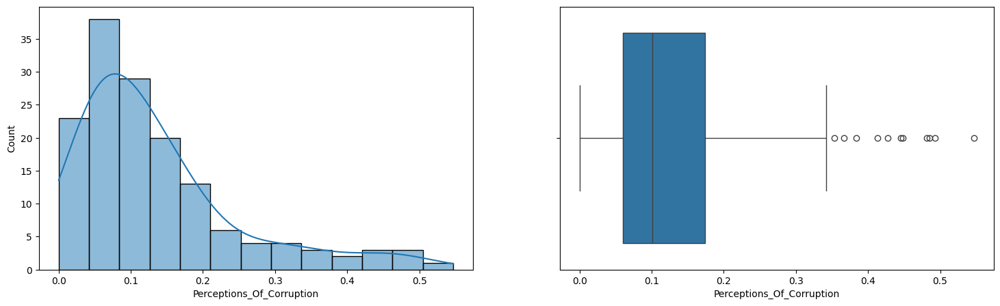

Dataset =  df_2022


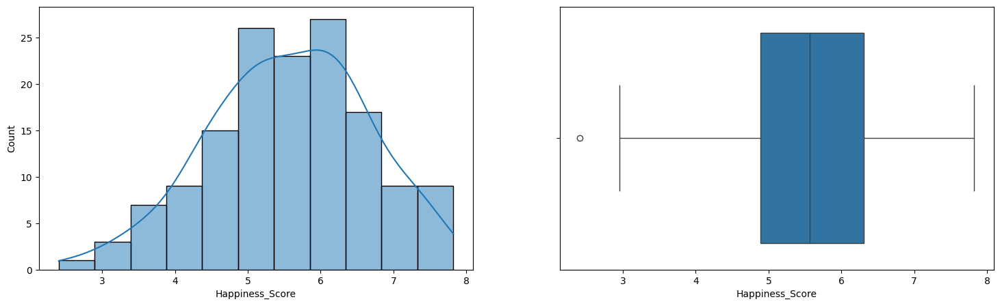

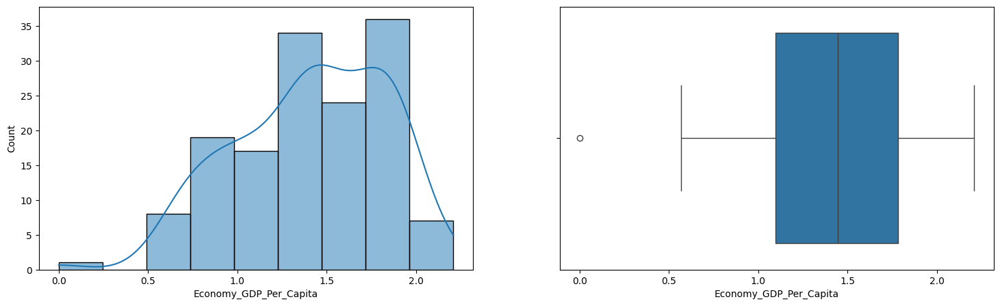

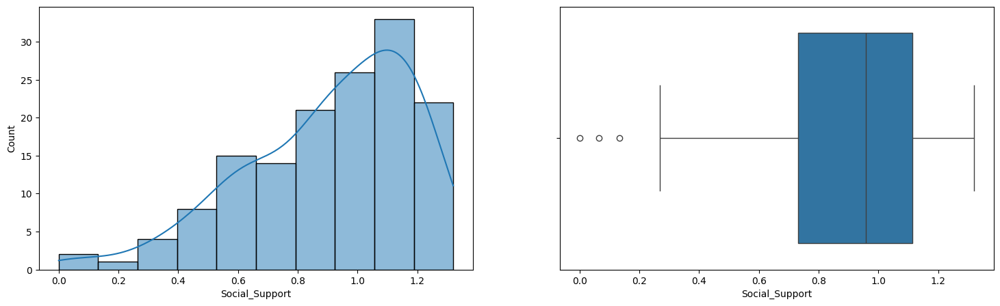

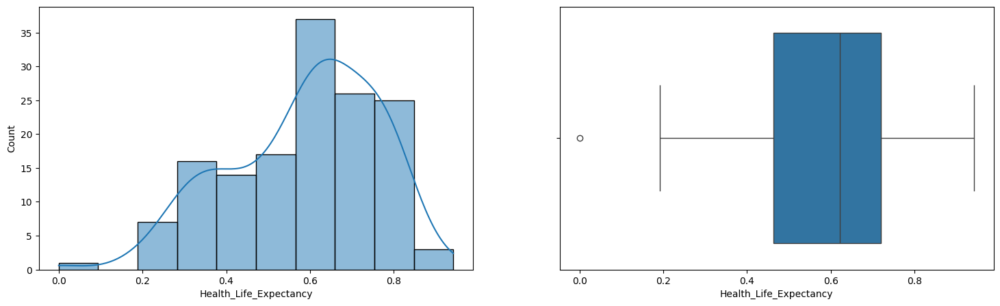

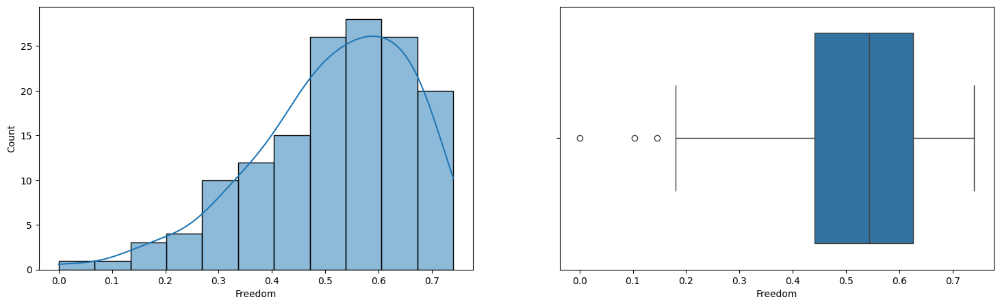

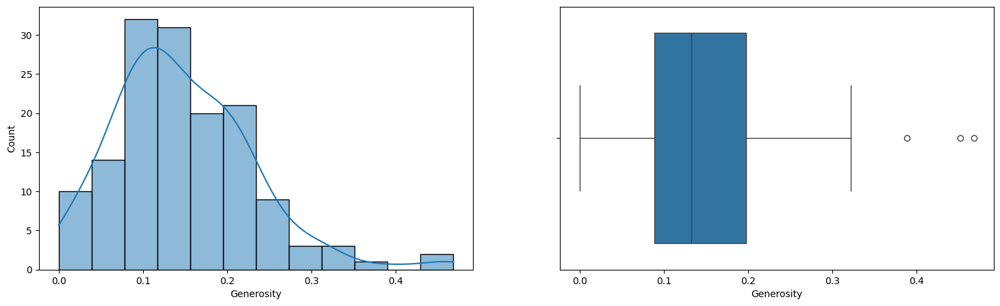

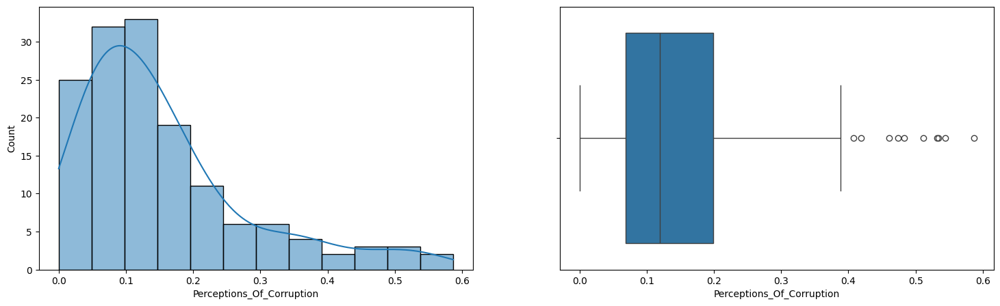

In [42]:
for i in df_list:
    print("Dataset = ", i.name)
    
    for col in numeric_cols:
        plt.figure(figsize=(18,5))
        plt.subplot(1,2,1)
        sns.histplot(i[col], kde=True)
        plt.subplot(1,2,2)
        sns.boxplot(x=col, data=i)
        plt.show()

# Analyse - Data distribution per YEAR

## Year 2015:
**After the analysis of the data we can see:** <br>
- in "Social Support", "Generosity" and “Perceptions of corruption” we’ve outliers <br>

**Data with normal distribution:** <br>
- Social Support <br>
- Freedom <br> 

## Year 2016:
**After the analysis of the data we can see:** <br>
- in "Social Support", "Generosity" and “Perceptions of corruption” we’ve outliers <br>

**Data with normal distribution:** <br>
- Happiness score <br>
- Social support <br>

## Year 2017:
**After the analysis of the data we can see:** <br>
- in "Social Support", "Generosity" and “Perceptions of corruption” we’ve outliers <br>

**Data with normal distribution:** <br>
- Happiness score <br>

## Year 2018:
**After the analysis of the data we can see:** <br>
- in “Economy GDP per capita”, "Social Support", “Freedom”, "Generosity" and “Perceptions of corruption” we’ve outliers <br>

**Data with normal distribution:** <br>
- Generosity <br>

## Year 2019:
**After the analysis of the data we can see:** <br>
- in "Social Support", “Health life expectancy”, “Freedom”, "Generosity" and “Perceptions of corruption” we’ve outliers <br>

**Data with normal distribution:** <br>
- Happiness score <br>
- Generosity <br>

## Year 2020:
**After the analysis of the data we can see:** <br>
- in "Social Support", “Freedom”, "Generosity" and “Perceptions of corruption” we’ve outliers <br>

**Data with normal distribution:** <br>
- Happiness Score <br>
- Social support <br>
- Freedom <br>

## Year 2021:
**After the analysis of the data we can see:** <br>
- in “Happiness score”, "Social Support", “Freedom”, "Generosity" and “Perceptions of corruption” we’ve outliers <br>

**Data with normal distribution:** <br>
- Happiness Score <br>
- Freedom <br> 

## Year 2022:
**After the analysis of the data we can see:** <br>
- in “Happiness Score”, “Economy GDP per capita”, "Social Support", “Health life expectancy”, “Freedom”, "Generosity" and “Perceptions of corruption” we’ve outliers <br>

**Data with normal distribution:** <br>
- Happiness Score <br>
- Economy GDP per capita <br>

# PAIRPLOT
- print pairplots for each year
- delete year columns from plot

<Figure size 1000x1000 with 0 Axes>

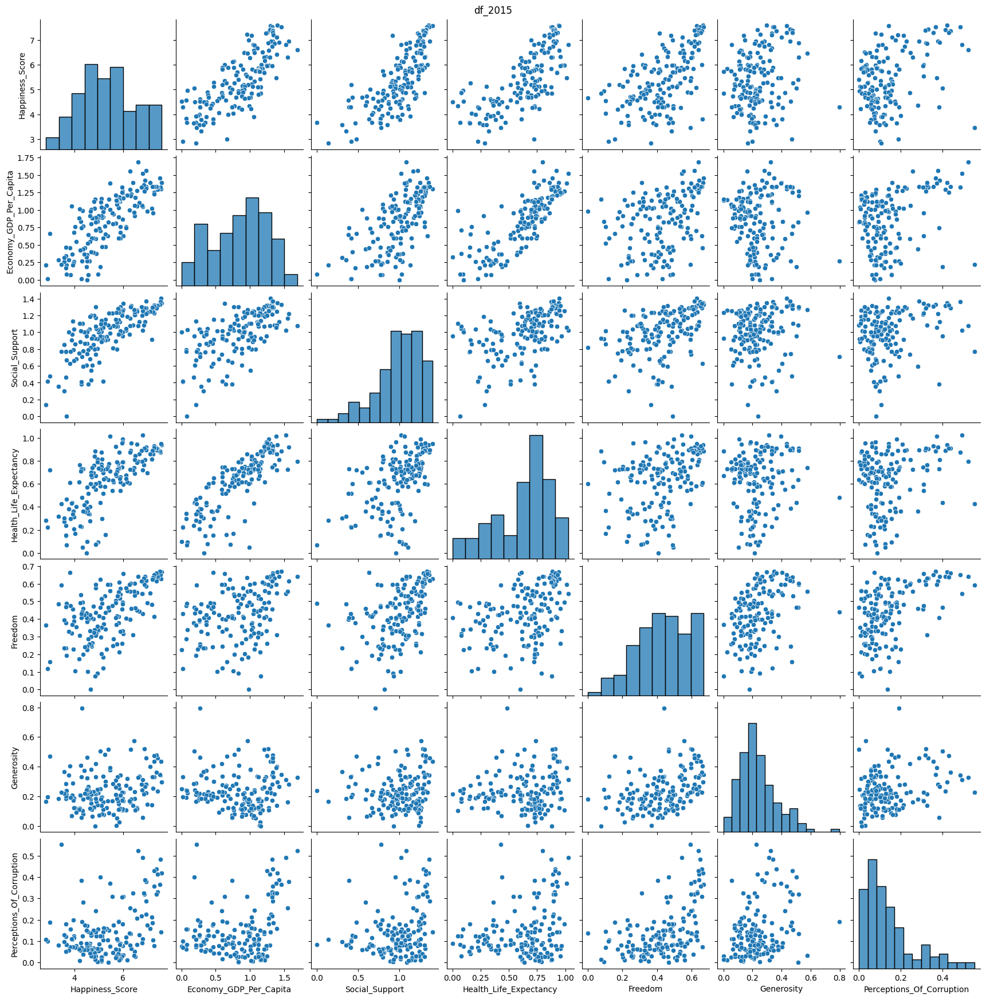

<Figure size 1000x1000 with 0 Axes>

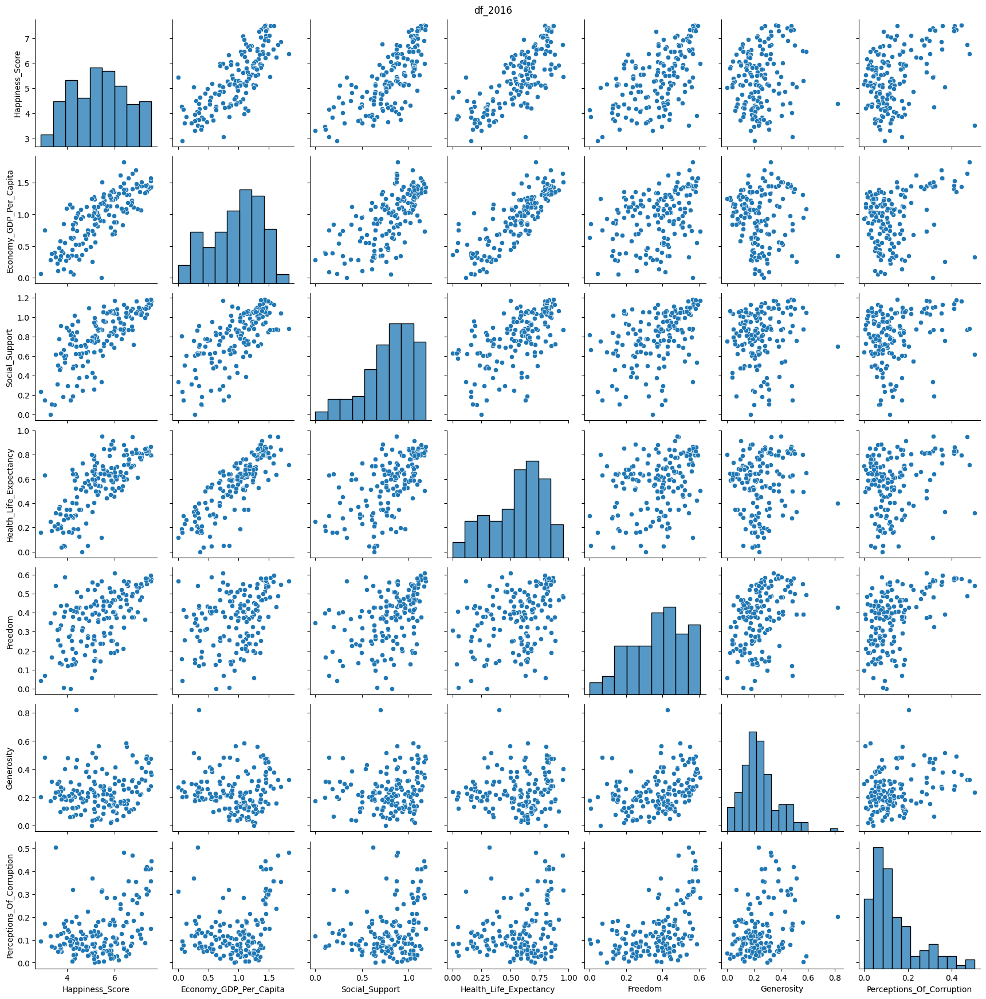

<Figure size 1000x1000 with 0 Axes>

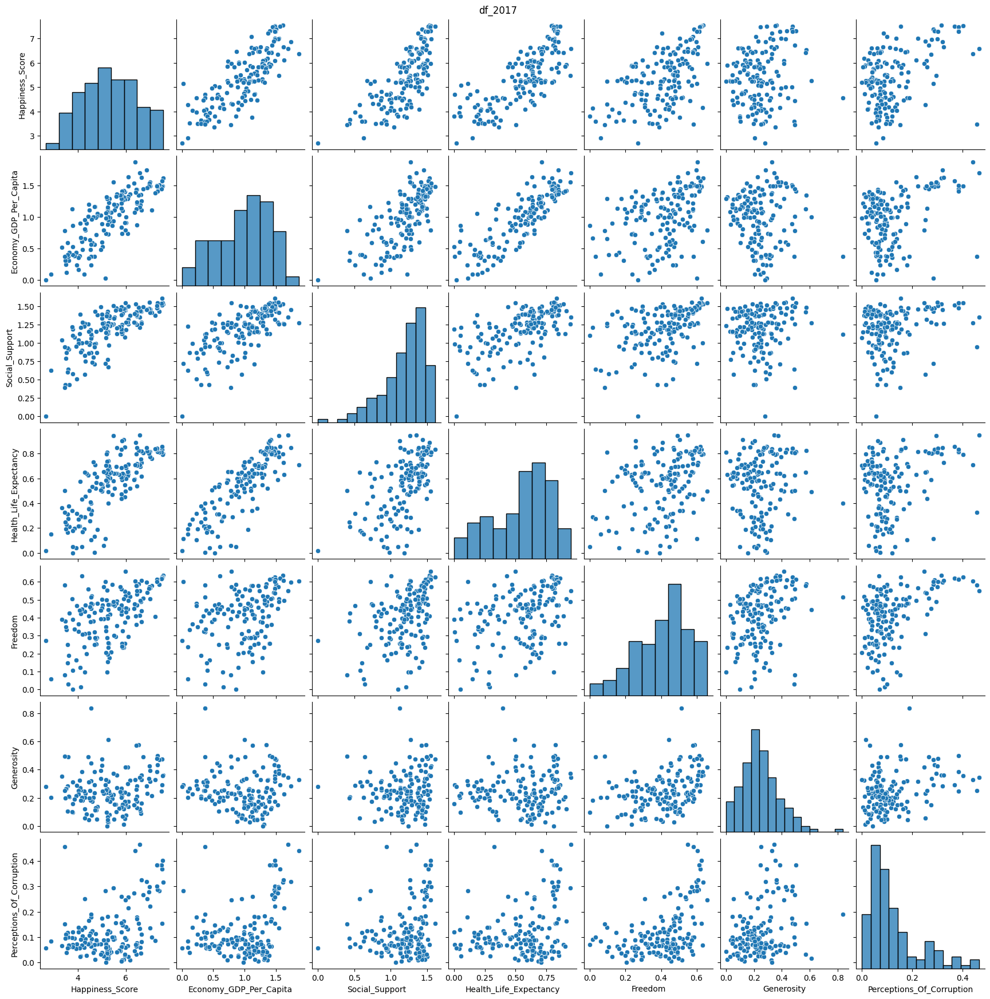

<Figure size 1000x1000 with 0 Axes>

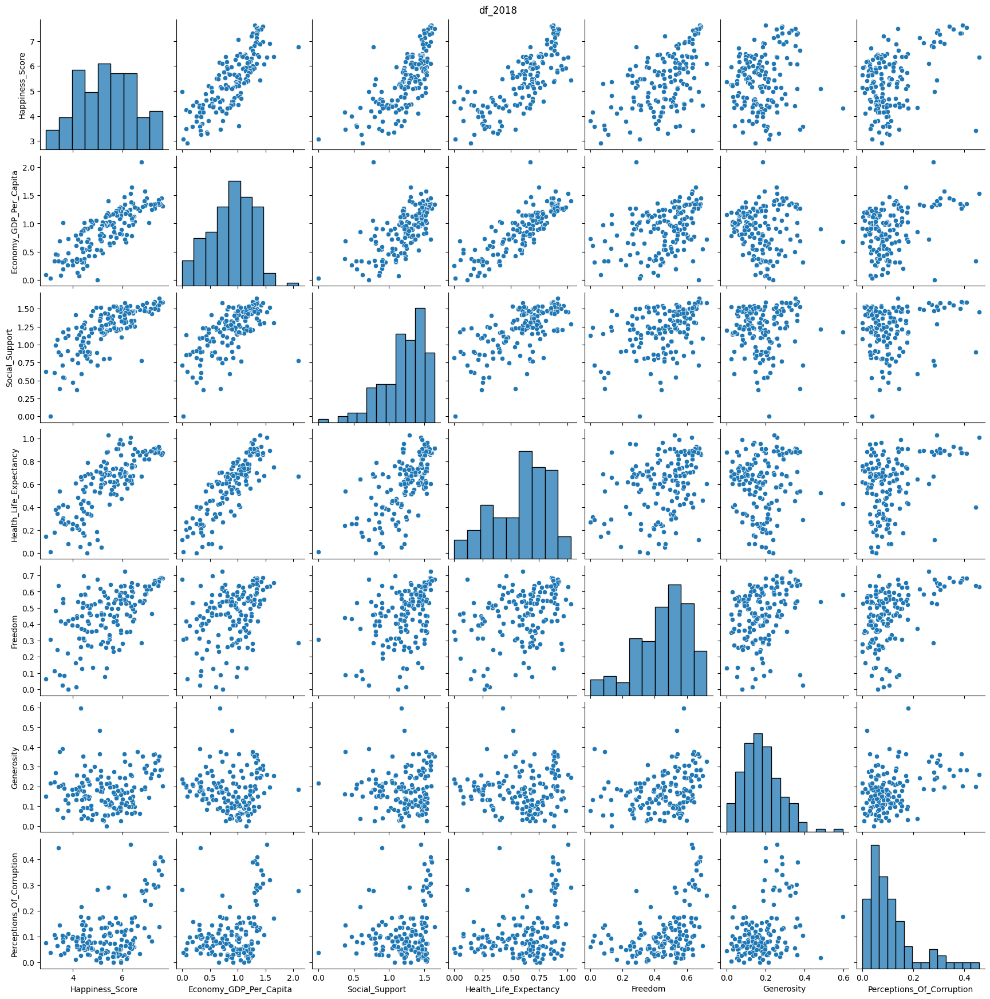

<Figure size 1000x1000 with 0 Axes>

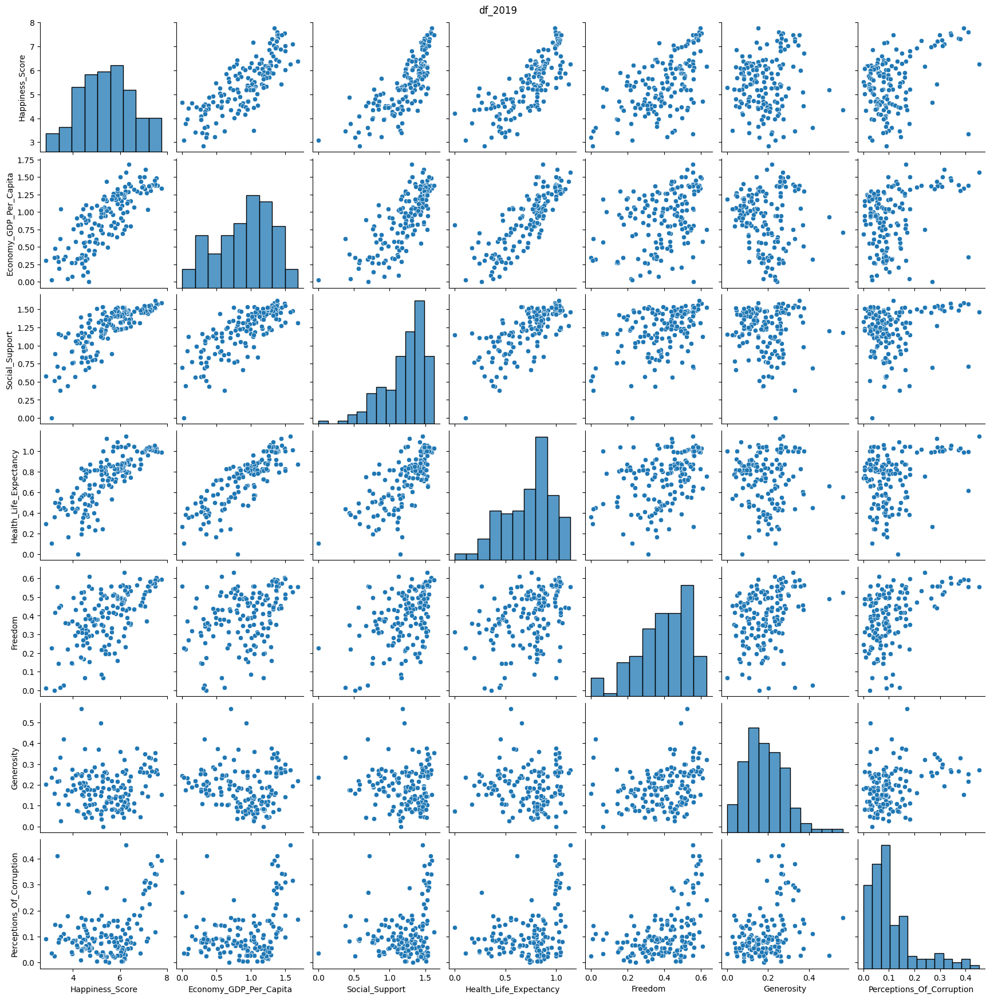

<Figure size 1000x1000 with 0 Axes>

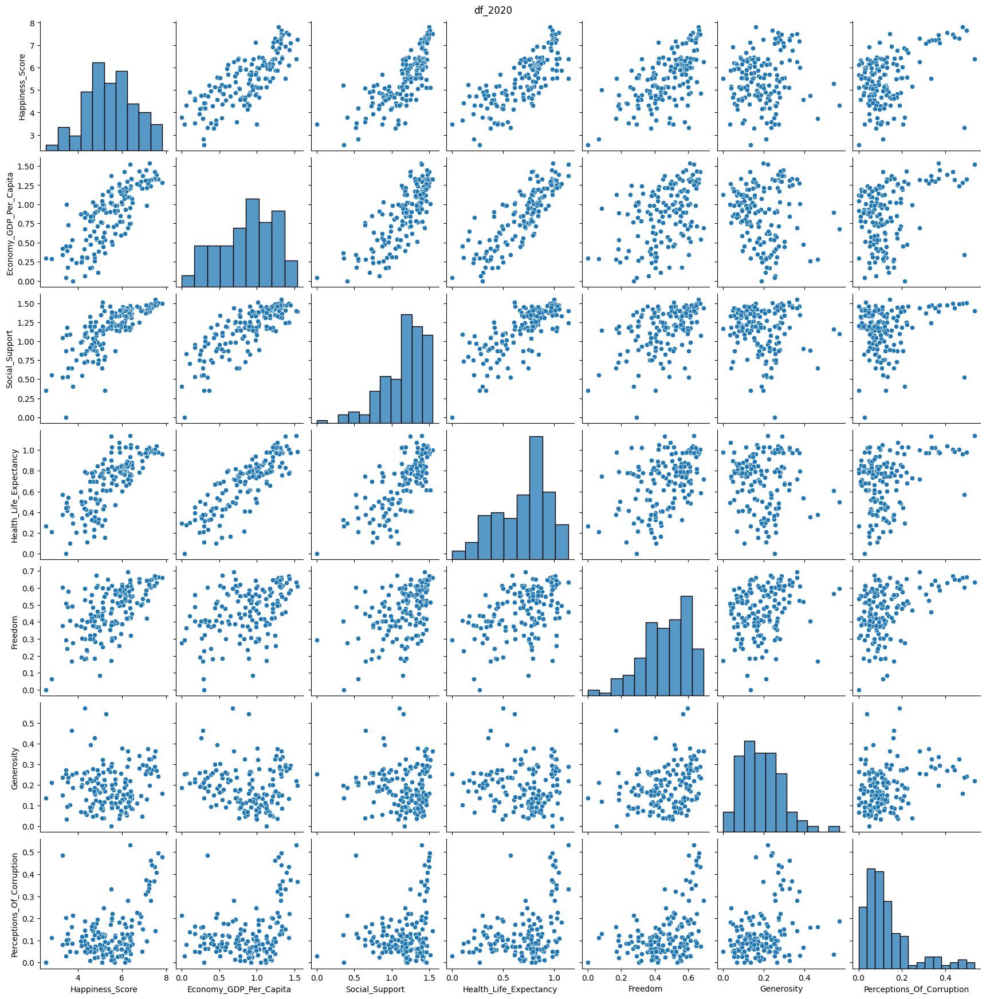

<Figure size 1000x1000 with 0 Axes>

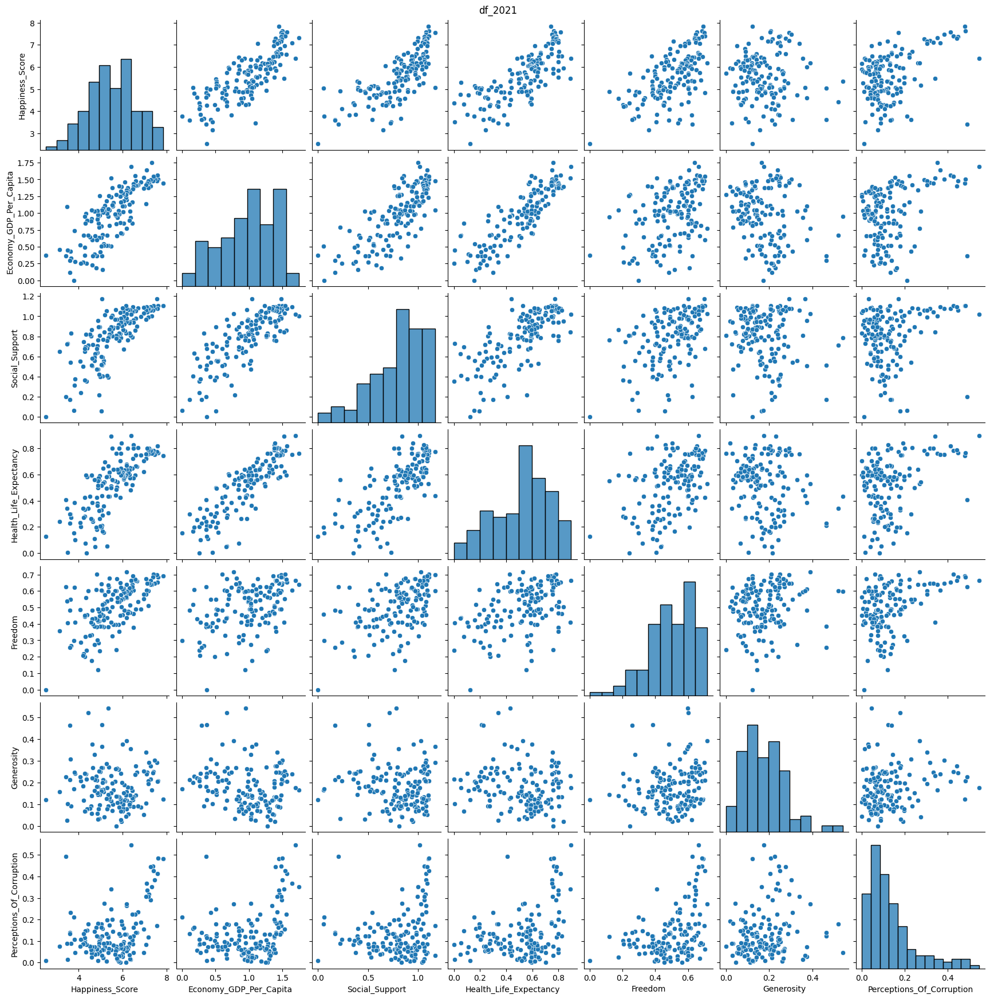

<Figure size 1000x1000 with 0 Axes>

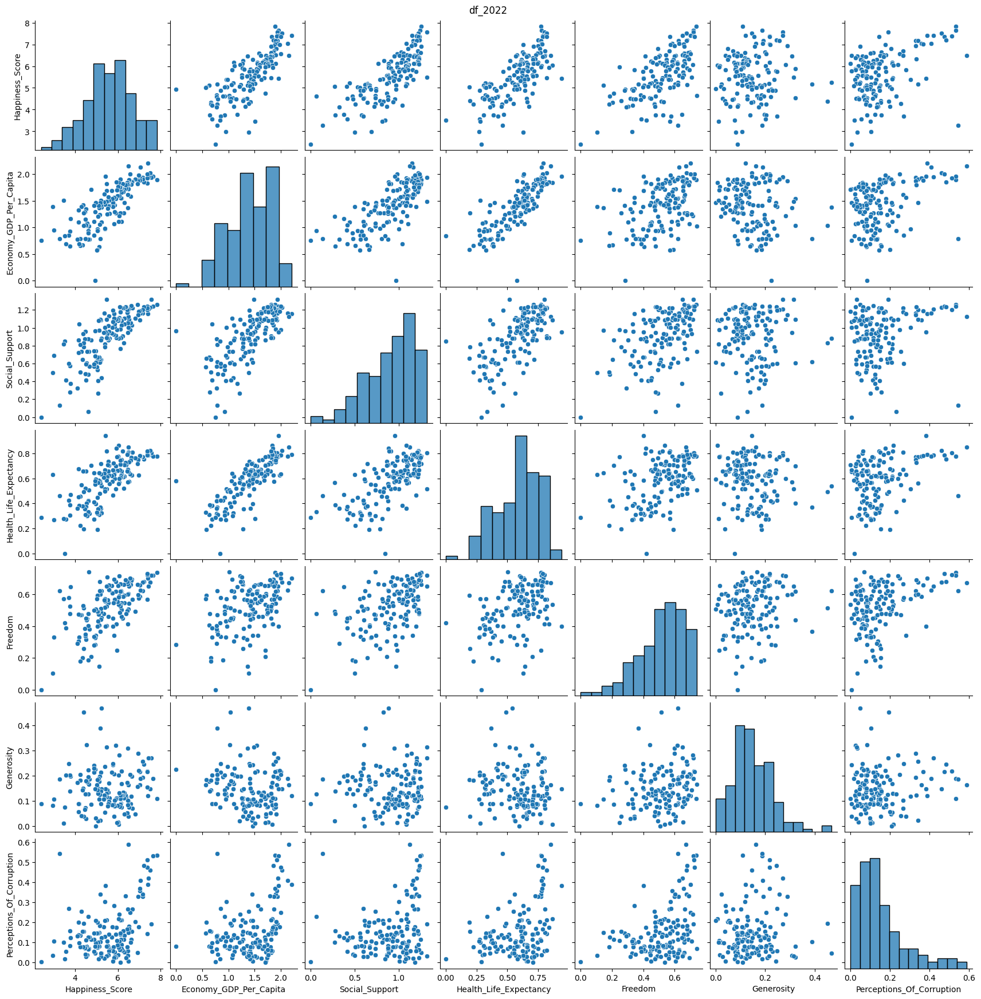

In [43]:
for i in df_list:
    df_numeric = i.select_dtypes('number')                             # select only numeric columns for next plots
    df_numeric.drop(df_numeric.columns[[7]], axis = 1, inplace = True) # delete year column 
    plt.figure(figsize=(10,10))                                        # size of plot 
    sns.pairplot(df_numeric)                                           # plot only numeric columns
    plt.suptitle(i.name, y = 1)                                        # set title

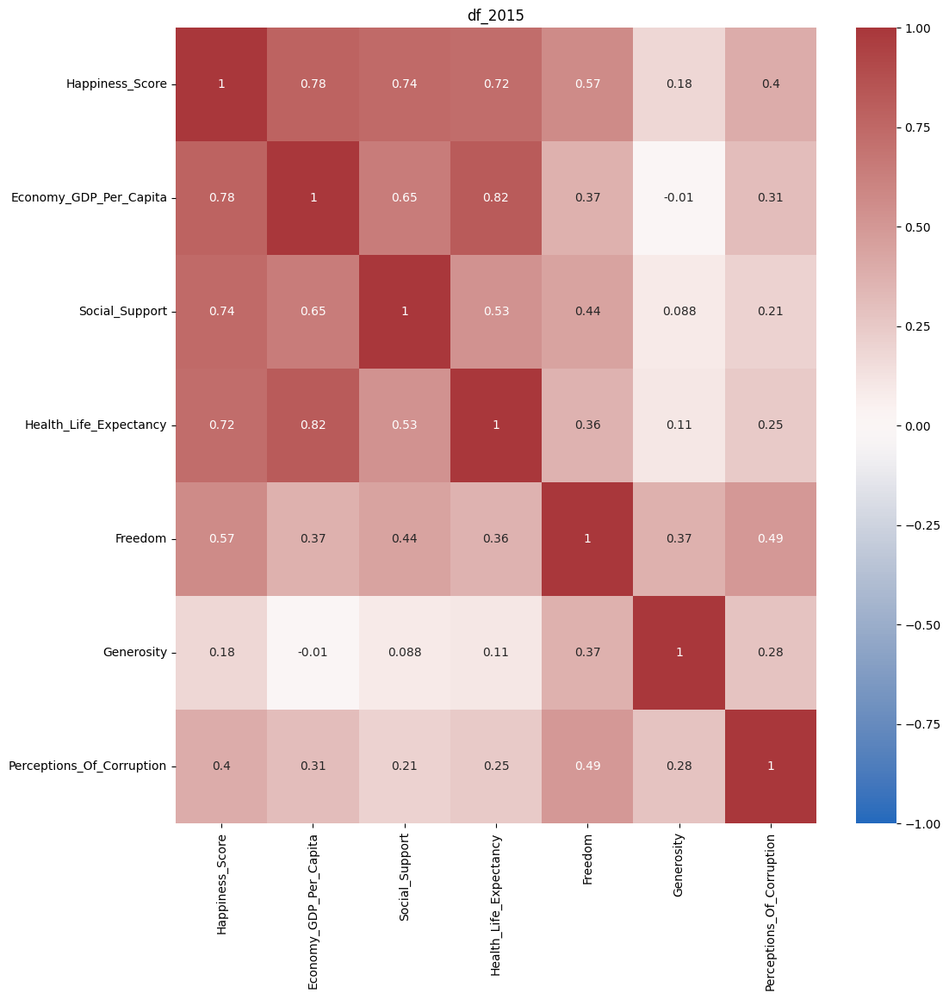

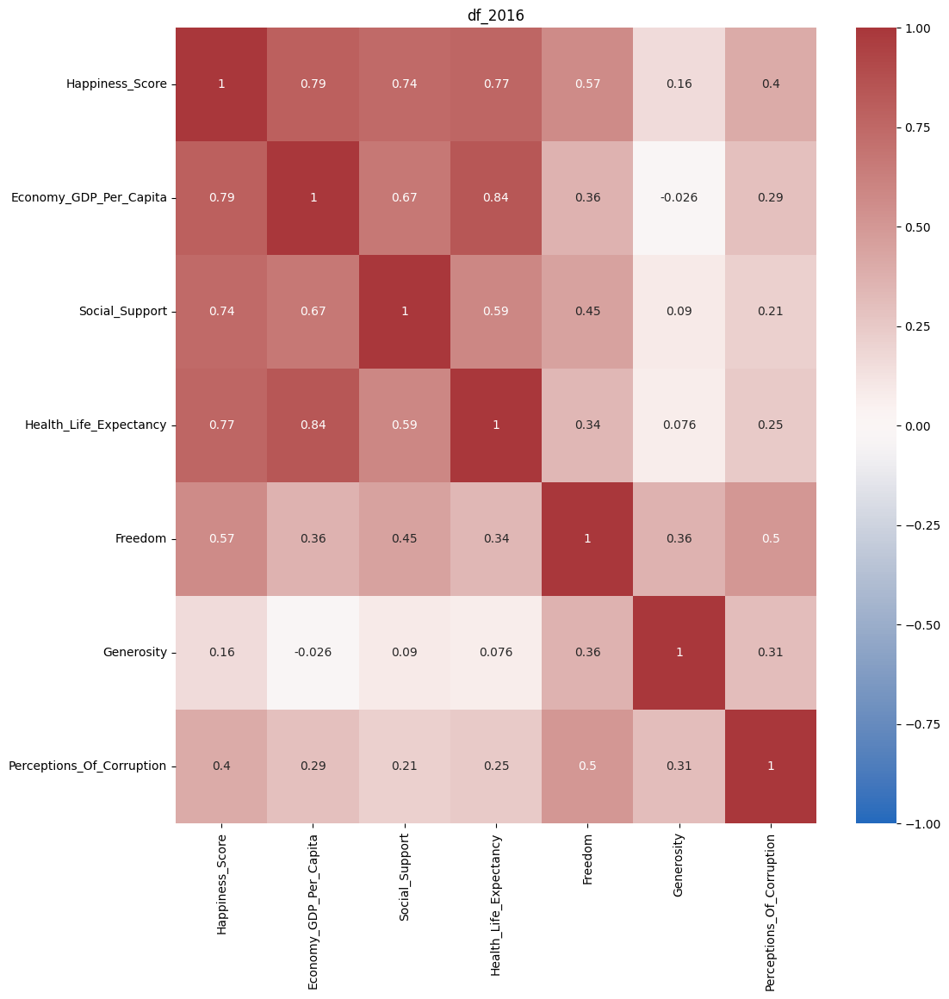

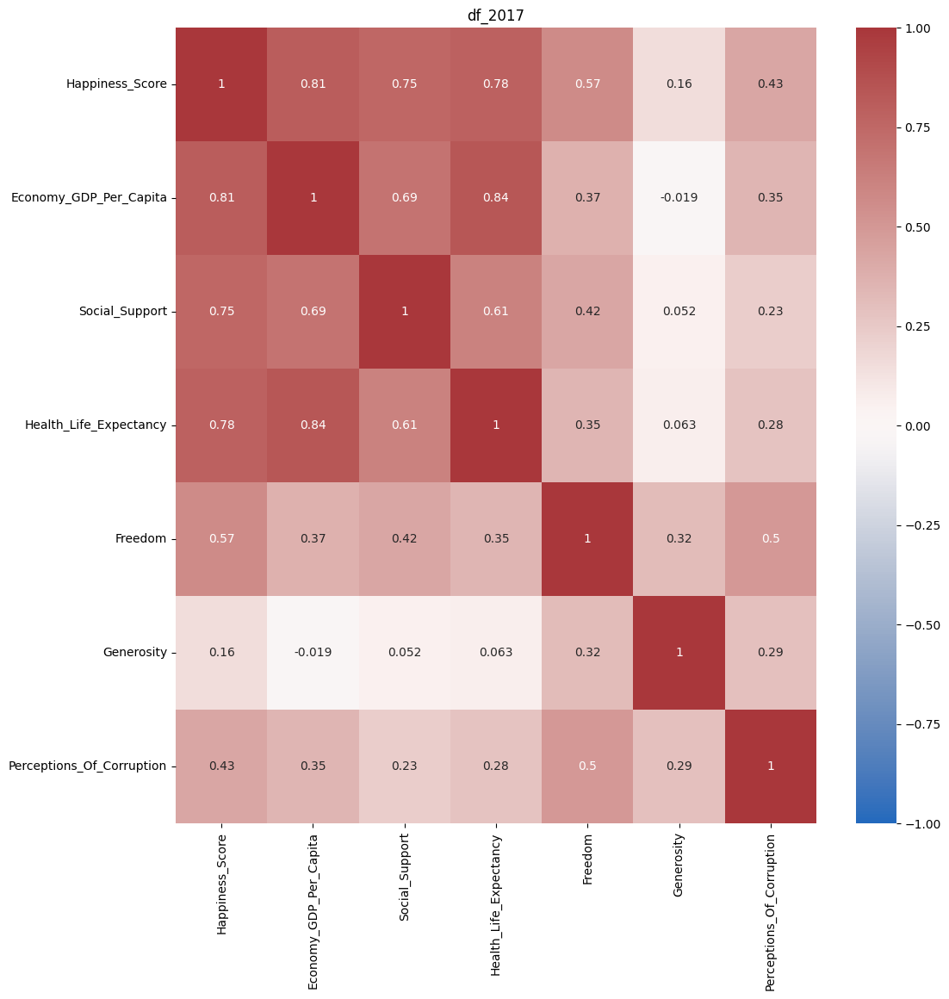

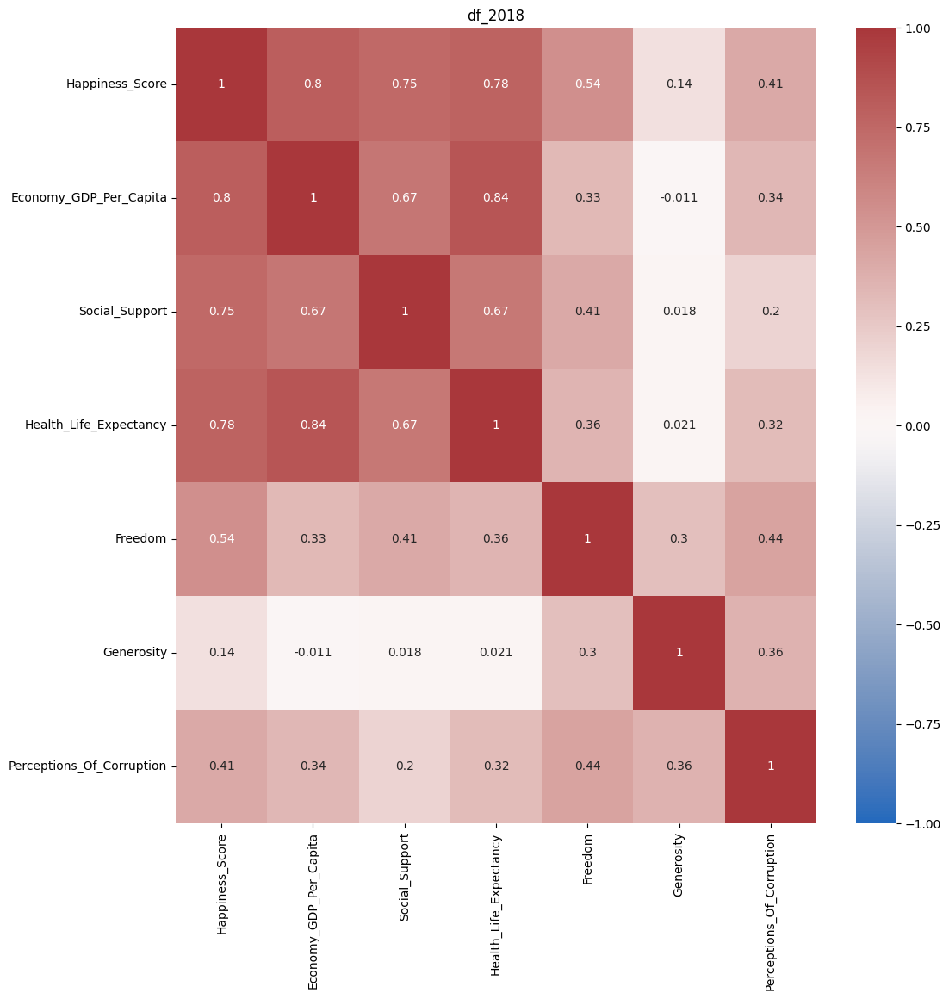

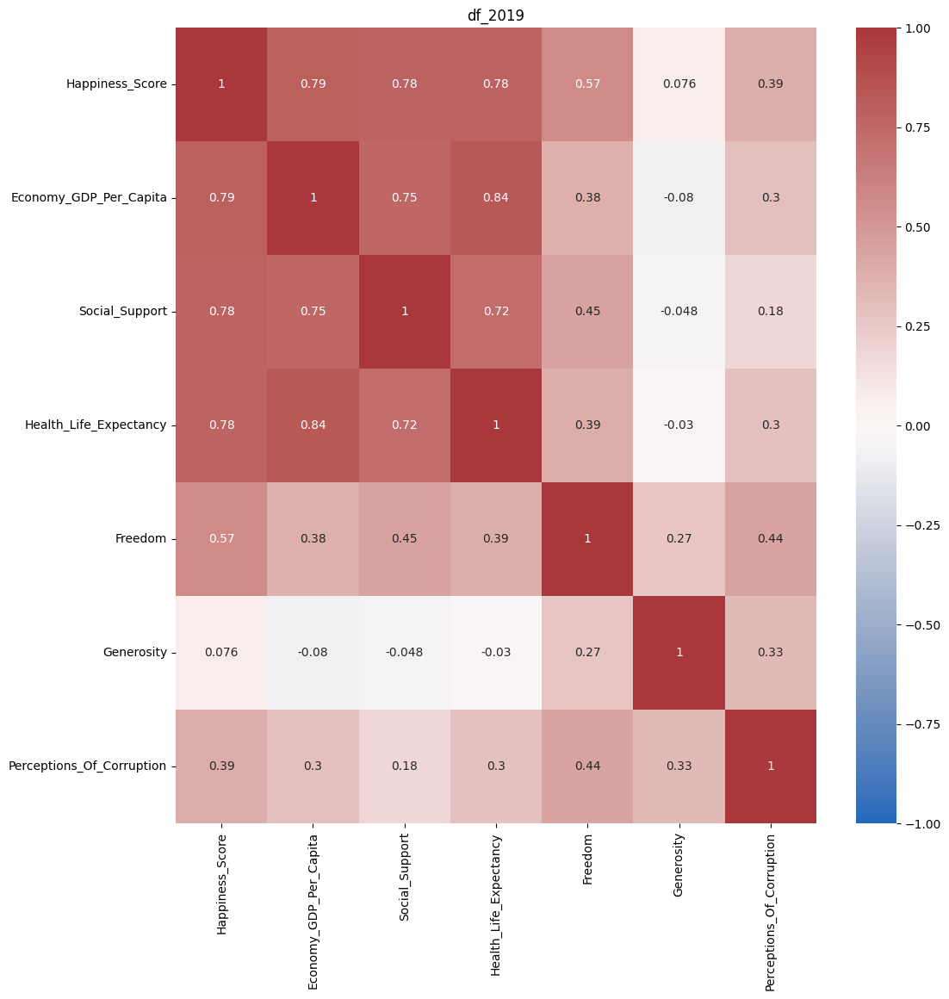

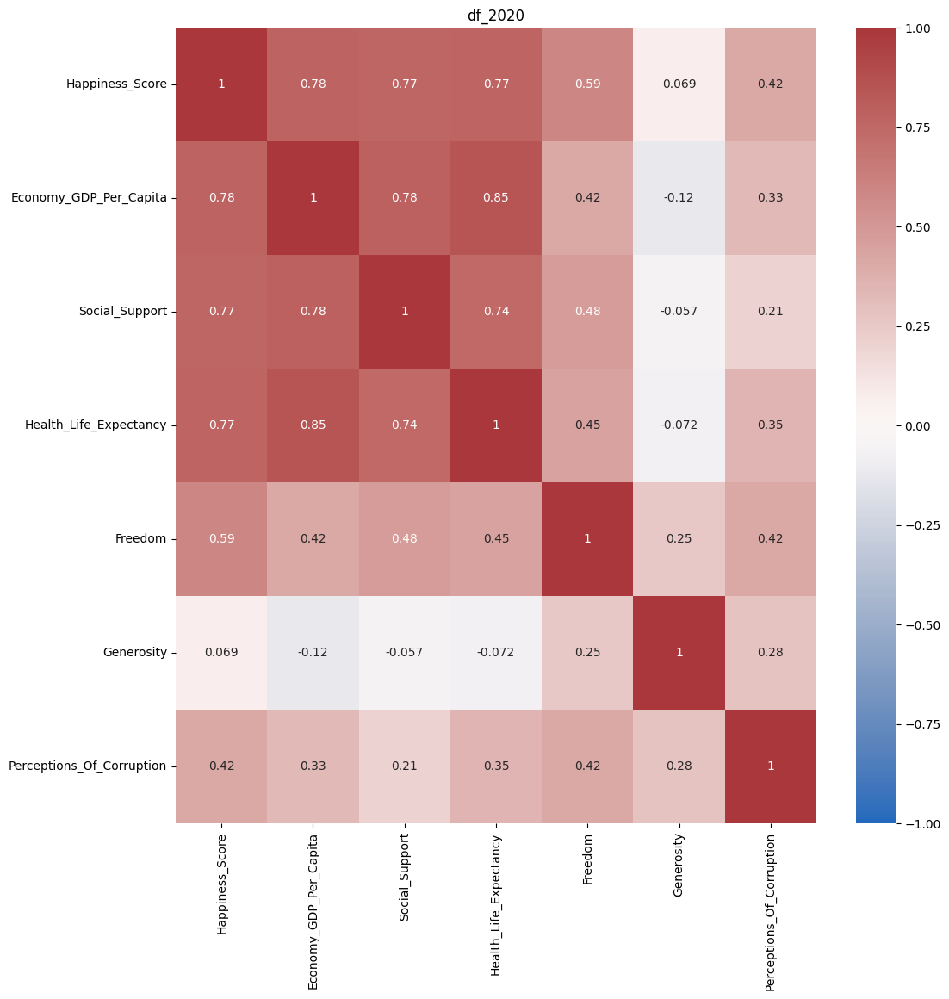

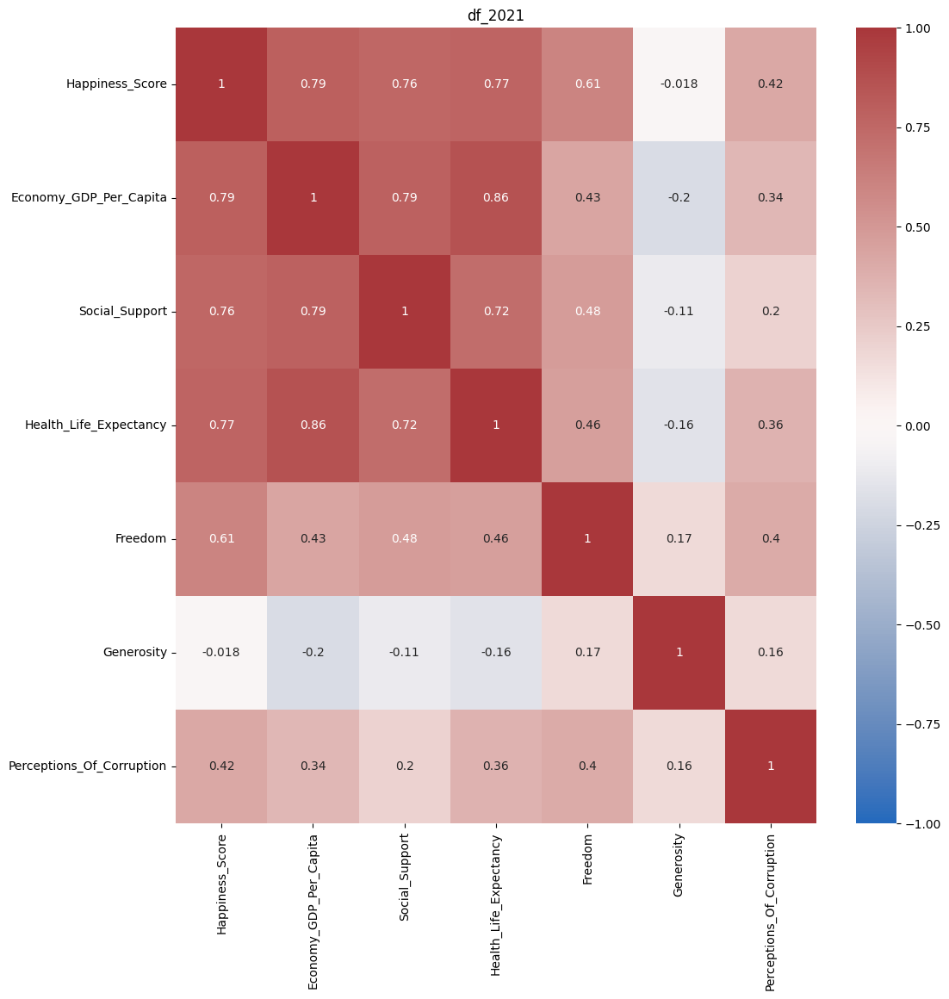

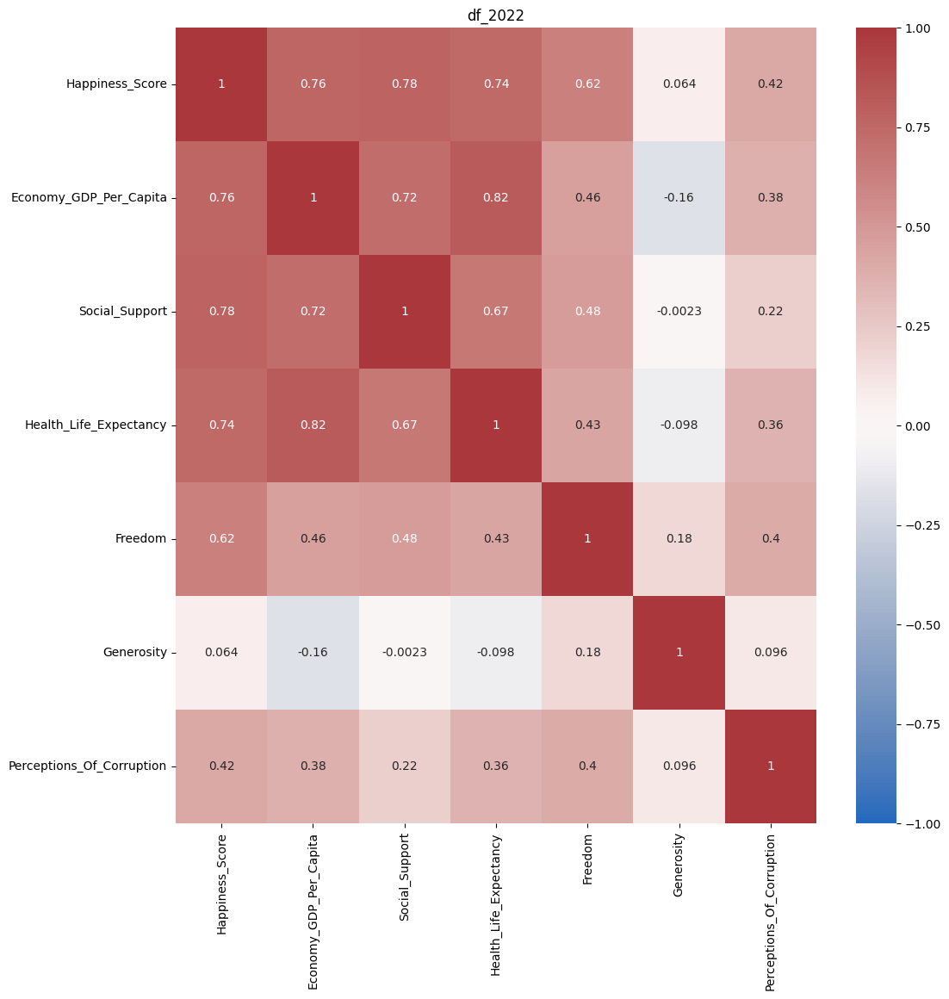

In [44]:
for i in df_list:
    df_numeric = i.select_dtypes('number')                             # select only numeric columns for next plots
    df_numeric.drop(df_numeric.columns[[7]], axis = 1, inplace = True) # delete year column 
    plt.figure(figsize=(12,12))                                        # size of plot
    ax = plt.axes()
    sns.heatmap(df_numeric.corr(),                                     # heatmap
                cbar=True, 
                annot=True, 
                cmap='vlag', 
                vmin = -1, 
                vmax = 1)
    ax.set_title(i.name, y = 1)                                        # title of heatmap

# Positive and negative correlations:

### Year 2015
- **Happiness Score:** we can see only positive correlations. With Generosity and Perception of corruption is the correlation very low. <br>
- **Economy GDP per capita:** We have a positive correlation with happiness score, social support and health life expectancy. For Freedom and perception of corruption we have a very low positive correlation. With generosity we have an extremely low negative correlation. <br>
- **Social Support:** We have a positive correlation with all other columns. We can say that the positive correlation with perception of corruption and generosity is extremely low. <br>  
- **Health life expectancy:** We have a strong positive correlation with happiness score and economy GDP per capita. With other columns we have also a positive correlation, but not so strong. <br> 
- **Freedom:** We have a positive correlation with all columns, but this correlation isn’t strong. <br>
- **Generosity:** We have a very weak negative correlation with economy GDP per capita. With other columns we have a weak positive correlation. <br> 
- **Perceptions of corruption:** We have here a positive correlation with all columns. This correlation is not strong. <br>

### Year 2016
- **Happiness Score:** we can see only positive correlations. With Generosity and Perception of corruption is the correlation very low. <br>
- **Economy GDP per capita:** We have a positive correlation with happiness score, social support and health life expectancy. For Freedom and perception of corruption we have a low positive correlation. With generosity we have an extremely low negative correlation. <br>
- **Social Support:** We have a positive correlation with all other columns. We can say that the positive correlation with perception of corruption and generosity is extremely low. <br>  
- **Health life expectancy:** We have a strong positive correlation with happiness score and economy GDP per capita. With other columns we have also a positive correlation, but not so strong. <br> 
- **Freedom:** We have a positive correlation with all columns, but this correlation isn’t strong. <br>
- **Generosity:** We have a very weak negative correlation with economy GDP per capita. With other columns we have a weak positive correlation. <br> 
- **Perceptions of corruption:** We have here a positive correlation with all columns. This correlation is not strong. <br>

### Year 2017
- **Happiness Score:** we can see only positive correlations. With Generosity and Perception of corruption is the correlation very low. <br>
- **Economy GDP per capita:** We have a positive correlation with happiness score, social support and health life expectancy. For Freedom and perception of corruption we have a very low positive correlation. With generosity we have an extremely low negative correlation. <br>
- **Social Support:** We have a positive correlation with all other columns. We can say that the positive correlation with perception of corruption and generosity is extremely low. <br>  
- **Health life expectancy:** We have a strong positive correlation with happiness score, economy GDP per capita and social support. With other columns we have also a positive correlation, but not so strong. <br> 
- **Freedom:** We have a positive correlation with all columns, but this correlation isn’t strong. <br>
- **Generosity:** We have a very weak negative correlation with economy GDP per capita. With other columns we have a weak positive correlation. <br> 
- **Perceptions of corruption:** We have here a positive correlation with all columns. This correlation is not strong. <br>

### Year 2018
- **Happiness Score:** we can see only positive correlations. With Generosity and Perception of corruption is the correlation very low. <br>
- **Economy GDP per capita:** We have a positive correlation with happiness score, social support and health life expectancy. For Freedom and perception of corruption we have a very low positive correlation. With generosity we have an extremely low negative correlation. <br>
- **Social Support:** We have a positive correlation with all other columns. We can say that the positive correlation with perception of corruption and generosity is extremely low. <br>  
- **Health life expectancy:** We have a strong positive correlation with happiness score, economy GDP per capita and social support. With other columns we have also a positive correlation, but not so strong. <br> 
- **Freedom:** We have a positive correlation with all columns, but this correlation isn’t strong. <br>
- **Generosity:** We have a very weak negative correlation with economy GDP per capita. With other columns we have a weak positive correlation. <br> 
- **Perceptions of corruption:** We have here a positive correlation with all columns. This correlation is not strong. <br>

### Year 2019
- **Happiness Score:** we can see only positive correlations. With Generosity is the correlation very low. <br>
- **Economy GDP per capita:** We have a positive correlation with happiness score, social support and health life expectancy. For Freedom and perception of corruption we have a very low positive correlation. With generosity we have an extremely low negative correlation. <br>
- **Social Support:** We have here a negative correlation with generosity. With all other columns we have a positive correlation. We can say that the positive correlation with perception of corruption is extremely low. <br>  
- **Health life expectancy:** We have a strong positive correlation with happiness score, economy GDP per capita and social support.  With generosity we have a negative correlation. With other columns we have also a positive correlation, but not so strong. <br> 
- **Freedom:** We have a positive correlation with all columns, but this correlation isn’t strong. <br>
- **Generosity:** We have a very weak negative correlation with economy GDP per capita, social support and health life expectancy. With other columns we have a weak positive correlation. <br> 
- **Perceptions of corruption:** We have here a positive correlation with all columns. This correlation is not strong. <br>

### Year 2020
- **Happiness Score:** we can see only positive correlations. With Generosity is the correlation very low. <br>
- **Economy GDP per capita:** We have a positive correlation with happiness score, social support and health life expectancy. For Freedom and perception of corruption we have a lower positive correlation. With generosity we have a negative correlation. <br>
- **Social Support:** We have a negative correlation with Generosity. With other columns we have a positive correlation. <br>  
- **Health life expectancy:** We have a strong positive correlation with happiness score, economy GDP per capita and social support. With generosity we have a negative correlation. With other columns we have also a positive correlation, but not so strong. <br> 
- **Freedom:** We have a positive correlation with all columns, but this correlation isn’t strong. <br>
- **Generosity:** We have a weak negative correlation with economy GDP per capita, social support and health live expectancy. With other columns we have a weak positive correlation. <br>
- **Perceptions of corruption:** We have here a positive correlation with all columns. This correlation is not strong. <br>

### Year 2021
- **Happiness Score:** With generosity we have a negative correlation. With others, we have a positive correlation. With Perception of corruption is the correlation low. <br>
- **Economy GDP per capita:** We have a positive correlation with happiness score, social support and health life expectancy. For Freedom and perception of corruption we have a low positive correlation. With generosity we have a low negative correlation. <br>
- **Social Support:** We have a negative correlation with generosity. With all other columns we have a positive correlation. We can say that the positive correlation with perception of corruption is low. <br> 
- **Health life expectancy:** We have a strong positive correlation with happiness score, economy GDP per capita and social support. With generosity we have a negative correlation. With other columns we have also a positive correlation, but not so strong. <br> 
- **Freedom:** We have a positive correlation with all columns, but this correlation isn’t strong. <br>
- **Generosity:** We have a very weak negative correlation with happiness score, economy GDP per capita, social support and health life expectancy. Only with freedom and perception of corruption we have a low positive correlation. <br> 
- **Perceptions of corruption:** We have here a positive correlation with all columns. This correlation is not strong. <br>

### Year 2022
- **Happiness Score:** we can see only positive correlations. With Generosity and is the correlation very low. <br>
- **Economy GDP per capita:** We have a positive correlation with happiness score, social support and health life expectancy. For Freedom and perception of corruption we have also a positive correlation. With generosity we have a low negative correlation. <br>
- **Social Support:** With perception of corruption, we have a negative correlation. We have a positive correlation with all other columns. <br> 
- **Health life expectancy:** We have a strong positive correlation with happiness score, economy GDP per capita and social support. With other columns we have also a positive correlation, but not so strong. <br> 
- **Freedom:** We have a positive correlation with all columns, but this correlation isn’t strong. <br>
- **Generosity:** We have a very weak negative correlation with economy GDP per capita, social support and health life expectancy. With other columns we have a weak positive correlation. <br> 
- **Perceptions of corruption:** We have here a positive correlation with all columns. This correlation is not strong. <br>


# Scatterplot Ladder Score (Happiness score)

- in the first plot we can see, that a bigger GDP per capita also positive correlate the Ladder score
- in the second plot we can see, that a bigger Healthy life expectancy also positive correlate the Ladder score

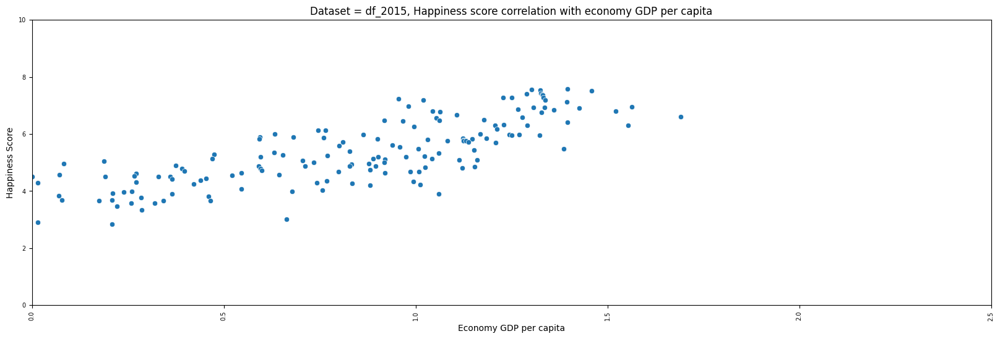

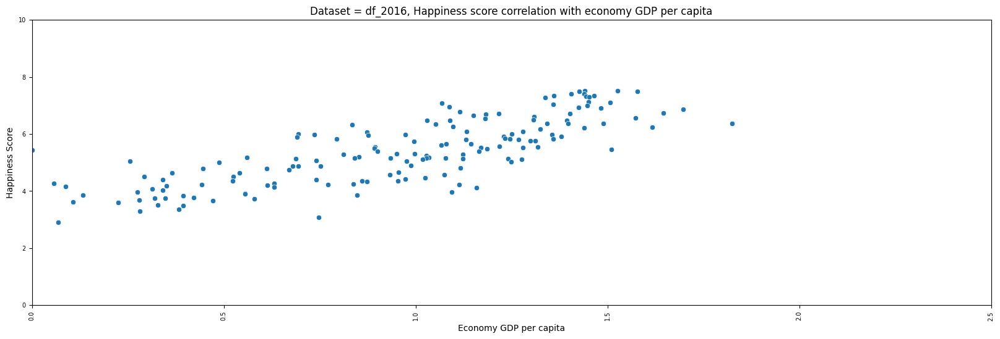

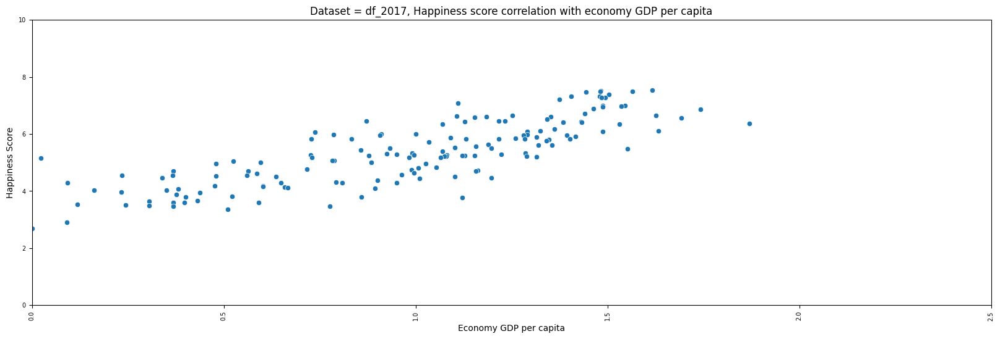

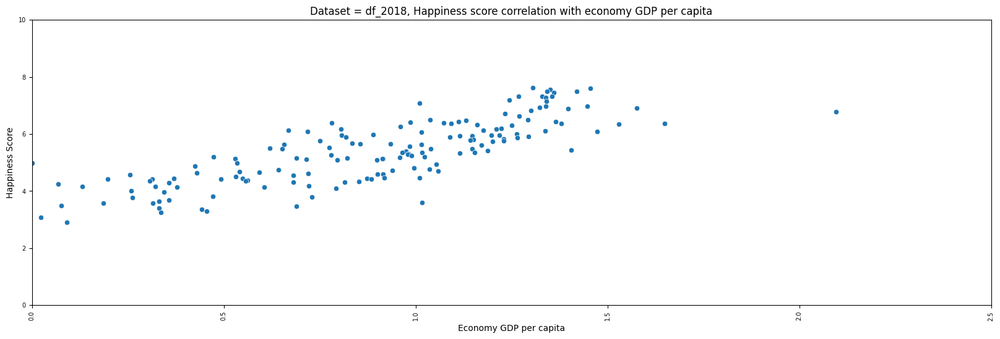

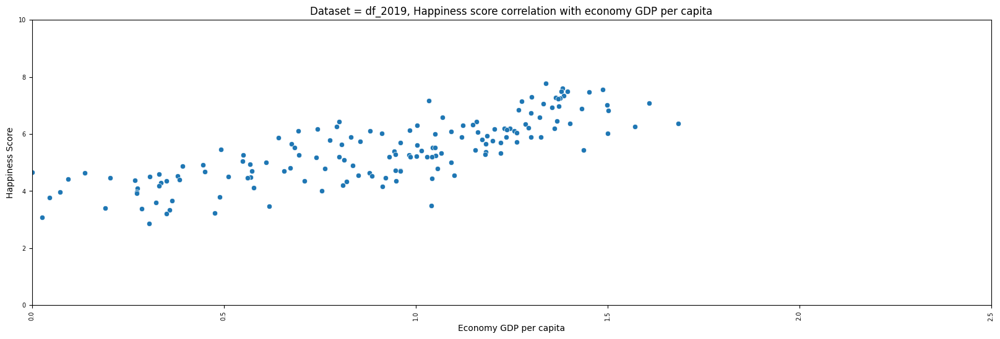

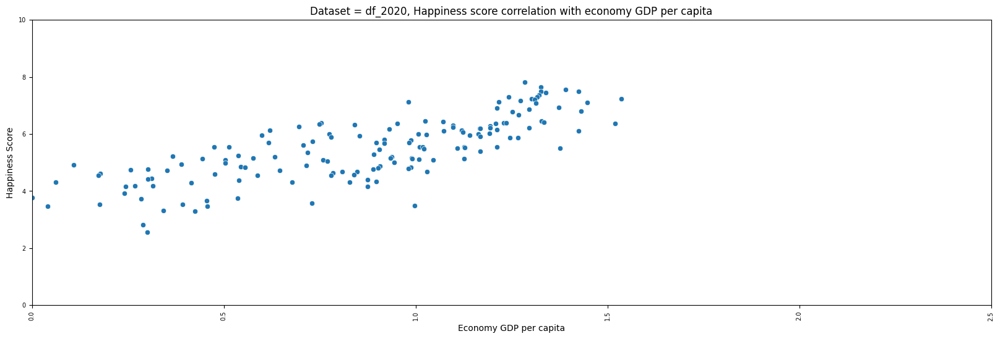

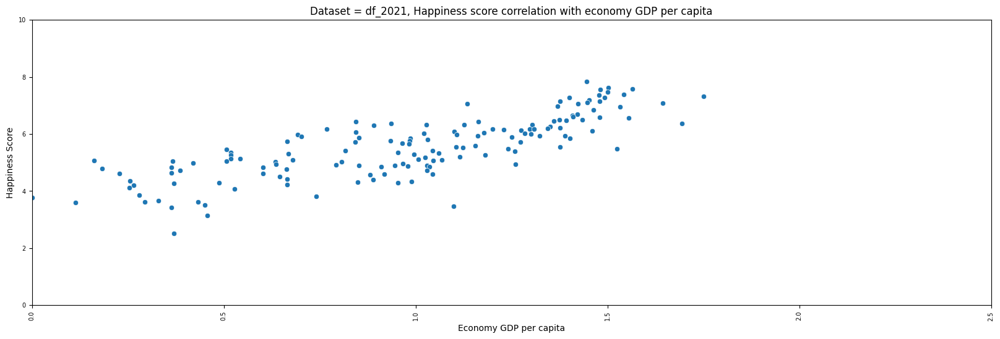

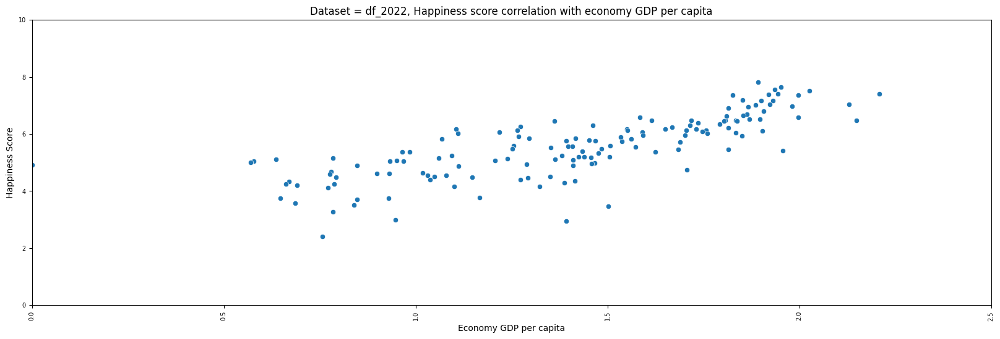

In [122]:
for i in df_list:
    fig, ax = plt.subplots(figsize=(20,6))
    
    sns.scatterplot(data=i,
                x='Economy_GDP_Per_Capita',
                y='Happiness_Score');

    ax.set_xlim(0, 2.5)
    ax.set_ylim(0, 10)
    
    plt.xlabel('Economy GDP per capita');
    plt.ylabel('Happiness Score');
    plt.tick_params(axis='y', labelsize = 7);
    plt.tick_params(axis='x', labelrotation = 90, labelsize = 7);
    plt.title('Dataset = ' + i.name + ', Happiness score correlation with economy GDP per capita');

In this scatterplots we can see, that the happiness score correlates with economy GDP per capita. We can tell, that with a bigger economy GDP per Capita also increase the happiness score. 

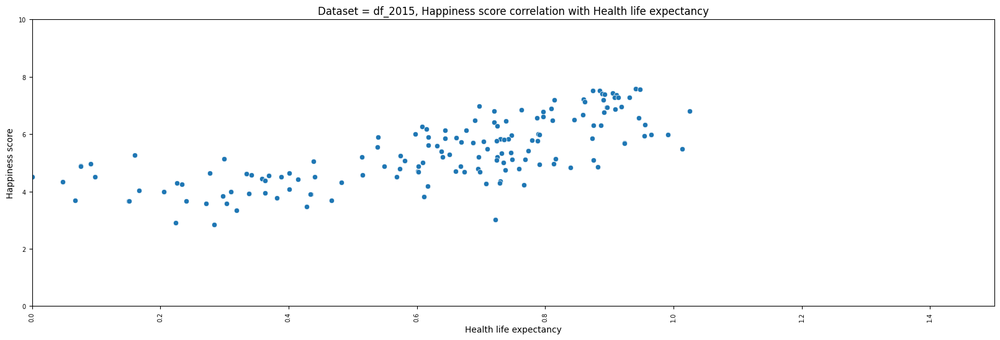

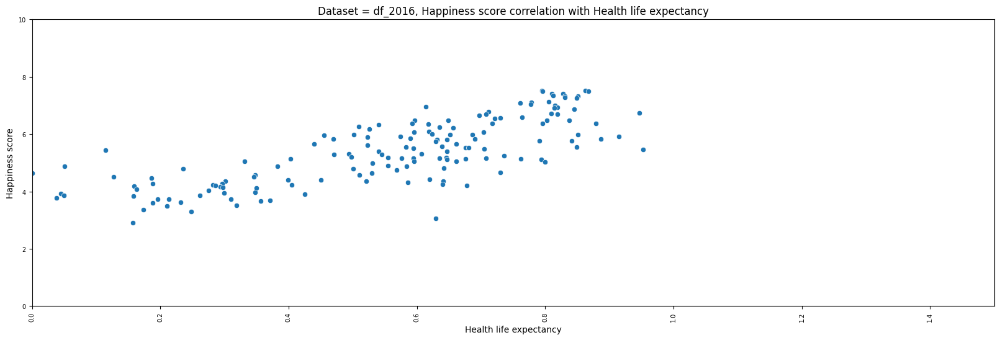

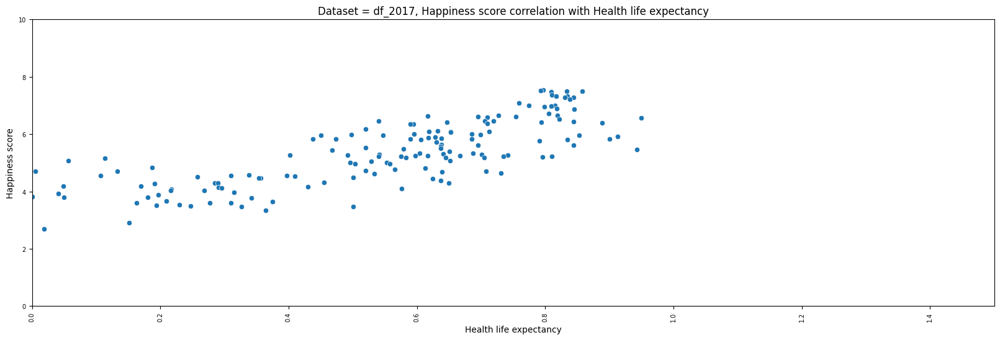

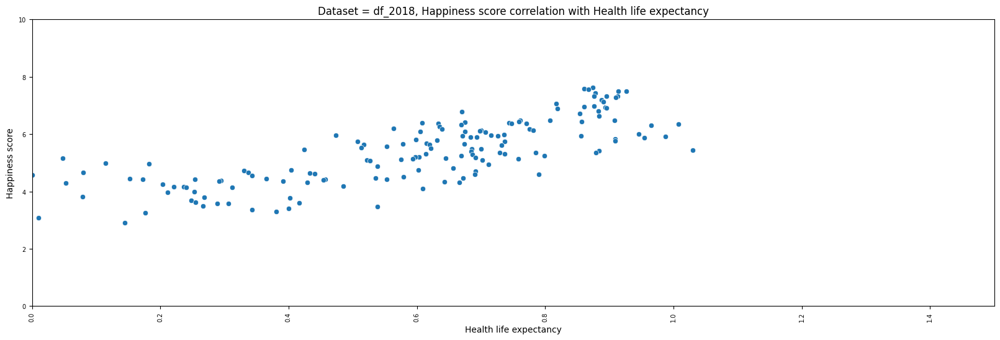

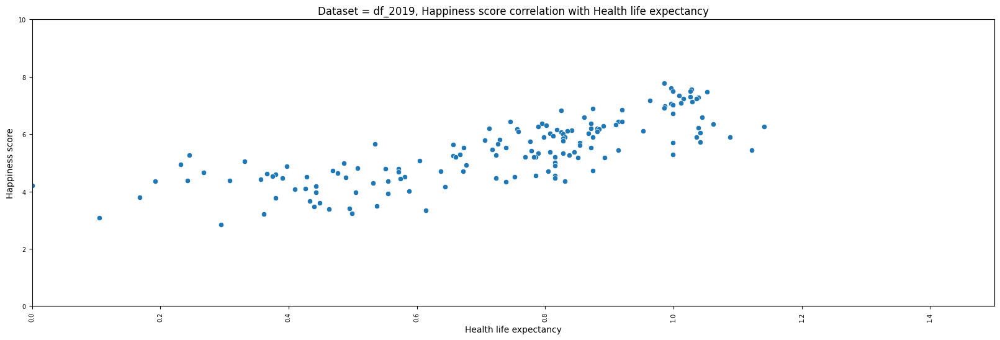

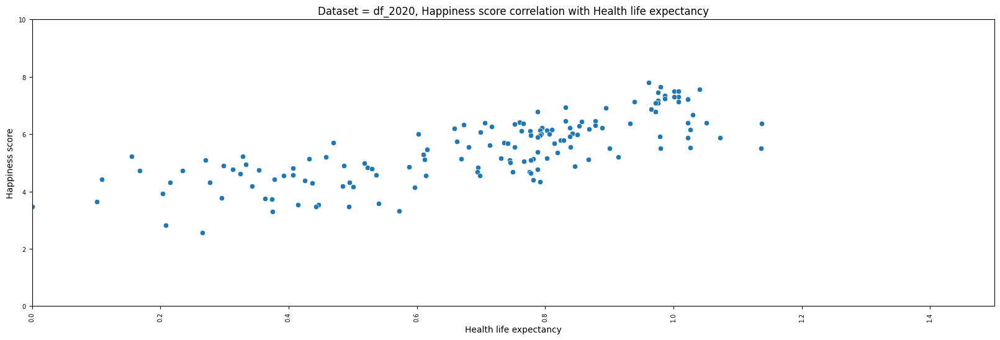

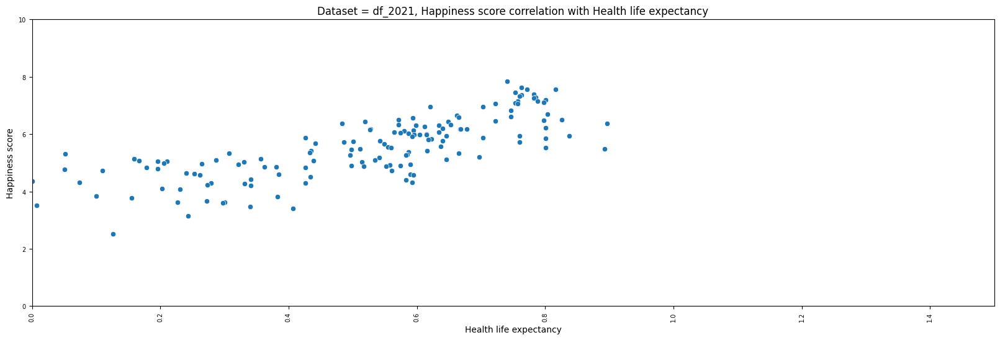

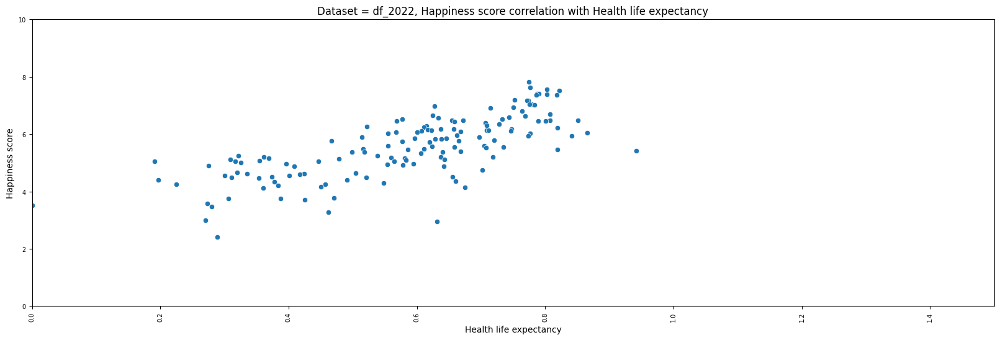

In [123]:
for i in df_list:
    fig, ax = plt.subplots(figsize=(20,6))
    
    sns.scatterplot(data=i,
                x='Health_Life_Expectancy',
                y='Happiness_Score');

    ax.set_xlim(0, 1.5)
    ax.set_ylim(0, 10)
    
    plt.xlabel('Health life expectancy');
    plt.ylabel('Happiness score');
    plt.tick_params(axis='y', labelsize = 7);
    plt.tick_params(axis='x', labelrotation = 90, labelsize = 7);
    plt.title('Dataset = ' + i.name + ', Happiness score correlation with Health life expectancy');

In this scatterplots we can see, that the happiness score correlates with health life expectancy. We can tell, that with a bigger health life expentancy also increase the happiness score. 

# Dataframe

After data analysis and data distribution for every year, we create a one big dataframe with all the data.

In [50]:
df = pd.concat(df_list) # concat all dataset into one big dataframe
display(df)             # display dataframe

,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
0,Switzerland,7.587,1.39651,1.34951,0.94143,0.66557,0.29678,0.41978,2015
1,Iceland,7.561,1.30232,1.40223,0.94784,0.62877,0.43630,0.14145,2015
2,Denmark,7.527,1.32548,1.36058,0.87464,0.64938,0.34139,0.48357,2015
3,Norway,7.522,1.45900,1.33095,0.88521,0.66973,0.34699,0.36503,2015
4,Canada,7.427,1.32629,1.32261,0.90563,0.63297,0.45811,0.32957,2015
...,...,...,...,...,...,...,...,...,...
141,Botswana,3.471,1.50300,0.81500,0.28000,0.57100,0.01200,0.10200,2022
142,Rwanda,3.268,0.78500,0.13300,0.46200,0.62100,0.18700,0.54400,2022
143,Zimbabwe,2.995,0.94700,0.69000,0.27000,0.32900,0.10600,0.10500,2022
144,Lebanon,2.955,1.39200,0.49800,0.63100,0.10300,0.08200,0.03400,2022


we created a big dataframe with 1367 columns. In this dataframe, we've the same columns

## Analyse, how the Happiness score changed for the country in years

Check randomly selected countries and his happiness score during years <br>
- create a sample list with defined number of countries <br>
- create a barplot over years, how is changing the happines score <br> 

Randomly selected countries: 
101                   Laos
126                 Jordan
136                 Angola
73                  Jordan
147                Liberia
31                  Kosovo
87     Congo (Brazzaville)
77                  Kosovo
27                   Qatar
89         North Macedonia
Name: Country, dtype: object


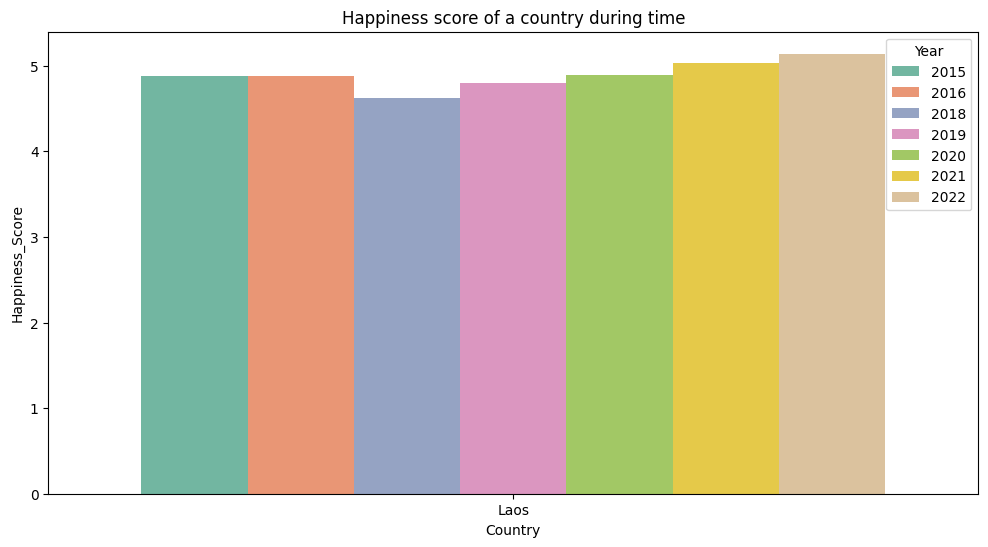

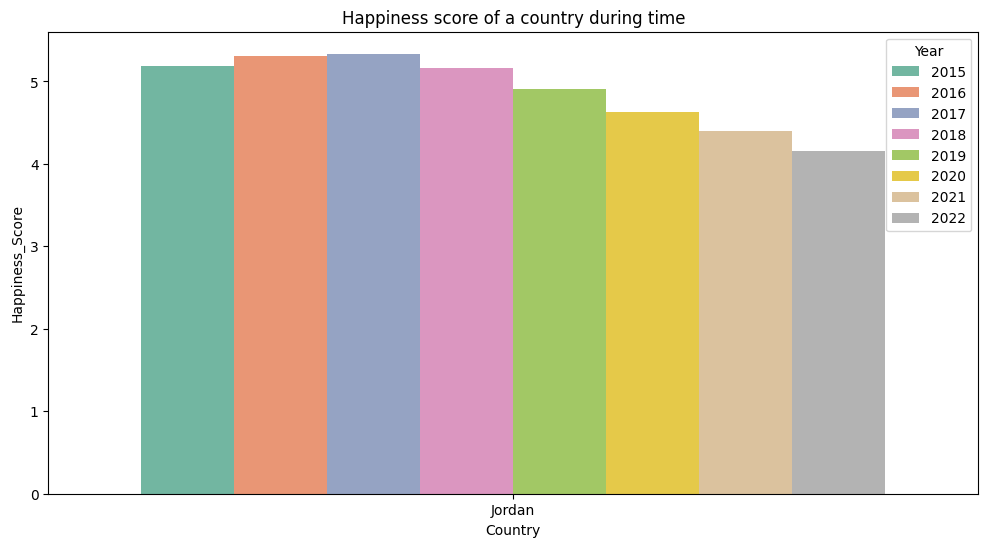

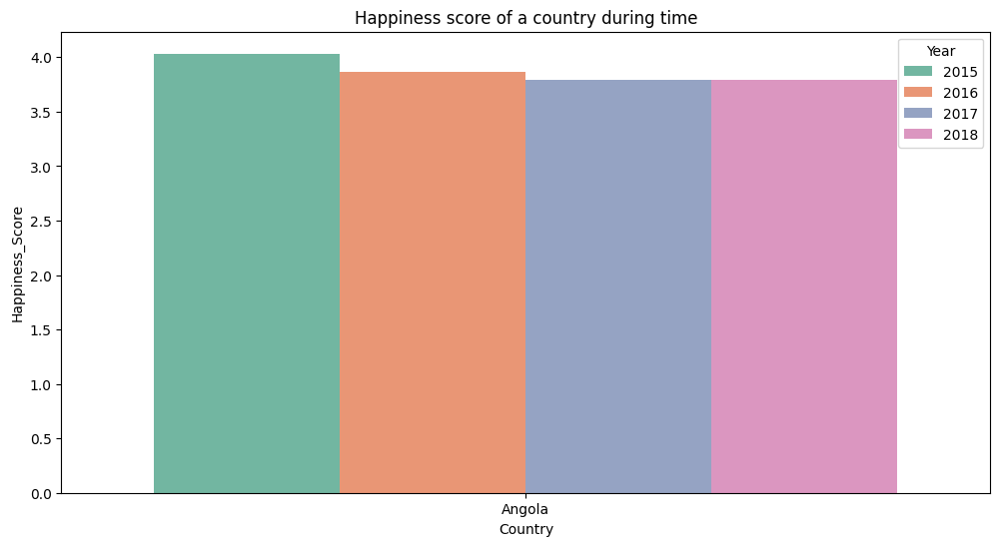

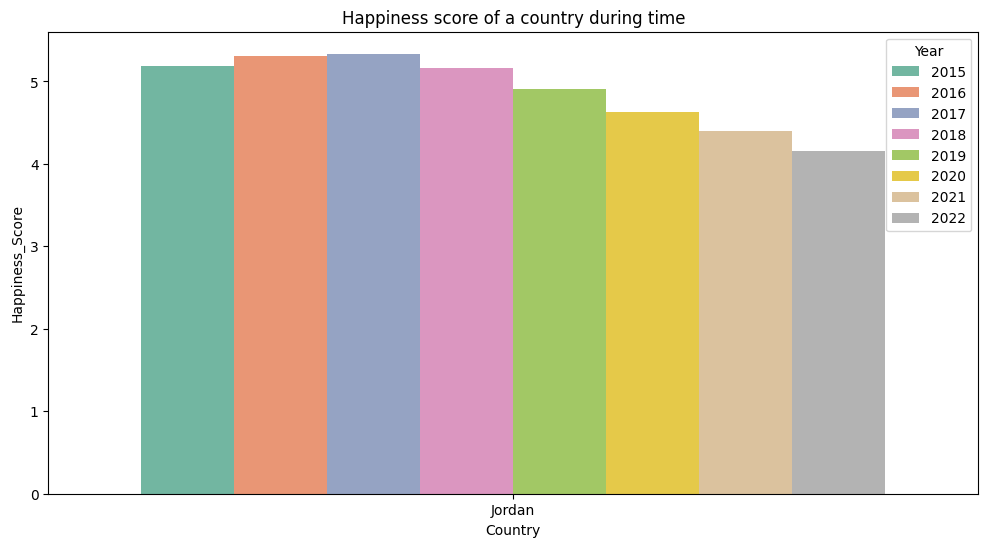

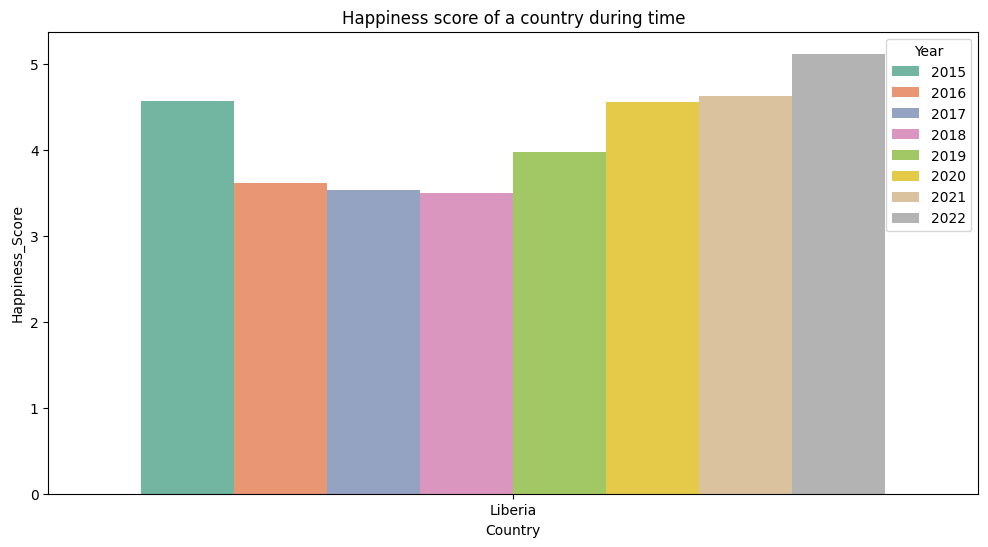

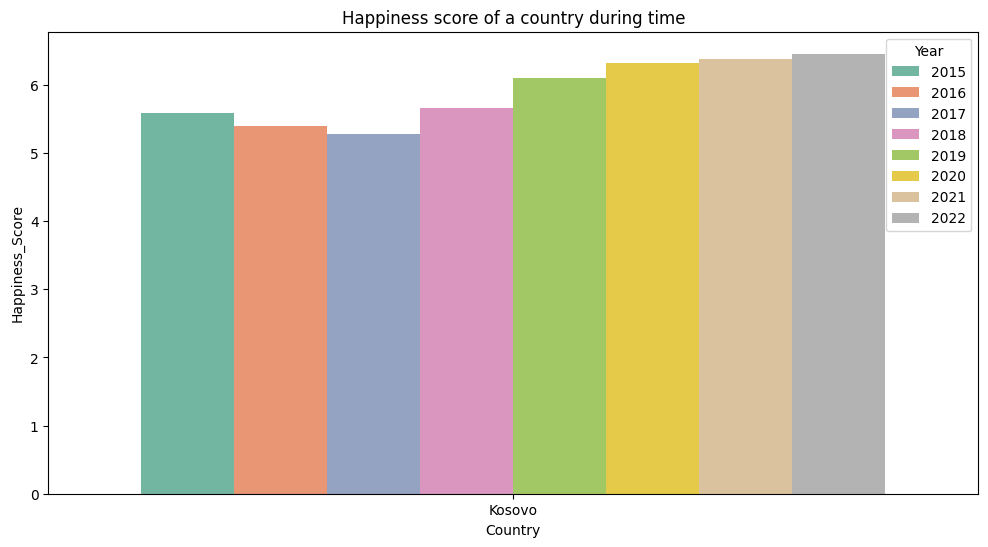

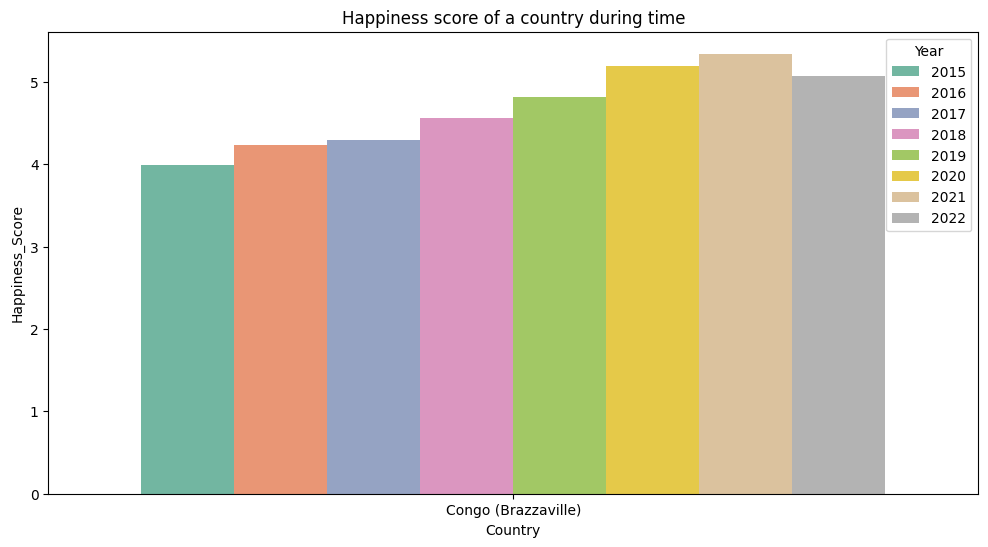

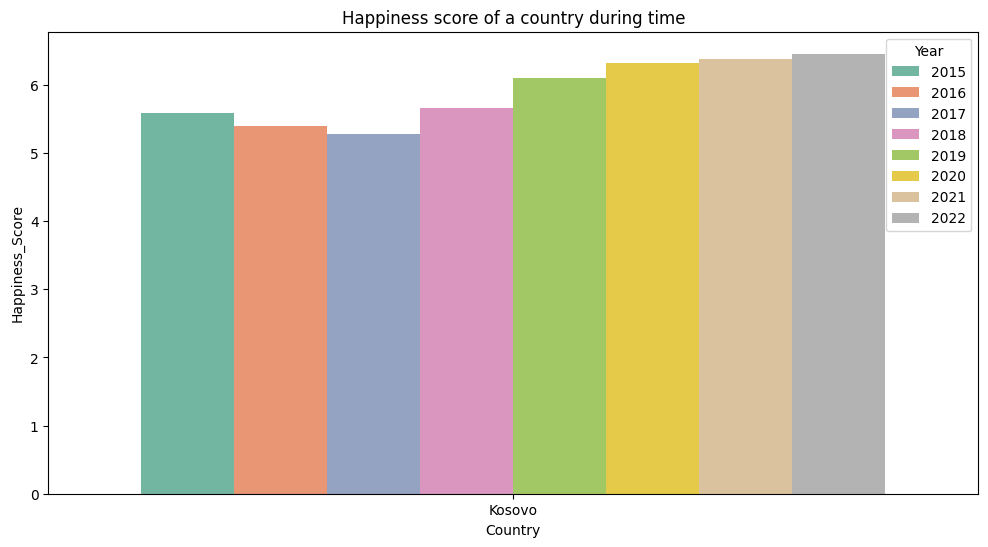

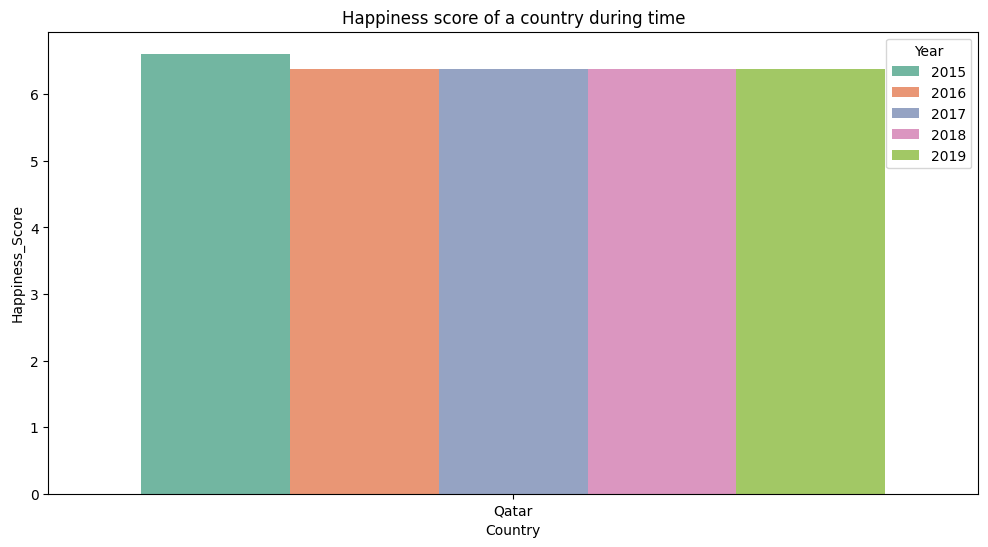

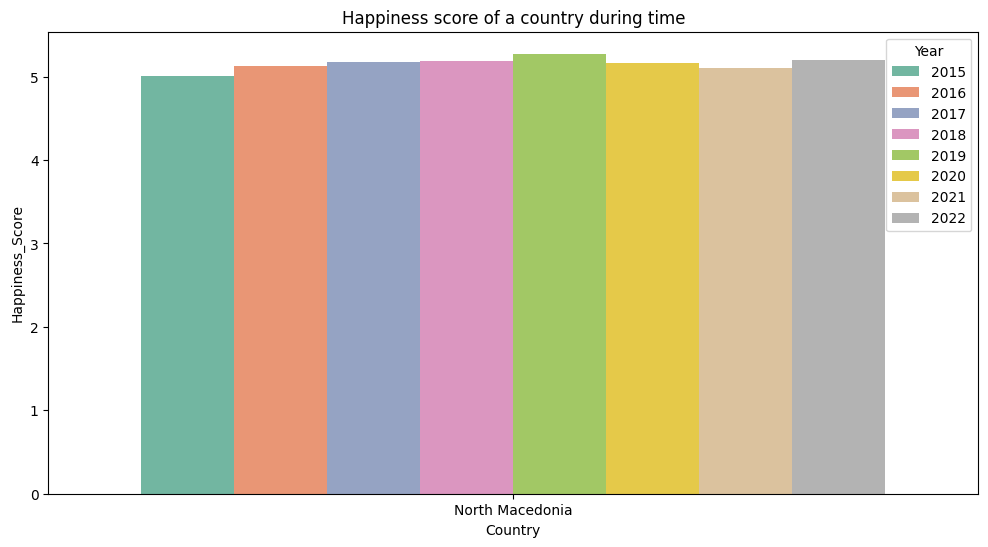

In [124]:
df_sample = df["Country"].sample(n = 10) # get 10 sample countries from dataframe to check, how is happiness score changing over years
print("Randomly selected countries: ")   # print header
print(df_sample)                         # print sample of countries

for i in df_sample:
    x = df.loc[df["Country"] == i] # get all rows with country from sample 

    # print graph for country
    fig, ax = plt.subplots(figsize=(12,6))
    sns.barplot(x, 
            x = "Country",
            y = "Happiness_Score",
            hue = "Year",
            palette = "Set2");
    ax.set(title = "Happiness score of a country during time");


# Check country, how many year we have stored

We've some countries, that don't have for each year an observation. For this case we decided, that we are looking for this countries. Maybe we can find something, for example other name for the same country. When this should happen, we can merge more countries and get better results.

### Next steps:
- look, how many countries are without observation in each year
- look, how many year we have stored for the country
- create a graph with this countries, to see the results (a countplot show us the number of observations)

In [52]:
country_counts = df.groupby('Country')['Year'].count()
print("Number of countries without observation in each year: ", len(country_counts[country_counts != 8]))

Number of countries without observation in each year:  42


In [53]:
for i in range(1, country_counts.max() + 1):
    print("Number of years stored in dataframe: ", i)
    print(" - number of countries with this number of years: ", country_counts[country_counts == i].count())

Number of years stored in dataframe:  1
 - number of countries with this number of years:  9
Number of years stored in dataframe:  2
 - number of countries with this number of years:  4
Number of years stored in dataframe:  3
 - number of countries with this number of years:  3
Number of years stored in dataframe:  4
 - number of countries with this number of years:  9
Number of years stored in dataframe:  5
 - number of countries with this number of years:  6
Number of years stored in dataframe:  6
 - number of countries with this number of years:  3
Number of years stored in dataframe:  7
 - number of countries with this number of years:  8
Number of years stored in dataframe:  8
 - number of countries with this number of years:  133


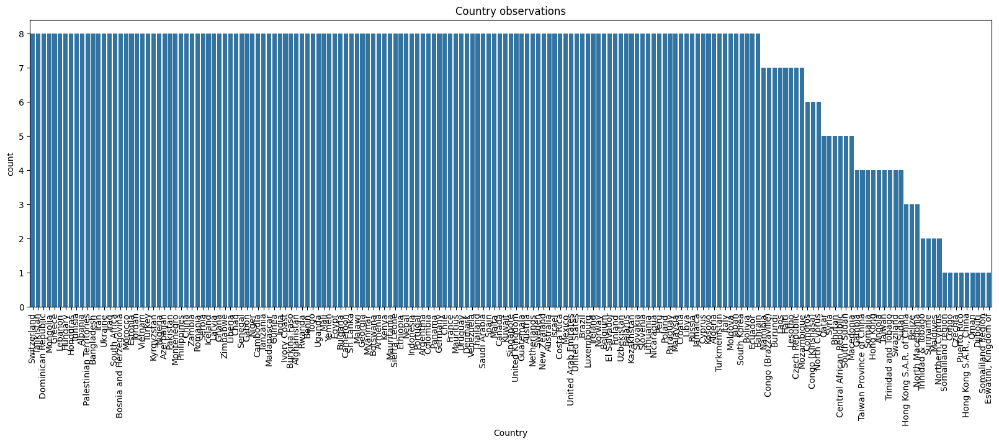

In [54]:
# Simple countplot, to see the countries with count of observations
fig, ax = plt.subplots(figsize=(20,6))
sns.countplot(
    df, 
    x = "Country",
    order = df["Country"].value_counts().index);
ax.tick_params(axis="x", labelrotation = 90);
ax.set(title = "Country observations");


# Important: 

check the countries with lower then 8 observation for an year. <br>

**In the countplot above we discovered for example:** <br>
- Czech Republic (7 Observations) and Czechia (1 Observation), this should by together, is one country.<br>

Below we print pro country, how many observation we have. Intentionally, we don't print the countries with 8 observations.

In [55]:
for i in range(1, country_counts.max()):
    print("Number of years stored in dataframe: ", i)
    print(country_counts[country_counts == i])
    print()

Number of years stored in dataframe:  1
Country
Congo                      1
Czechia                    1
Djibouti                   1
Eswatini, Kingdom of       1
Hong Kong S.A.R., China    1
Oman                       1
Puerto Rico                1
Somaliland Region          1
Somaliland region          1
Name: Year, dtype: int64

Number of years stored in dataframe:  2
Country
Maldives             2
Northern Cyprus      2
Suriname             2
Trinidad & Tobago    2
Name: Year, dtype: int64

Number of years stored in dataframe:  3
Country
Belize                       3
Hong Kong S.A.R. of China    3
North Macedonia              3
Name: Year, dtype: int64

Number of years stored in dataframe:  4
Country
Angola                      4
Gambia                      4
Hong Kong                   4
Somalia                     4
Sudan                       4
Swaziland                   4
Taiwan                      4
Taiwan Province of China    4
Trinidad and Tobago         4
Name: Year, dt

### After analysis of the observation we can do following corrections of the data:
- Czech Republic 7 and Czechia 1 = Czech Republic with 8 observations <br>
- Somaliland Region 1 and Somaliland region 1 = Somaliland Region 2 <br>
- Hong Kong S.A.R., China 1 and Hong Kong S.A.R. of China 3 and Hong Kong 4 = Hong Kong 8 <br>
- Northern Cyprus 2 and North Cyprus = North Cyprus 8 <br>
- Trinidad & Tobago 2 and Trinidad and Tobago 4 = Trinidad and Tobago 6 <br>
- Taiwan 4 and Taiwan Province of China 4 = Taiwan Province of China 8 <br>
- North Macedonia 3 and Macedonia 5 = North Macedonia 8 <br>
- Congo (Brazzaville) 7 and Congo 1 (Congo is also know as Congo Braziaville) = Congo (Brazzaville) 8 <br>
- Swaziland (4) and Eswatini, Kingdom of (1) = Eswatini, Kingdom of 5 <br>

### Modifing the Country names in dataframe, some of them have only a other typo

- create a new dataframe, copy of original <br>
- in this dataframe we modifing the country names <br>
- do the analysis of countries <br>

In [56]:
df_modifed = df # create a new dataframe, where we modify the countries as above mentioned

In [57]:
df_modifed.Country = df_modifed.Country.replace("Czechia", "Czech Republic")
df_modifed.Country = df_modifed.Country.replace("Somaliland region", "Somaliland Region")
df_modifed.Country = df_modifed.Country.replace("Hong Kong S.A.R., China", "Hong Kong S.A.R. of China")
df_modifed.Country = df_modifed.Country.replace("Hong Kong S.A.R. of China", "Hong Kong")
df_modifed.Country = df_modifed.Country.replace("Northern Cyprus", "North Cyprus")
df_modifed.Country = df_modifed.Country.replace("Trinidad & Tobago", "Trinidad and Tobago")
df_modifed.Country = df_modifed.Country.replace("Taiwan", "Taiwan Province of China")
df_modifed.Country = df_modifed.Country.replace("Macedonia", "North Macedonia")
df_modifed.Country = df_modifed.Country.replace("Congo", "Congo (Brazzaville)")
df_modifed.Country = df_modifed.Country.replace("Swaziland", "Eswatini, Kingdom of")


In [58]:
mod_country_counts = df_modifed.groupby('Country')['Year'].count()
for i in range(1, mod_country_counts.max()):
    print("Number of years stored in dataframe: ", i)
    print(mod_country_counts[mod_country_counts == i])
    print()

Number of years stored in dataframe:  1
Country
Djibouti       1
Oman           1
Puerto Rico    1
Name: Year, dtype: int64

Number of years stored in dataframe:  2
Country
Maldives             2
Somaliland Region    2
Suriname             2
Name: Year, dtype: int64

Number of years stored in dataframe:  3
Country
Belize    3
Name: Year, dtype: int64

Number of years stored in dataframe:  4
Country
Angola     4
Gambia     4
Somalia    4
Sudan      4
Name: Year, dtype: int64

Number of years stored in dataframe:  5
Country
Bhutan                      5
Central African Republic    5
Eswatini, Kingdom of        5
Qatar                       5
South Sudan                 5
Syria                       5
Name: Year, dtype: int64

Number of years stored in dataframe:  6
Country
Comoros                6
Congo (Kinshasa)       6
Trinidad and Tobago    6
Name: Year, dtype: int64

Number of years stored in dataframe:  7
Country
Burundi       7
Haiti         7
Laos          7
Lesotho       7
Mozam

### After Modifing:

- we can see, that we have only 26 countries without observation in each year
- we can discover also in the countplot, that we have more countries with complete observations.

In [59]:
mod_country_counts = df_modifed.groupby('Country')['Year'].count()
print("Number of countries without observation in each year: ", len(mod_country_counts[mod_country_counts != 8]))

Number of countries without observation in each year:  26


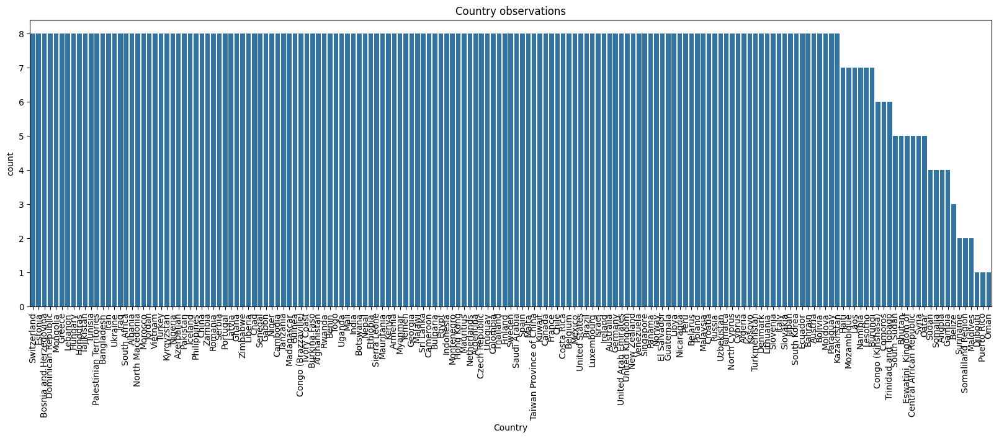

In [60]:
fig, ax = plt.subplots(figsize=(20,6))
sns.countplot(
    df_modifed, 
    x = "Country",
    order = df_modifed["Country"].value_counts().index);
ax.tick_params(axis="x", labelrotation = 90);
ax.set(title = "Country observations");

# Countries with zero Values

Check the countries with 0-values observation, how are the observations during years. <br>
First, create a simply dataframe with countries, where we have a 0 value. <br>


In [61]:
df_col_with_zero = []                               # create empty list
numeric_columns = list(df_list[7].columns[2:8])     # create numeric columns to iterate
print(numeric_columns)                              # print numeric columns
print()

# create list of dataframes with country, where are the 0 values
for col in numeric_columns:
    df_col_with_zero.append(df_modifed.loc[df_modifed[col] == 0, ["Country"]])

df_zero = pd.concat(df_col_with_zero)        # create dataframe from list 
df_zero = df_zero.sort_values("Country")     # sort by country
df_zero = df_zero.drop_duplicates("Country") # delete duplicates, we need only the country names once
display(df_zero)                             # print countries with zero values

['Economy_GDP_Per_Capita', 'Social_Support', 'Health_Life_Expectancy', 'Freedom', 'Generosity', 'Perceptions_Of_Corruption']



,Country
153,Afghanistan
141,Angola
92,Bosnia and Herzegovina
95,Bulgaria
139,Burundi
154,Central African Republic
127,Chad
119,Congo (Kinshasa)
59,Croatia
134,"Eswatini, Kingdom of"


## Print for country with zero values all observation 

Print for each country all observation, that we can discover, where the zero values are and if they are ok or not

In [62]:
countries = df_zero["Country"].tolist()
for i in countries:
    print("Country: all year in dataset and 0 values - ", i)
    display(df_modifed[df_modifed["Country"] == i])


Country: all year in dataset and 0 values -  Afghanistan


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
152,Afghanistan,3.5750,0.319820,0.302850,0.303350,0.23414,0.365100,0.097190,2015
153,Afghanistan,3.3600,0.382270,0.110370,0.173440,0.16430,0.312680,0.071120,2016
140,Afghanistan,3.7940,0.401477,0.581543,0.180747,0.10618,0.311871,0.061158,2017
144,Afghanistan,3.6320,0.332000,0.537000,0.255000,0.08500,0.191000,0.036000,2018
153,Afghanistan,3.2030,0.350000,0.517000,0.361000,0.00000,0.158000,0.025000,2019
152,Afghanistan,2.5669,0.300706,0.356434,0.266052,0.00000,0.135235,0.001226,2020
148,Afghanistan,2.5230,0.370000,0.000000,0.126000,0.00000,0.122000,0.010000,2021
145,Afghanistan,2.4040,0.758000,0.000000,0.289000,0.00000,0.089000,0.005000,2022


Country: all year in dataset and 0 values -  Angola


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
136,Angola,4.033,0.757780,0.860400,0.166830,0.10384,0.123440,0.07122,2015
140,Angola,3.866,0.847310,0.663660,0.049910,0.00589,0.120710,0.08434,2016
139,Angola,3.795,0.858428,1.104412,0.049869,0.00000,0.097926,0.06972,2017
141,Angola,3.795,0.730000,1.125000,0.269000,0.00000,0.079000,0.06100,2018


Country: all year in dataset and 0 values -  Bosnia and Herzegovina


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
95,Bosnia and Herzegovina,4.9490,0.832230,0.919160,0.790810,0.092450,0.248080,0.002270,2015
86,Bosnia and Herzegovina,5.1630,0.933830,0.643670,0.707660,0.095110,0.298890,0.000000,2016
89,Bosnia and Herzegovina,5.1820,0.982409,1.069336,0.705186,0.204403,0.328867,0.000000,2017
92,Bosnia and Herzegovina,5.1290,0.915000,1.078000,0.758000,0.280000,0.216000,0.000000,2018
77,Bosnia and Herzegovina,5.3860,0.945000,1.212000,0.845000,0.212000,0.263000,0.006000,2019
68,Bosnia and Herzegovina,5.6741,0.918395,1.203987,0.813928,0.305366,0.264005,0.001172,2020
63,Bosnia and Herzegovina,5.8130,1.032000,0.919000,0.618000,0.395000,0.261000,0.005000,2021
66,Bosnia and Herzegovina,5.7680,1.468000,1.068000,0.665000,0.448000,0.244000,0.006000,2022


Country: all year in dataset and 0 values -  Bulgaria


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
133,Bulgaria,4.2180,1.012160,1.106140,0.766490,0.305870,0.119210,0.008720,2015
128,Bulgaria,4.2170,1.113060,0.925420,0.678060,0.212190,0.127930,0.006150,2016
104,Bulgaria,4.7140,1.161459,1.434379,0.708218,0.289232,0.113178,0.011052,2017
99,Bulgaria,4.9330,1.054000,1.515000,0.712000,0.359000,0.064000,0.009000,2018
96,Bulgaria,5.0110,1.092000,1.513000,0.815000,0.311000,0.081000,0.004000,2019
95,Bulgaria,5.1015,1.046555,1.460579,0.777777,0.417820,0.103834,0.000000,2020
87,Bulgaria,5.2660,1.181000,1.055000,0.583000,0.494000,0.125000,0.005000,2021
84,Bulgaria,5.3710,1.625000,1.163000,0.640000,0.563000,0.123000,0.021000,2022


Country: all year in dataset and 0 values -  Burundi


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
156,Burundi,2.9050,0.015300,0.415870,0.223960,0.118500,0.197270,0.100620,2015
156,Burundi,2.9050,0.068310,0.234420,0.157470,0.043200,0.202900,0.094190,2016
153,Burundi,2.9050,0.091623,0.629794,0.151611,0.059901,0.204435,0.084148,2017
155,Burundi,2.9050,0.091000,0.627000,0.145000,0.065000,0.149000,0.076000,2018
144,Burundi,3.7750,0.046000,0.447000,0.380000,0.220000,0.176000,0.180000,2019
139,Burundi,3.7753,0.000000,0.403575,0.295213,0.275399,0.187402,0.212187,2020
139,Burundi,3.7750,0.000000,0.062000,0.155000,0.298000,0.172000,0.212000,2021


Country: all year in dataset and 0 values -  Central African Republic


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
147,Central African Republic,3.6780,0.078500,0.0,0.066990,0.488790,0.238350,0.082890,2015
154,Central African Republic,2.6930,0.000000,0.0,0.018773,0.270842,0.280876,0.056565,2017
154,Central African Republic,3.0830,0.024000,0.0,0.010000,0.305000,0.218000,0.038000,2018
154,Central African Republic,3.0830,0.026000,0.0,0.105000,0.225000,0.235000,0.035000,2019
148,Central African Republic,3.4759,0.041072,0.0,0.000000,0.292814,0.253513,0.028265,2020


Country: all year in dataset and 0 values -  Chad


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
148,Chad,3.6670,0.341930,0.760620,0.150100,0.235010,0.183860,0.052690,2015
143,Chad,3.7630,0.422140,0.631780,0.038240,0.128070,0.186670,0.049520,2016
136,Chad,3.9360,0.438013,0.953856,0.041135,0.162342,0.216114,0.053582,2017
130,Chad,4.3010,0.358000,0.907000,0.053000,0.189000,0.181000,0.060000,2018
131,Chad,4.3500,0.350000,0.766000,0.192000,0.174000,0.198000,0.078000,2019
126,Chad,4.4227,0.302287,0.739118,0.108744,0.228602,0.210805,0.085755,2020
127,Chad,4.3550,0.255000,0.353000,0.000000,0.240000,0.215000,0.084000,2021
129,Chad,4.2510,0.662000,0.506000,0.225000,0.180000,0.182000,0.077000,2022


Country: all year in dataset and 0 values -  Congo (Kinshasa)


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
119,Congo (Kinshasa),4.517,0.000000,1.001200,0.098060,0.226050,0.248340,0.076250,2015
124,Congo (Kinshasa),4.272,0.056610,0.806760,0.188000,0.156020,0.254580,0.060750,2016
125,Congo (Kinshasa),4.280,0.092102,1.229023,0.191407,0.235961,0.246456,0.060241,2017
131,Congo (Kinshasa),4.245,0.069000,1.136000,0.204000,0.312000,0.197000,0.052000,2018
126,Congo (Kinshasa),4.418,0.094000,1.125000,0.357000,0.269000,0.212000,0.053000,2019
130,Congo (Kinshasa),4.311,0.062487,0.833055,0.277212,0.364623,0.254325,0.081467,2020


Country: all year in dataset and 0 values -  Croatia


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
61,Croatia,5.7590,1.082540,0.796240,0.788050,0.258830,0.054440,0.024300,2015
73,Croatia,5.4880,1.186490,0.608090,0.705240,0.239070,0.184340,0.040020,2016
76,Croatia,5.2930,1.222556,0.967983,0.701289,0.255772,0.248003,0.043103,2017
81,Croatia,5.3210,1.115000,1.161000,0.737000,0.380000,0.120000,0.039000,2018
74,Croatia,5.4320,1.155000,1.266000,0.914000,0.296000,0.119000,0.022000,2019
78,Croatia,5.5047,1.109024,1.311265,0.900576,0.381457,0.113999,0.012325,2020
59,Croatia,5.8820,1.251000,1.039000,0.703000,0.453000,0.111000,0.000000,2021
46,Croatia,6.1250,1.705000,1.183000,0.709000,0.535000,0.109000,0.000000,2022


Country: all year in dataset and 0 values -  Eswatini, Kingdom of


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
100,"Eswatini, Kingdom of",4.8670,0.71206,1.072840,0.075660,0.306580,0.182590,0.030600,2015
134,"Eswatini, Kingdom of",4.2120,0.81100,1.149000,0.000000,0.313000,0.074000,0.135000,2019
131,"Eswatini, Kingdom of",4.3081,0.82754,1.064835,0.215586,0.299936,0.067265,0.146766,2020
129,"Eswatini, Kingdom of",4.3080,0.84900,0.693000,0.074000,0.323000,0.067000,0.147000,2021
124,"Eswatini, Kingdom of",4.3960,1.27400,0.786000,0.197000,0.259000,0.038000,0.154000,2022


Country: all year in dataset and 0 values -  Georgia


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
129,Georgia,4.2970,0.741900,0.385620,0.729260,0.405770,0.055470,0.383310,2015
125,Georgia,4.2520,0.837920,0.192490,0.640350,0.324610,0.067860,0.318800,2016
124,Georgia,4.2860,0.950613,0.570615,0.649547,0.309410,0.054009,0.251667,2017
127,Georgia,4.3400,0.853000,0.592000,0.643000,0.375000,0.038000,0.215000,2018
118,Georgia,4.5190,0.886000,0.666000,0.752000,0.346000,0.043000,0.164000,2019
116,Georgia,4.6726,0.847198,0.731194,0.694658,0.485494,0.047610,0.174088,2020
107,Georgia,4.8910,1.030000,0.470000,0.498000,0.488000,0.032000,0.181000,2021
104,Georgia,4.9730,1.467000,0.612000,0.595000,0.508000,0.000000,0.208000,2022


Country: all year in dataset and 0 values -  Greece


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
101,Greece,4.857,1.154060,0.929330,0.882130,0.076990,0.000,0.013970,2015
98,Greece,5.033,1.248860,0.754730,0.800290,0.058220,0.000,0.041270,2016
86,Greece,5.227,1.289487,1.239415,0.810199,0.095731,0.000,0.043290,2017
78,Greece,5.358,1.154000,1.202000,0.879000,0.131000,0.000,0.044000,2018
81,Greece,5.287,1.181000,1.156000,0.999000,0.067000,0.000,0.034000,2019
76,Greece,5.515,1.128070,1.168974,0.979432,0.173516,0.000,0.048844,2020
67,Greece,5.723,1.273000,0.811000,0.760000,0.243000,0.000,0.074000,2021
57,Greece,5.948,1.703000,0.980000,0.774000,0.249000,0.015,0.108000,2022


Country: all year in dataset and 0 values -  Indonesia


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
73,Indonesia,5.3990,0.828270,1.087080,0.637930,0.466110,0.515350,0.000000,2015
78,Indonesia,5.3140,0.951040,0.876250,0.493740,0.392370,0.565210,0.003220,2016
80,Indonesia,5.2620,0.995539,1.274445,0.492346,0.443323,0.611705,0.015317,2017
95,Indonesia,5.0930,0.899000,1.215000,0.522000,0.538000,0.484000,0.018000,2018
91,Indonesia,5.1920,0.931000,1.203000,0.660000,0.491000,0.498000,0.028000,2019
83,Indonesia,5.2856,0.891721,1.154801,0.610437,0.568161,0.542647,0.038279,2020
81,Indonesia,5.3450,0.954000,0.786000,0.433000,0.598000,0.541000,0.046000,2021
86,Indonesia,5.2400,1.382000,0.883000,0.539000,0.620000,0.468000,0.047000,2022


Country: all year in dataset and 0 values -  Iraq


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
111,Iraq,4.6770,0.985490,0.818890,0.602370,0.000000,0.179220,0.137880,2015
111,Iraq,4.5750,1.074740,0.592050,0.510760,0.248560,0.195890,0.136360,2016
116,Iraq,4.4970,1.102710,0.978613,0.501180,0.288556,0.199637,0.107216,2017
116,Iraq,4.4560,1.010000,0.971000,0.536000,0.304000,0.148000,0.095000,2018
125,Iraq,4.4370,1.043000,0.980000,0.574000,0.241000,0.148000,0.089000,2019
109,Iraq,4.7848,0.982019,1.011467,0.529351,0.283588,0.153002,0.073165,2020
110,Iraq,4.8540,0.910000,0.638000,0.381000,0.302000,0.153000,0.041000,2021
106,Iraq,4.9410,1.289000,0.682000,0.554000,0.328000,0.147000,0.046000,2022


Country: all year in dataset and 0 values -  Lesotho


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
96,Lesotho,4.8980,0.375450,1.041030,0.076120,0.317670,0.163880,0.125040,2015
138,Lesotho,3.8080,0.521021,1.190095,0.000000,0.390661,0.157497,0.119095,2017
140,Lesotho,3.8080,0.472000,1.215000,0.079000,0.423000,0.116000,0.112000,2018
143,Lesotho,3.8020,0.489000,1.169000,0.168000,0.359000,0.107000,0.093000,2019
142,Lesotho,3.6528,0.454939,1.088940,0.100935,0.409368,0.102628,0.050484,2020
144,Lesotho,3.5120,0.451000,0.731000,0.007000,0.405000,0.103000,0.015000,2021
140,Lesotho,3.5120,0.839000,0.848000,0.000000,0.419000,0.076000,0.018000,2022


Country: all year in dataset and 0 values -  Moldova


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
51,Moldova,5.8890,0.594480,1.015280,0.618260,0.328180,0.209510,0.016150,2015
54,Moldova,5.8970,0.691770,0.831320,0.523090,0.252020,0.199970,0.019030,2016
55,Moldova,5.8380,0.728871,1.251826,0.589465,0.240729,0.208779,0.010091,2017
66,Moldova,5.6400,0.657000,1.301000,0.620000,0.232000,0.171000,0.000000,2018
70,Moldova,5.5290,0.685000,1.328000,0.739000,0.245000,0.181000,0.000000,2019
69,Moldova,5.6075,0.707917,1.237312,0.713299,0.389571,0.174049,0.014379,2020
64,Moldova,5.7660,0.985000,0.888000,0.542000,0.536000,0.137000,0.013000,2021
61,Moldova,5.8570,1.417000,1.008000,0.597000,0.561000,0.102000,0.028000,2022


Country: all year in dataset and 0 values -  Sierra Leone


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
122,Sierra Leone,4.5070,0.330240,0.955710,0.000000,0.408400,0.214880,0.087860,2015
110,Sierra Leone,4.6350,0.364850,0.628000,0.000000,0.306850,0.238970,0.081960,2016
105,Sierra Leone,4.7090,0.368421,0.984136,0.005565,0.318698,0.293041,0.071095,2017
112,Sierra Leone,4.5710,0.256000,0.813000,0.000000,0.355000,0.238000,0.053000,2018
128,Sierra Leone,4.3740,0.268000,0.841000,0.242000,0.309000,0.252000,0.045000,2019
138,Sierra Leone,3.9264,0.240560,0.747985,0.203954,0.382028,0.257647,0.047941,2020
137,Sierra Leone,3.8490,0.279000,0.377000,0.100000,0.408000,0.243000,0.047000,2021
139,Sierra Leone,3.5740,0.686000,0.416000,0.273000,0.387000,0.202000,0.055000,2022


Country: all year in dataset and 0 values -  Somalia


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
75,Somalia,5.440,0.000000,0.336130,0.114660,0.567780,0.272250,0.31180,2016
92,Somalia,5.151,0.022643,0.721151,0.113989,0.602127,0.291631,0.28241,2017
97,Somalia,4.982,0.000000,0.712000,0.115000,0.674000,0.238000,0.28200,2018
111,Somalia,4.668,0.000000,0.698000,0.268000,0.559000,0.243000,0.27000,2019


Country: all year in dataset and 0 values -  Sudan


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
117,Sudan,4.550,0.521070,1.014040,0.368780,0.100810,0.190620,0.146600,2015
132,Sudan,4.139,0.630690,0.819280,0.297590,0.000000,0.180770,0.100390,2016
129,Sudan,4.139,0.659517,1.214009,0.290921,0.014996,0.182317,0.089848,2017
136,Sudan,4.139,0.605000,1.240000,0.312000,0.016000,0.134000,0.082000,2018


Country: all year in dataset and 0 values -  Togo


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
157,Togo,2.8390,0.208680,0.139950,0.284430,0.364530,0.166810,0.107310,2015
154,Togo,3.3030,0.281230,0.000000,0.248110,0.346780,0.175170,0.115870,2016
149,Togo,3.4950,0.305445,0.431883,0.247106,0.380426,0.196896,0.095665,2017
138,Togo,3.9990,0.259000,0.474000,0.253000,0.434000,0.158000,0.101000,2018
138,Togo,4.0850,0.275000,0.572000,0.410000,0.293000,0.177000,0.085000,2019
134,Togo,4.1872,0.268116,0.547623,0.342731,0.303539,0.200774,0.114826,2020
135,Togo,4.1070,0.254000,0.239000,0.203000,0.289000,0.209000,0.107000,2021
134,Togo,4.1120,0.771000,0.322000,0.360000,0.292000,0.174000,0.132000,2022


Country: all year in dataset and 0 values -  Venezuela


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
22,Venezuela,6.8100,1.044240,1.255960,0.720520,0.429080,0.058410,0.110690,2015
43,Venezuela,6.0840,1.133670,1.033020,0.619040,0.198470,0.042500,0.083040,2016
81,Venezuela,5.2500,1.128431,1.431338,0.617144,0.153997,0.065020,0.064491,2017
101,Venezuela,4.8060,0.996000,1.469000,0.657000,0.133000,0.056000,0.052000,2018
107,Venezuela,4.7070,0.960000,1.427000,0.805000,0.154000,0.064000,0.047000,2019
98,Venezuela,5.0532,0.770239,1.348547,0.767026,0.271717,0.087179,0.063625,2020
106,Venezuela,4.8920,0.852000,0.897000,0.574000,0.284000,0.078000,0.072000,2021
107,Venezuela,4.9250,0.000000,0.968000,0.578000,0.283000,0.225000,0.082000,2022


**In the following countries, we have in our dataset 0 values:** <br>
Short answer after analysis: <br>
- In some countries, we’ve zero values in more columns that one and in more years <br>
- In some countries, we’ve the zero values only in one column, but in more years <br>
- In some countries, we’ve the zero values only in one column and one year <br>
- In some countries, we’ve zero values in more columns that one and in for one year (different year or the same) <br>

*Question: should we manipulate the data or not?* - no, the data are ok <br>

Afghanistan <br>
Angola <br>
Bosnia and Herzegovina <br>
Bulgaria <br>
Burundi <br>
Central African Republic <br>
Chad <br>
Congo (Kinshasa) <br>
Croatia <br>
Eswatini, Kingdom of <br>
Georgia <br>
Greece <br>
Indonesia <br>
Iraq <br>
Lesotho <br>
Moldova <br>
Sierra Leone <br>
Somalia <br>
Sudan <br>
Togo <br>
Venezuela <br>

# DATA MODELLING

### Import Library's

In [63]:
from sklearn.model_selection import train_test_split                                                   # Import train_test_split to separate train and test set
from sklearn.model_selection import cross_val_score                                                    # Import cross-validation
from sklearn.model_selection import GridSearchCV                                                       # Import Exhaustive search over specified parameter values for an estimator

from sklearn.preprocessing import MinMaxScaler                                                         # Import MinMaxScaler to scale the features
from sklearn.preprocessing import StandardScaler                                                       # Import StandardScaler to scale the features
from sklearn.preprocessing import PolynomialFeatures                                                   # Import Polynomial Features

from sklearn.feature_selection import VarianceThreshold                                                # Import VarianceThreshold to removes all low-variance features

from sklearn.linear_model import LinearRegression, Lasso                                               # Import Linear Regression and Lasso 
from sklearn.neighbors import KNeighborsRegressor                                                      # Import K-Nearest neighbors Regressor
from sklearn.neural_network import MLPRegressor                                                        # Import Multi-layer Perceptron regressor
from sklearn.ensemble import BaggingRegressor                                                          # Import Bagging regressor (tuning model)

from sklearn.metrics import mean_squared_error, mean_absolute_error, root_mean_squared_error, r2_score # Import selected metrics

import warnings                                                                                        # Import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)                                         # disable future warnings


We are creating a new dataframe with all observations, where we save the data for our next steps. <br>
We print the info function, that we have a summary for our dataset. <br>
We select only the numeric columns
We print the descriptive statistics of there variables

In [64]:
data = pd.DataFrame(df_modifed) # create dataframe
data.head(5)                    # print first 5 rows of dataframe

,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
0,Switzerland,7.587,1.39651,1.34951,0.94143,0.66557,0.29678,0.41978,2015
1,Iceland,7.561,1.30232,1.40223,0.94784,0.62877,0.43630,0.14145,2015
2,Denmark,7.527,1.32548,1.36058,0.87464,0.64938,0.34139,0.48357,2015
3,Norway,7.522,1.45900,1.33095,0.88521,0.66973,0.34699,0.36503,2015
4,Canada,7.427,1.32629,1.32261,0.90563,0.63297,0.45811,0.32957,2015


In [65]:
data.info() # print dataframe information

<class 'pandas.core.frame.DataFrame'>
Index: 1230 entries, 0 to 145
Data columns (total 9 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Country                    1230 non-null   object 
 1   Happiness_Score            1230 non-null   float64
 2   Economy_GDP_Per_Capita     1230 non-null   float64
 3   Social_Support             1230 non-null   float64
 4   Health_Life_Expectancy     1230 non-null   float64
 5   Freedom                    1230 non-null   float64
 6   Generosity                 1230 non-null   float64
 7   Perceptions_Of_Corruption  1230 non-null   float64
 8   Year                       1230 non-null   int64  
dtypes: float64(7), int64(1), object(1)
memory usage: 96.1+ KB


In [66]:
data_numeric = data.select_dtypes(include = ['float64']) # select only columns with Dtype = float64

In [67]:
data_numeric.describe() # basic statistics

,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption
count,1230.000000,1230.000000,1230.000000,1230.000000,1230.000000,1230.000000,1230.000000
mean,5.430092,0.976255,1.032984,0.608132,0.440833,0.201583,0.130875
std,1.115361,0.435247,0.329526,0.241249,0.154415,0.115522,0.110851
min,2.404000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,4.584500,0.668250,0.824771,0.439250,0.344250,0.118000,0.056000
50%,5.410500,1.013580,1.069168,0.639427,0.458135,0.186984,0.096000
75%,6.226225,1.295961,1.273395,0.790795,0.559000,0.258494,0.164000
max,7.842000,2.209000,1.644000,1.141000,0.740000,0.838075,0.587000


### Range of numerical variables

We print the range for all columns in our dataset

In [68]:
numeric_columns = list(data_numeric.columns[0:7])

for col in numeric_columns:
    print(col, 'range is: ', data_numeric[col].max() - data_numeric[col].min())

Happiness_Score range is:  5.438
Economy_GDP_Per_Capita range is:  2.209
Social_Support range is:  1.644
Health_Life_Expectancy range is:  1.141
Freedom range is:  0.74
Generosity range is:  0.838075160980225
Perceptions_Of_Corruption range is:  0.587


### Split the data into training and test set

- split the data to train and test set <br>
- y -> test set = Happiness Score <br>
- x -> train set = other columns <br>

In [69]:
y = pd.DataFrame(data_numeric['Happiness_Score'])
x = pd.DataFrame(data_numeric[["Economy_GDP_Per_Capita", "Social_Support", "Health_Life_Expectancy", "Freedom", "Generosity", "Perceptions_Of_Corruption"]])

In [70]:
display(y.info) # Information about test set

<bound method DataFrame.info of      Happiness_Score
0              7.587
1              7.561
2              7.527
3              7.522
4              7.427
..               ...
141            3.471
142            3.268
143            2.995
144            2.955
145            2.404

[1230 rows x 1 columns]>

In [71]:
print(x.info) # Information about training set

<bound method DataFrame.info of      Economy_GDP_Per_Capita  Social_Support  Health_Life_Expectancy  Freedom  \
0                   1.39651         1.34951                 0.94143  0.66557   
1                   1.30232         1.40223                 0.94784  0.62877   
2                   1.32548         1.36058                 0.87464  0.64938   
3                   1.45900         1.33095                 0.88521  0.66973   
4                   1.32629         1.32261                 0.90563  0.63297   
..                      ...             ...                     ...      ...   
141                 1.50300         0.81500                 0.28000  0.57100   
142                 0.78500         0.13300                 0.46200  0.62100   
143                 0.94700         0.69000                 0.27000  0.32900   
144                 1.39200         0.49800                 0.63100  0.10300   
145                 0.75800         0.00000                 0.28900  0.00000   

     Ge

In [72]:
x_train, x_test, y_train, y_test = train_test_split(x,
                                                    y,
                                                    test_size = 0.3,
                                                    random_state = 42)

# Get the shape for all datasets -> x_train, x_test, y_train, y_test
x_train.shape, x_test.shape, y_train.shape, y_test.shape

((861, 6), (369, 6), (861, 1), (369, 1))

### MinMax Scaler

- create scaler
- fit scaler with train dataset
- print max data
- print min data

In [73]:
scaler = MinMaxScaler() 
scaler.fit(x_train)
print("Scaler, max data = ", scaler.data_max_)
print("Scaler, min data = ", scaler.data_min_)
#scaler = StandardScaler()

Scaler, max data =  [2.209   1.644   1.141   0.74    0.81971 0.587  ]
Scaler, min data =  [0. 0. 0. 0. 0. 0.]


- transform x training and test set and store in variables with _scaled

In [74]:
#x_train_scaled = scaler.fit_transform(x_train)
#x_test_scaled = scaler.transform(x_test)

x_train_scaled = scaler.transform(x_train)
x_test_scaled = scaler.transform(x_test)

- scaled training set informations:

In [75]:
print("Mean: ", x_train_scaled.mean(axis=0))
print("Standard Deviation: ", x_train_scaled.std(axis=0))
print("Minimum value: ", x_train_scaled.min(axis=0))
print("Maximum value: ", x_train_scaled.max(axis=0))

Mean:  [0.4502643  0.63236213 0.54139026 0.59739817 0.24650791 0.22378741]
Standard Deviation:  [0.19731644 0.19998836 0.20985063 0.21238927 0.141115   0.19007126]
Minimum value:  [0. 0. 0. 0. 0. 0.]
Maximum value:  [1. 1. 1. 1. 1. 1.]


- after rescaling we can see, that all the data are between 0 and 1

**Test** - test training informations:
- we can see, that not all the data are between 0 and 1. This is ok, because the test set wasn't trained, only the training set, that we don't have any data leak.

In [76]:
print("Mean: ", x_test_scaled.mean(axis=0))
print("Standard Deviation: ", x_test_scaled.std(axis=0))
print("Minimum value: ", x_test_scaled.min(axis=0))
print("Maximum value: ", x_test_scaled.max(axis=0))

Mean:  [0.42253038 0.61894162 0.51336278 0.59180386 0.24454645 0.22101529]
Standard Deviation:  [0.19472586 0.20091062 0.21352452 0.19936599 0.14029529 0.18567382]
Minimum value:  [0. 0. 0. 0. 0. 0.]
Maximum value:  [0.88592123 0.98783455 0.91586328 0.97837838 1.02240446 0.9318569 ]


## Encoding data

- in our dataset we have only numeric columns. As the Machine Learning algorithm can only work with vectors of numbers, we don't have the need to encoding our data. All our data are numbers.

## Feature Selection

### Constant features:
- we select the features, that have variance equal to zero
- we print the features

In [77]:
x_train_scaled = pd.DataFrame(x_train_scaled) # convert into DataFrame, that we can work on feature selection
x_train_scaled.info                           # print information

<bound method DataFrame.info of             0         1         2         3         4         5
0    0.205976  0.602798  0.333918  0.650000  0.329385  0.165247
1    0.600036  0.827603  0.766556  0.877541  0.416477  0.823799
2    0.601829  0.778692  0.782507  0.832108  0.580815  0.541976
3    0.198286  0.580204  0.036051  0.219381  0.263647  0.091281
4    0.173051  0.067135  0.152007  0.222027  0.381452  0.121158
..        ...       ...       ...       ...       ...       ...
856  0.443187  0.582725  0.453111  0.563514  0.220810  0.017036
857  0.860118  0.731752  0.676599  0.913514  0.314745  0.580920
858  0.771842  0.719586  0.621385  0.722973  0.132974  0.000000
859  0.502048  0.797606  0.789286  0.515482  0.139072  0.020997
860  0.701675  0.660584  0.576687  0.737838  0.267168  0.149915

[861 rows x 6 columns]>

In [78]:
our_constant_features = x_train_scaled.loc[:, x_train_scaled.var(ddof = 1) == 0]
display(our_constant_features)

""
0
1
2
3
4
...
856
857
858
859


After this analyse we can say, we don't have any features with zero variance. We don't have the need to delete any columns from our dataset

### Quasi-constant features

- check, which features have a very low variance (close to 0) <br>
- we create a threshold wit the value = 0.01 <br>
- in our training data, we find the quasi constant features, features to keep <br>

In [79]:
our_selector = VarianceThreshold(threshold = 0.01)
our_selector.fit(x_train_scaled)
features_to_keep = x_train.columns[our_selector.get_support()] # get column names

# Print Informations about Quasi-constant features
print("The number of features that will be kept: {}".format(len(features_to_keep)))
print()
print("Features to keep: ", features_to_keep)

The number of features that will be kept: 6

Features to keep:  Index(['Economy_GDP_Per_Capita', 'Social_Support', 'Health_Life_Expectancy',
       'Freedom', 'Generosity', 'Perceptions_Of_Corruption'],
      dtype='object')


- Afters this step, we can see, what we will keep 6 features in our dataset.
- we transform our training and test test, in this step, the quasi-constat features will be removed
- get the shape

In [80]:
x_train_scaled = our_selector.transform(x_train_scaled) # transforming training set
x_test_scaled = our_selector.transform(x_test_scaled)   # transforming test test

x_train_scaled.shape, x_test_scaled.shape               # print shape information for training and test set 

((861, 6), (369, 6))

- print out training set (nunpy array)
- convert the training and test set to dataframe
- print first 5 rows of training set

In [81]:
x_train_scaled = pd.DataFrame(x_train_scaled)       # Convert to dataframe
x_train_scaled.columns = features_to_keep           # get the column names

x_test_scaled = pd.DataFrame(x_test_scaled)         # Convert to dataframe
x_test_scaled.columns = features_to_keep            # get the column names

x_train_scaled.head(10)                             # print first 10 rows

,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption
0,0.205976,0.602798,0.333918,0.650000,0.329385,0.165247
1,0.600036,0.827603,0.766556,0.877541,0.416477,0.823799
2,0.601829,0.778692,0.782507,0.832108,0.580815,0.541976
3,0.198286,0.580204,0.036051,0.219381,0.263647,0.091281
4,0.173051,0.067135,0.152007,0.222027,0.381452,0.121158
5,0.473065,0.527981,0.521472,0.236486,0.170792,0.044293
6,0.523566,0.878920,0.558908,0.399190,0.189259,0.266293
7,0.541874,0.928832,0.627520,0.472973,0.031719,0.010221
8,0.496601,0.804919,0.779370,0.564165,0.189798,0.107069
9,0.615428,0.439136,0.776906,0.340108,0.229642,0.131448


## Correlation

In this step, we create a new dataset with correlation and display a heatmap of this dataframe.

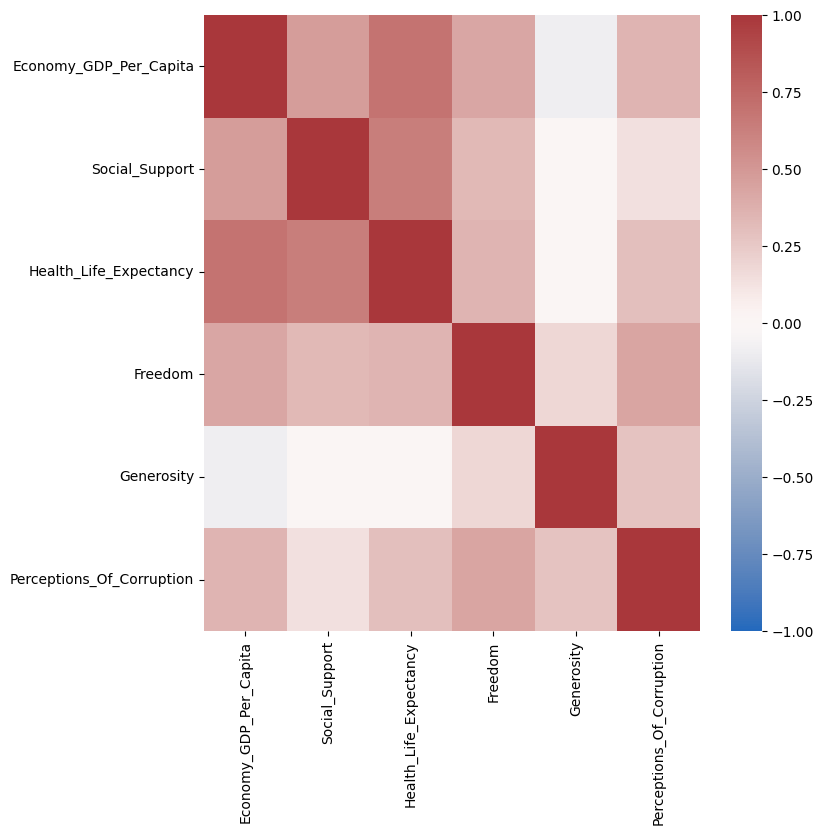

In [82]:
corr_matrix = x_train_scaled.corr() # Find the correlation

# plot the heatmap
plt.figure(figsize=(8, 8))
sns.heatmap(corr_matrix, 
            cmap="vlag", 
            vmin=-1, 
            vmax=1);

in this heatmap we can see, that we have a strong correlation between:
- Economy GDP per Capita and Social Support
- Social Support and Health life Expectancy
- Social Support and Economy GDP per Capita
- Freedom and Economy GDP per Capita
- Economy GDP per Capita and Perceptions of Corruption
- Freedom and Perceptions of Corruption

## Function - plot coefficients

In [83]:
def plot_coef(lr_coef, names=[], ordered=True, hide_zero=False, figsize=(12,20)):
    """
    The function plots coefficients' values from the linear model.
    --------
    params:
        lr_coef: coefficients as they are returned from the classifier's attributes
        names: names for the coefficients, if left empty x0, x1, ... will be used
        ordered: order the coefficients according to their value
        hide_zero: hide all coefficients which are equal to 0
        figsize: tuple spcifying the size of the plot
    """
    if len(names) < 1:
        names = [f"x{i}" for i in range(len(lr_coef))]

    named_coef = pd.DataFrame({"attr": names, "coef": lr_coef})
    
    if hide_zero:
        named_coef = named_coef[named_coef["coef"] != 0]

    if ordered:
        named_coef.sort_values(by="coef", ascending=True, inplace=True)

    fig, ax = plt.subplots(figsize=figsize)

    ax.axvline(x=0, c="orange", ls="--")
    ax.scatter(x="coef", y="attr", data=named_coef)
    ax.margins(y=0.01)
    ax.set_title("Coefficients' values")

## Linear regression

- Instantiate the linear regression model.
- Fit the model to the scaled training data.
- Print the RSME (Cost Function) for training and test set

In [125]:
lr = LinearRegression()
lr.fit(x_train_scaled, y_train) # fit the model                                              

# Predict 
y_predict_train = lr.predict(x_train_scaled)
y_predict_test = lr.predict(x_test_scaled)

# Print RSME for the training and test set
print(f"RMSE train: {root_mean_squared_error(y_train, y_predict_train)}")
print(f"RMSE test: {root_mean_squared_error(y_test, y_predict_test)}")

RMSE train: 0.5612116922285804
RMSE test: 0.5784985369686733


- Return the values of the coefficients and save them under the variable model_coef. <br>
- Print the value of the intercept of the model. <br>
- Print the slope. <br>
- Print features to keep. <br>

In [85]:
model_coef = lr.coef_

print(f"intercept: {lr.intercept_}")
print(f'Slope: {model_coef}')
print()
print(f'Features to keep: {features_to_keep}')

intercept: [2.09663478]
Slope: [[1.85143118 1.28219541 1.32294672 1.22445006 0.68570716 0.50667517]]

Features to keep: Index(['Economy_GDP_Per_Capita', 'Social_Support', 'Health_Life_Expectancy',
       'Freedom', 'Generosity', 'Perceptions_Of_Corruption'],
      dtype='object')


- create a dataframe with coefficients

In [86]:
df_coefs = pd.DataFrame(model_coef.T, index = features_to_keep, columns=["Coefficient"]).sort_values("Coefficient").T
display(df_coefs)


,Perceptions_Of_Corruption,Generosity,Freedom,Social_Support,Health_Life_Expectancy,Economy_GDP_Per_Capita
Coefficient,0.506675,0.685707,1.22445,1.282195,1.322947,1.851431


- in this table, we can see the coefficient for our features. We can see here the positive coeficient of economy GDP per capita. <br>

#### Linear regression - Prediction/Evaluation 

Plot of predictions against real values: <br>
- Most of the data points lie around a diagonal line. This means that the predictions seem to be in line with the actual values.

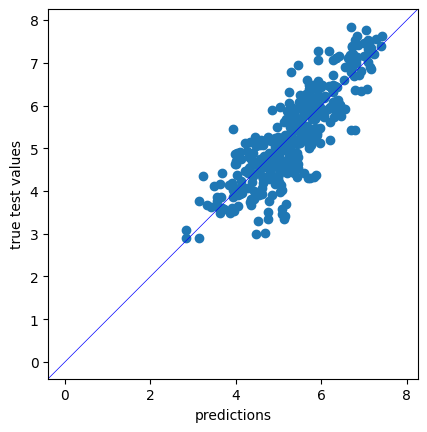

In [87]:
fig, ax = plt.subplots()

ax.scatter(y_predict_test, y_test)
ax.axline((0,0), slope = 1, c="b", lw=0.5)
ax.set_xlabel("predictions")
ax.set_ylabel("true test values")

# Create square plot
lims = ax.axis("square")
min_lim = min(lims[::2])
max_lim = max(lims[1::2])
ax.set_xlim(min_lim, max_lim)
ax.set_ylim(min_lim, max_lim);

- calculate and print some metrics for our model as: <br>
    - MSE - Mean squared error <br>
    - RSME - Root mean squared error (Cost Function)
    - MAE - Mean absolute error
    - R2 - Score


In [88]:
# Evaluate the model
mse = mean_squared_error(y_test, y_predict_test)
rmse = root_mean_squared_error(y_test, y_predict_test)
mae = mean_absolute_error(y_test, y_predict_test)
r2 = lr.score(x_test_scaled, y_test) 

# print results
print(f"MSE: {np.round(mse, 4)}")
print(f"RMSE: {np.round(rmse, 4)}")
print(f"MAE: {np.round(mae, 4)}")
print(f"R2: {np.round(r2, 4)}") 

MSE: 0.3347
RMSE: 0.5785
MAE: 0.4528
R2: 0.7232


- calculate residuals:

In [89]:
residuals = y_predict_test - y_test

- plot subplots with residuals:
    - Residuals against true values
    - Histogram residuals 

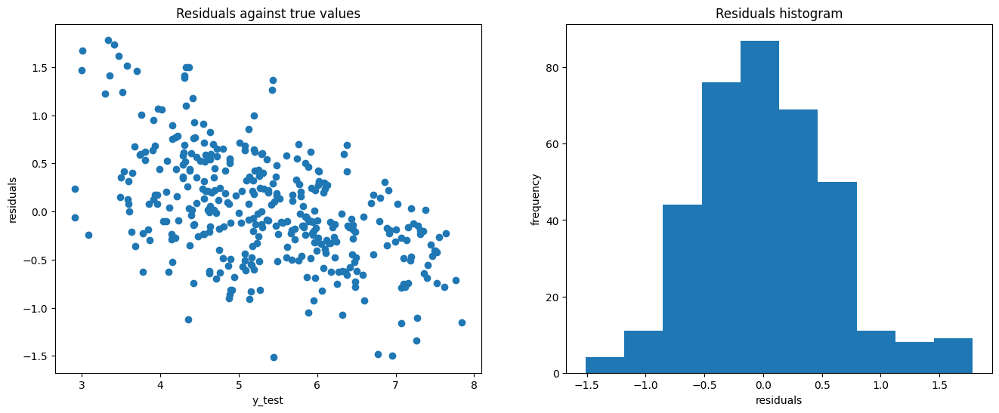

In [90]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(16,6))

plt.subplot(1,2,1)
plt.scatter(y_test, residuals)
plt.ylabel("residuals")
plt.xlabel("y_test")
plt.title("Residuals against true values")

plt.subplot(1,2,2)
plt.hist(residuals)
plt.xlabel("residuals")
plt.ylabel("frequency")
plt.title("Residuals histogram")
plt.show();

- As we can see in the plots above, the residuals are normally distributed. The most of the residuals are distributed around zero. 

## Polynomial Features

On this step, we generate the polynomial features of second grade. We transform the polynomial data from our scaled training and test set.
- we print the number/shape of polynomial features 

In [91]:
poly = PolynomialFeatures(2, include_bias=False)
x_train_scaled_poly = poly.fit_transform(x_train_scaled)
x_test_scaled_poly = poly.transform(x_test_scaled)
poly_names = poly.get_feature_names_out()
x_train_scaled_poly.shape[1]

27

- print the features names

In [92]:
print(poly_names)

['Economy_GDP_Per_Capita' 'Social_Support' 'Health_Life_Expectancy'
 'Freedom' 'Generosity' 'Perceptions_Of_Corruption'
 'Economy_GDP_Per_Capita^2' 'Economy_GDP_Per_Capita Social_Support'
 'Economy_GDP_Per_Capita Health_Life_Expectancy'
 'Economy_GDP_Per_Capita Freedom' 'Economy_GDP_Per_Capita Generosity'
 'Economy_GDP_Per_Capita Perceptions_Of_Corruption' 'Social_Support^2'
 'Social_Support Health_Life_Expectancy' 'Social_Support Freedom'
 'Social_Support Generosity' 'Social_Support Perceptions_Of_Corruption'
 'Health_Life_Expectancy^2' 'Health_Life_Expectancy Freedom'
 'Health_Life_Expectancy Generosity'
 'Health_Life_Expectancy Perceptions_Of_Corruption' 'Freedom^2'
 'Freedom Generosity' 'Freedom Perceptions_Of_Corruption' 'Generosity^2'
 'Generosity Perceptions_Of_Corruption' 'Perceptions_Of_Corruption^2']


## Linear regression with polynomial features

we fit our linear regression model with polynomial features

- Instantiate linear regression
- Fit the model with data
- predict the train and test data
- print the RSME Values

In [93]:
lr_model = LinearRegression()
lr_model.fit(x_train_scaled_poly, y_train) # fit the model

# predict
y_predict_train_scaled_poly = lr_model.predict(x_train_scaled_poly)
y_predict_test_scaled_poly = lr_model.predict(x_test_scaled_poly)

# print RSME results for training and test set
print(f"RMSE train: {root_mean_squared_error(y_train, y_predict_train_scaled_poly)}")
print(f"RMSE test: {root_mean_squared_error(y_test, y_predict_test_scaled_poly)}")


RMSE train: 0.5273693758893391
RMSE test: 0.5540220737109894


The RMSE is almost the same for the test set and for the train set. The performance seems to be comparable on train and test dataset. The model's generalization power is good. <br>
We can also say, that the RSME (Cost function) for our training and test set had better results as only with the linear regression without polynomial features. <br>

For comparision with linear regression RSME: <br>
- RMSE train: 0.5612116922285804- RMSE test: 0.5784985369686733

Model Coefficients:

- Return the values of the coefficients and save them under the variable lr_model_coef. <br>
- Print the value of the intercept of the model. <br>
- Print the slope. <br>
- Print features to keep. <br>

In [94]:
lr_model_coef = lr_model.coef_

print(f"intercept: {lr_model.intercept_}")
print(f'Slope: {lr_model.coef_}')

intercept: [2.4250104]
Slope: [[ 1.65112285  1.65098294  0.06959159  1.45935153  1.8026127  -0.24909972
  -2.8431786   0.07907277  5.13603464 -0.71124439  1.70175183  1.50702695
  -2.28846904  3.33331491  0.04964637  0.22778299  2.17953645 -3.01628884
   1.71751333 -1.81252434 -3.33639711 -0.92271788 -0.59712096  1.45561206
  -1.86725347  1.82087478 -1.46985664]]


In [95]:
print(poly_names)

['Economy_GDP_Per_Capita' 'Social_Support' 'Health_Life_Expectancy'
 'Freedom' 'Generosity' 'Perceptions_Of_Corruption'
 'Economy_GDP_Per_Capita^2' 'Economy_GDP_Per_Capita Social_Support'
 'Economy_GDP_Per_Capita Health_Life_Expectancy'
 'Economy_GDP_Per_Capita Freedom' 'Economy_GDP_Per_Capita Generosity'
 'Economy_GDP_Per_Capita Perceptions_Of_Corruption' 'Social_Support^2'
 'Social_Support Health_Life_Expectancy' 'Social_Support Freedom'
 'Social_Support Generosity' 'Social_Support Perceptions_Of_Corruption'
 'Health_Life_Expectancy^2' 'Health_Life_Expectancy Freedom'
 'Health_Life_Expectancy Generosity'
 'Health_Life_Expectancy Perceptions_Of_Corruption' 'Freedom^2'
 'Freedom Generosity' 'Freedom Perceptions_Of_Corruption' 'Generosity^2'
 'Generosity Perceptions_Of_Corruption' 'Perceptions_Of_Corruption^2']


- create a dataframe with coefficients

In [96]:
df_coefs = pd.DataFrame(lr_model_coef.T, index = poly_names, columns=["Coefficient"]).sort_values("Coefficient").T
display(df_coefs)

,Health_Life_Expectancy Perceptions_Of_Corruption,Health_Life_Expectancy^2,Economy_GDP_Per_Capita^2,Social_Support^2,Generosity^2,Health_Life_Expectancy Generosity,Perceptions_Of_Corruption^2,Freedom^2,Economy_GDP_Per_Capita Freedom,Freedom Generosity,...,Economy_GDP_Per_Capita Perceptions_Of_Corruption,Social_Support,Economy_GDP_Per_Capita,Economy_GDP_Per_Capita Generosity,Health_Life_Expectancy Freedom,Generosity,Generosity Perceptions_Of_Corruption,Social_Support Perceptions_Of_Corruption,Social_Support Health_Life_Expectancy,Economy_GDP_Per_Capita Health_Life_Expectancy
Coefficient,-3.336397,-3.016289,-2.843179,-2.288469,-1.867253,-1.812524,-1.469857,-0.922718,-0.711244,-0.597121,...,1.507027,1.650983,1.651123,1.701752,1.717513,1.802613,1.820875,2.179536,3.333315,5.136035


- in this table, we can see the coefficient for our features. We can see here the positive coeficient of economy GDP per capita. <br>

In [97]:
lr_model_coef_corr = np.hstack(lr_model_coef) # stack array, that we have the same size for coef and poly_names
print(lr_model_coef_corr)                     # test - print array

[ 1.65112285  1.65098294  0.06959159  1.45935153  1.8026127  -0.24909972
 -2.8431786   0.07907277  5.13603464 -0.71124439  1.70175183  1.50702695
 -2.28846904  3.33331491  0.04964637  0.22778299  2.17953645 -3.01628884
  1.71751333 -1.81252434 -3.33639711 -0.92271788 -0.59712096  1.45561206
 -1.86725347  1.82087478 -1.46985664]


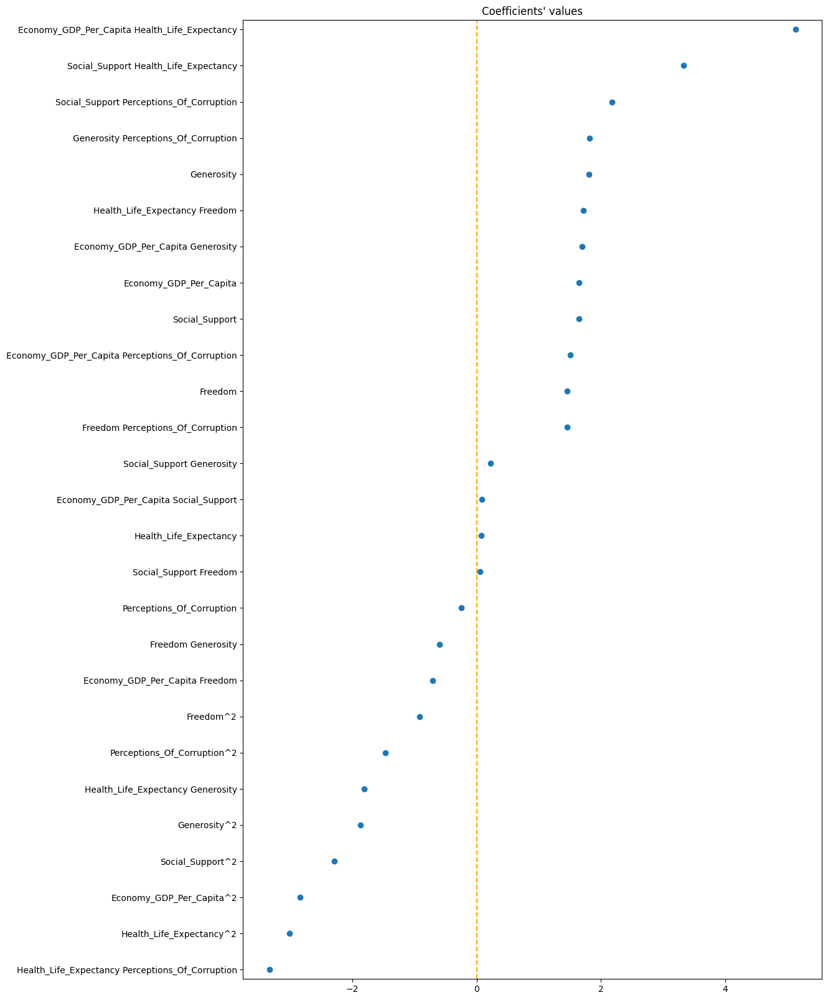

In [98]:
plot_coef(lr_model_coef_corr, poly_names)

We can see, that not all values on train set and test set are equal zero. 

#### Linear regression with polynomial features - Prediction/Evaluation 

Plot of predictions against real values: <br>
- Most of the data points lie around a diagonal line. This means that the predictions seem to be in line with the actual values.

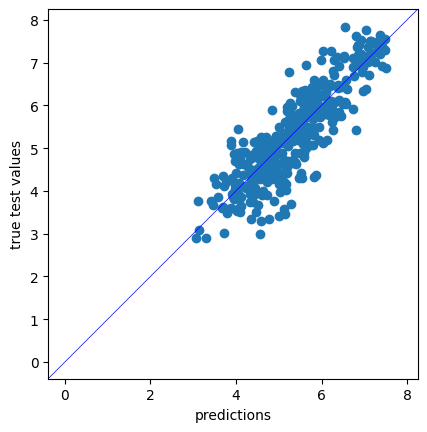

In [99]:
fig, ax = plt.subplots()

ax.scatter(y_predict_test_scaled_poly, y_test)
ax.axline((0,0), slope = 1, c="b", lw=0.5)
ax.set_xlabel("predictions")
ax.set_ylabel("true test values")

# Create square plot
lims = ax.axis("square")
min_lim = min(lims[::2])
max_lim = max(lims[1::2])
ax.set_xlim(min_lim, max_lim)
ax.set_ylim(min_lim, max_lim);

- calculate and print some metrics for our model as: <br>
    - MSE - Mean squared error <br>
    - RSME - Root mean squared error (Cost Function)
    - MAE - Mean absolute error
    - R2 - Score


In [100]:
# Evaluate the model
mse_poly = mean_squared_error(y_test, y_predict_test_scaled_poly)
rmse_poly = root_mean_squared_error(y_test, y_predict_test_scaled_poly)
mae_poly = mean_absolute_error(y_test, y_predict_test_scaled_poly)
r2_poly = lr_model.score(x_test_scaled_poly, y_test) 

# print results
print(f"MSE: {np.round(mse_poly, 4)}")
print(f"RMSE: {np.round(rmse_poly, 4)}")
print(f"MAE: {np.round(mae_poly, 4)}")
print(f"R2: {np.round(r2_poly, 4)}") 

MSE: 0.3069
RMSE: 0.554
MAE: 0.4284
R2: 0.7461


- We can see, that the result with polynomial features are better as without this features.<br>

- results of Linear regression without polynomial features metrics:
    - MSE: 0.3347
    - RMSE: 0.5785
    - MAE: 0.4528
    - R2: 0.7232 <br>

- calculate residuals:

In [101]:
residuals_poly = y_predict_test_scaled_poly - y_test

- plot subplots with residuals:
    - Residuals against true values
    - Histogram residuals 

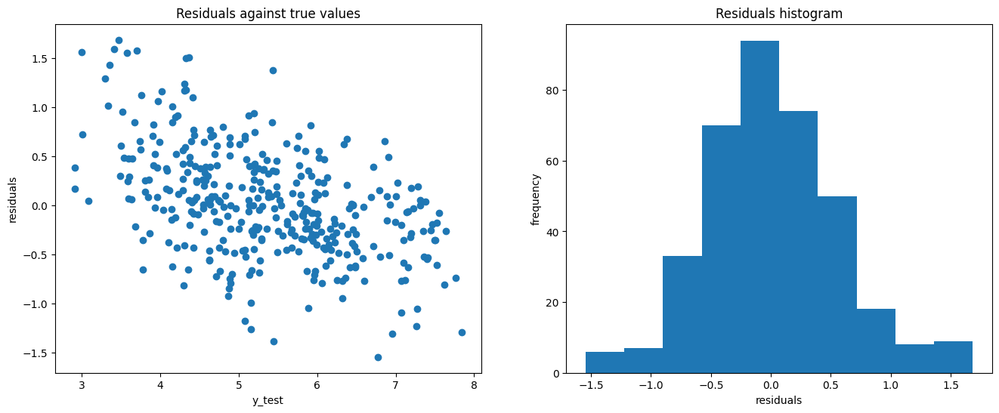

In [102]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(16,6))

plt.subplot(1,2,1)
plt.scatter(y_test, residuals_poly)
plt.ylabel("residuals")
plt.xlabel("y_test")
plt.title("Residuals against true values")

plt.subplot(1,2,2)
plt.hist(residuals_poly)
plt.xlabel("residuals")
plt.ylabel("frequency")
plt.title("Residuals histogram")
plt.show();

- As we can see in the plots above, the residuals are normally distributed. The most of the residuals are distributed around zero. 

## LASSO regression

- Instantiate a Lasso regression
- Fit the model with data (polynomial standardizaded data)
- predict the train and test data
- print the RSME Values

In [103]:
lr_l = Lasso(alpha = 0.01)
lr_l.fit(x_train_scaled_poly, y_train) # fit the model

# predict
y_predict_train_lasso = lr_l.predict(x_train_scaled_poly)
y_predict_test_lasso = lr_l.predict(x_test_scaled_poly)

# print RSME values for training and test set
print(f"RMSE train: {root_mean_squared_error(y_train, y_predict_train_lasso)}")
print(f"RMSE test: {root_mean_squared_error(y_test, y_predict_test_lasso)}")

RMSE train: 0.565402118706413
RMSE test: 0.5600989668514516



The RMSE is almost the same for the test set and for the train set. The performance seems to be comparable on train and test dataset. The model's generalization power is good.

- Return the values of the coefficients and save them under the variable lr_model_coef. <br>
- Print the value of the intercept of the model. <br>
- Print the slope. <br>
- Print features to keep. <br>

In [104]:
lr_l_model_coef = lr_l.coef_

print(f"intercept: {lr_l.intercept_}")
print(f'Slope: {lr_l.coef_}')


intercept: [3.39203564]
Slope: [1.65281942 0.         0.         0.22302422 0.0507139  0.
 0.         0.         0.07571527 0.         0.         0.
 0.         1.14906814 0.87573652 0.         0.38253844 0.
 1.01822494 0.         0.         0.         0.         0.
 0.         0.         0.        ]


In [105]:
print(poly_names)

['Economy_GDP_Per_Capita' 'Social_Support' 'Health_Life_Expectancy'
 'Freedom' 'Generosity' 'Perceptions_Of_Corruption'
 'Economy_GDP_Per_Capita^2' 'Economy_GDP_Per_Capita Social_Support'
 'Economy_GDP_Per_Capita Health_Life_Expectancy'
 'Economy_GDP_Per_Capita Freedom' 'Economy_GDP_Per_Capita Generosity'
 'Economy_GDP_Per_Capita Perceptions_Of_Corruption' 'Social_Support^2'
 'Social_Support Health_Life_Expectancy' 'Social_Support Freedom'
 'Social_Support Generosity' 'Social_Support Perceptions_Of_Corruption'
 'Health_Life_Expectancy^2' 'Health_Life_Expectancy Freedom'
 'Health_Life_Expectancy Generosity'
 'Health_Life_Expectancy Perceptions_Of_Corruption' 'Freedom^2'
 'Freedom Generosity' 'Freedom Perceptions_Of_Corruption' 'Generosity^2'
 'Generosity Perceptions_Of_Corruption' 'Perceptions_Of_Corruption^2']


- plot the coefficoents function 

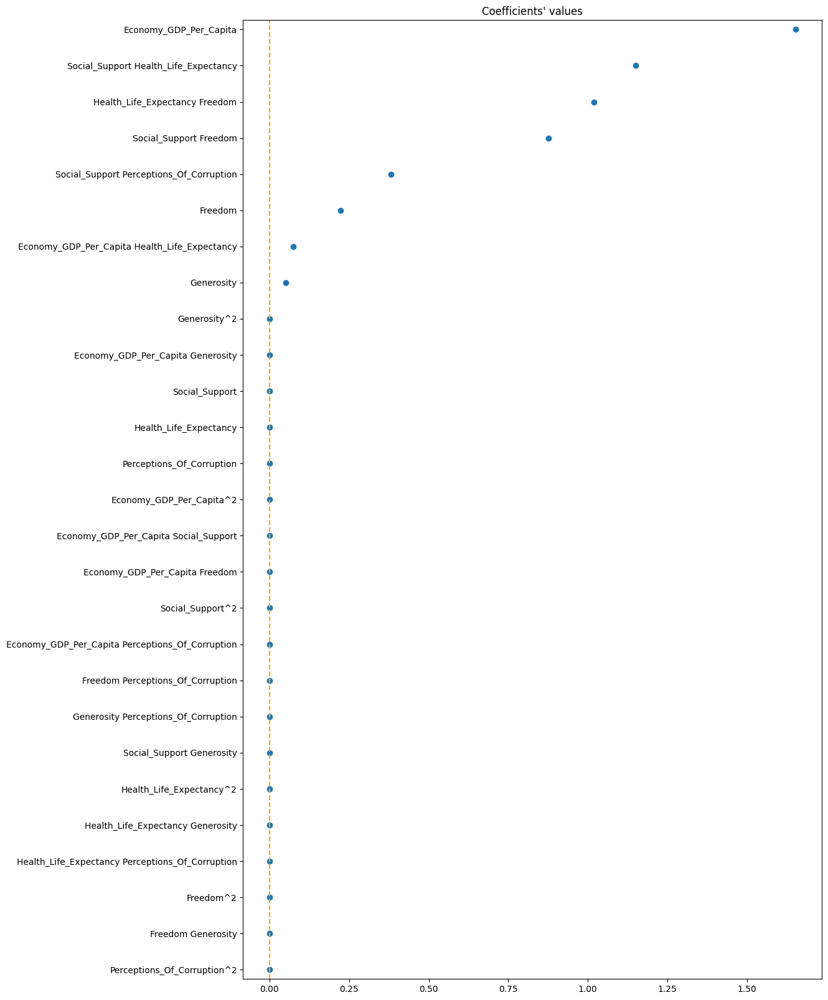

In [106]:
plot_coef(lr_l_model_coef, poly_names)

All of the coefficients are not-equal to 0. We have 8 variables that are not equal to 0

In [126]:
print(f'After applying Lasso on polynomial scaled features we remain with {np.sum(lr_l.coef_!=0)} variables.')

After applying Lasso on polynomial scaled features we remain with 8 variables.


Calculate and print some metrics for our model as: <br>
- MSE - Mean squared error <br>
- RSME - Root mean squared error (Cost Function)
- MAE - Mean absolute error
- R2 - Score

In [154]:
# Evaluate the model
mse_poly = mean_squared_error(y_test, y_predict_test_lasso)
rmse_poly = root_mean_squared_error(y_test, y_predict_test_lasso)
mae_poly = mean_absolute_error(y_test, y_predict_test_lasso)
r2_poly = lr_l.score(x_test_scaled_poly, y_test) 

# print results
print(f"MSE: {np.round(mse_poly, 4)}")
print(f"RMSE: {np.round(rmse_poly, 4)}")
print(f"MAE: {np.round(mae_poly, 4)}")
print(f"R2: {np.round(r2_poly, 4)}") 

MSE: 0.3137
RMSE: 0.5601
MAE: 0.4419
R2: 0.7405


By the analysis of results we can see, that the LASSO didn't work as excepted. Our result: MSE, RSME and MAE are higher as the results of linear regression with polynomial features. Also the score of lasso is lower as the score of linear regression with polynomial features.

Results of linear regression with polynomial features:
- MSE: 0.3069
- RMSE: 0.554
- MAE: 0.4284
- R2: 0.7461

## KNN - Nearest Neighbors regression

In [107]:
knn = KNeighborsRegressor(n_neighbors=15) # set neighbors to 15
knn.fit(x_train_scaled_poly, y_train)     # fit the model

# predict
y_predict_train_knn = knn.predict(x_train_scaled_poly)
y_predict_test_knn = knn.predict(x_test_scaled_poly)

# print the RSME for training and test set
print(f"RMSE train: {root_mean_squared_error(y_train, y_predict_train_knn)}")
print(f"RMSE test: {root_mean_squared_error(y_test, y_predict_test_knn)}")

RMSE train: 0.5056673569461029
RMSE test: 0.521105703784958


In [108]:
# Evaluate the model
mse = mean_squared_error(y_test, y_predict_test_knn)
rmse_poly = root_mean_squared_error(y_test, y_predict_test_knn)
mae_poly = mean_absolute_error(y_test, y_predict_test_knn)
r2 = r2_score(y_test, y_predict_test_knn)

# print results
print(f"MSE: {np.round(mse, 4)}")
print(f"RMSE: {np.round(rmse_poly, 4)}")
print(f"MAE: {np.round(mae_poly, 4)}")
print(f"R2: {np.round(r2, 4)}")

MSE: 0.2716
RMSE: 0.5211
MAE: 0.4041
R2: 0.7754


By the analysis of KNN regression with 15 neighbors we see, that the model works better as linear regression with polynomial features. Our metrics are lower and the score of this model is higher als linear regression with polynomial features. <br>

Results of linear regression with polynomial features:
- MSE: 0.3069
- RMSE: 0.554
- MAE: 0.4284
- R2: 0.7461

#### KNN regression - tuning the model

- we try to find the best k value - best parameter for neighbors

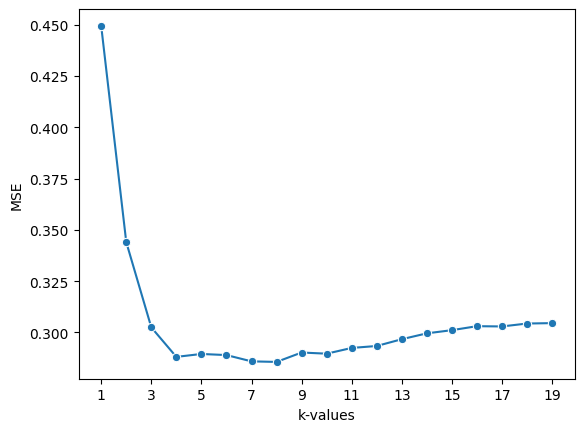

In [109]:
k_values = range(1, 20) # Create a range of k values for parameter tuning
mse_values = []         # List to store mean squared errors for each value of k

for k in k_values:
    knn_regressor = KNeighborsRegressor(n_neighbors=k)
    mse = -cross_val_score(knn_regressor, x_train_scaled_poly, y_train, cv=5, scoring='neg_mean_squared_error')
    mse_values.append(np.mean(mse))

# Visualize MSE
sns.lineplot(x = k_values, y = mse_values, marker = 'o')
plt.xlabel("k-values")
plt.ylabel("MSE")
plt.xticks(range(1, 21, 2))
plt.show()

- in this step we find the best k value - neighbors value<br>
- we use the knn regression with this parameter<br>
- we fit the model<br>
- we predict the values and calculate the RSME for training and test set<br>

In [113]:
smallest_mse = np.min(mse_values)
best_k = mse_values.index(smallest_mse) + 1

# show best K value
print(f"Best K value: {best_k}")
print()

# Implement and fit the model
knn_regressor = KNeighborsRegressor(n_neighbors=best_k)
knn_regressor.fit(x_train_scaled_poly, y_train)

# Predict
y_predict_train_knn_regressor = knn_regressor.predict(x_train_scaled_poly)
y_predict_test_knn_regressor = knn_regressor.predict(x_test_scaled_poly)

# print RSME for training and test set
print(f"RMSE train: {root_mean_squared_error(y_train, y_predict_train_knn_regressor)}")
print(f"RMSE test: {root_mean_squared_error(y_test, y_predict_test_knn_regressor)}")

Best K value: 8

RMSE train: 0.46547620555290237
RMSE test: 0.5101801148594728


In [114]:
# Evaluate the model
mse = mean_squared_error(y_test, y_predict_test_knn_regressor)
rmse_poly = root_mean_squared_error(y_test, y_predict_test_knn_regressor)
mae_poly = mean_absolute_error(y_test, y_predict_test_knn_regressor)
r2 = r2_score(y_test, y_predict_test_knn_regressor)
knn_score = knn_regressor.score(x_test_scaled_poly, y_test)

# Print results
print(f"MSE: {np.round(mse, 4)}")
print(f"RMSE: {np.round(rmse_poly, 4)}")
print(f"MAE: {np.round(mae_poly, 4)}")
print(f"R2: {np.round(r2, 4)}")
print(f"KNN score: {np.round(knn_score, 4)}")

MSE: 0.2603
RMSE: 0.5102
MAE: 0.3894
R2: 0.7847
KNN score: 0.7847


After the analysis of the model we can say, that we improved our knn regressor model with the best k parameter. Out metrics are lower as on basic knn and the score is higher.

Results of KNN:
- MSE: 0.2737
- RMSE: 0.5231
- MAE: 0.4035
- R2: 0.7736

#### KNN - Grid search

- find the best K value (n_neighbors)
- other method to find the best k value, if we become the same result

In [121]:
params = {'n_neighbors': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]} # set parameters

knn_best_result = KNeighborsRegressor()

knn_model = GridSearchCV(knn_best_result, params, cv=5)     # exhaustive search over specified parameter values for an estimator      
knn_model.fit(x_train_scaled_poly,y_train)                  # fit the model

# print best K value
print(f"KNN best params: {knn_model.best_params_}")

KNN best params: {'n_neighbors': 8}


- we got here the same result - best params = 8 

#### KNN - bagging

- improving KNN Rregressor with bagging
- create the model with the best k value
- fit the model
- predict values
- show the results of RSME for training and test set

In [116]:
best_k = knn_model.best_params_["n_neighbors"]
bagged_knn = KNeighborsRegressor(n_neighbors = best_k)

In [117]:
# initialise the model with best k and 100 estimators
bagging_model = BaggingRegressor(bagged_knn, n_estimators = 100) 

# fit the model
bagging_model.fit(x_train_scaled_poly, np.ravel(y_train))        

# Predict
y_predict_train_knn_bagging = bagging_model.predict(x_train_scaled_poly)
y_predict_test_knn_bagging = bagging_model.predict(x_test_scaled_poly)

# print RSME for training and test set
print(f"RMSE train: {root_mean_squared_error(y_train, y_predict_train_knn_bagging)}")
print(f"RMSE test: {root_mean_squared_error(y_test, y_predict_test_knn_bagging)}")

RMSE train: 0.4602540643625154
RMSE test: 0.5088453343179216


In [118]:
# Evaluate the model
mse = mean_squared_error(y_test, y_predict_test_knn_bagging)
rmse_poly = root_mean_squared_error(y_test, y_predict_test_knn_bagging)
mae_poly = mean_absolute_error(y_test, y_predict_test_knn_bagging)
r2 = r2_score(y_test, y_predict_test_knn_bagging)
knn_score = bagging_model.score(x_test_scaled_poly, y_test)

# Print results
print(f"MSE: {np.round(mse, 4)}")
print(f"RMSE: {np.round(rmse_poly, 4)}")
print(f"MAE: {np.round(mae_poly, 4)}")
print(f"R2: {np.round(r2, 4)}")
print(f"KNN score: {np.round(knn_score, 4)}")

MSE: 0.2589
RMSE: 0.5088
MAE: 0.3892
R2: 0.7858
KNN score: 0.7858


After the analysis of the model we can say, that we improved our knn regressor model with the best k parameter with bagging. Out metrics are lower as on basic knn and the score is higher.
  
Results of KNN with the best k value
- MSE: 0.2603
- RMSE: 0.5102
- MAE: 0.3894
- R2: 0.7847
- KNN score: 0.7847

## MLP Regression

- multi-layer preceptron regressor
- we fit out model
- we predict the values
- we print the RSME for training and test set

In [119]:
mlp = MLPRegressor(max_iter=1000)                # initialise the regressor
mlp.fit(x_train_scaled_poly, np.ravel(y_train))  # fit the model

# Predict
y_predict_train_mlp = mlp.predict(x_train_scaled_poly)
y_predict_test_mlp = mlp.predict(x_test_scaled_poly)

# Print the RSME for training and test set
print(f"RMSE train: {root_mean_squared_error(y_train, y_predict_train_mlp)}")
print(f"RMSE test: {root_mean_squared_error(y_test, y_predict_test_mlp)}")

RMSE train: 0.5359263637699418
RMSE test: 0.5465252634363493


In [120]:
# Evaluate the model
mse = mean_squared_error(y_test, y_predict_test_mlp)
rmse_poly = root_mean_squared_error(y_test, y_predict_test_mlp)
mae_poly = mean_absolute_error(y_test, y_predict_test_mlp)
r2 = r2_score(y_test, y_predict_test_mlp)

# Print results
print(f"MSE: {np.round(mse, 4)}")
print(f"RMSE: {np.round(rmse_poly, 4)}")
print(f"MAE: {np.round(mae_poly, 4)}")
print(f"R2: {np.round(r2, 4)}")

MSE: 0.2987
RMSE: 0.5465
MAE: 0.4238
R2: 0.7529


After the analysis of the model we can say, that we didn't improved our bagged knn regressor model with the best k parameter. Out metrics are higher and the score is lower.

Results of bagged KNN with the best k value:
- MSE: 0.2558
- RMSE: 0.5057
- MAE: 0.3889
- R2: 0.7884
- KNN score: 0.7884

## Results from different models:

**Linear regression**<br>

    - RMSE train: 0.5612116922285804
    - RMSE test: 0.5784985369686733

    - MSE: 0.3347
    - RMSE: 0.5785
    - MAE: 0.4528
    - R2: 0.7232 - score

**Linear regression polynomial features**<br>

    - RMSE train: 0.5273693758893391
    - RMSE test: 0.5540220737109894

    - MSE: 0.3069
    - RMSE: 0.554
    - MAE: 0.4284
    - R2: 0.7461 - score

**LASSO**<br>

    - RMSE train: 0.565402118706413
    - RMSE test: 0.5600989668514516

    - MSE: 0.3137
    - RMSE: 0.5601
    - MAE: 0.4419
    - R2: 0.7405 - score

**KNN**<br>

    - RMSE train: 0.5056673569461029
    - RMSE test: 0.521105703784958

    - MSE: 0.2716
    - RMSE: 0.5211
    - MAE: 0.4041
    - R2: 0.7754 – score

**KNN – best fit**<br>

    - RMSE train: 0.46547620555290237
    - RMSE test: 0.5101801148594728

    - MSE: 0.2603
    - RMSE: 0.5102
    - MAE: 0.3894
    - R2: 0.7847
    - KNN score: 0.7847 - score

**KNN – Bagging:**<br>

    - RMSE train: 0.46084364967513863
    - RMSE test: 0.5060858567441139

    - MSE: 0.2561
    - RMSE: 0.5061
    - MAE: 0.3888
    - R2: 0.7881
    - KNN score: 0.7881 - score

**MLP**<br>

    - RMSE train: 0.5359263637699418
    - RMSE test: 0.5465252634363493

    - MSE: 0.2987
    - RMSE: 0.5465
    - MAE: 0.4238
    - R2: 0.7529 - score

## Analysis of results: 

The best result we get from the **KNN Regression** machine learning modell, when we use the **Bagging method** to tune the KNN regression.<br>
All of the metrics are improved.<br>
We have the bst score from this model.<br>

I try all of the alorithm with MinMax Scaler and also the StandardScaler, the results of **MinMax Scaler** are slightly better, when we use the polynomial features and KNN Regressor.

## Final Model - Prediction and visualisation

- get the min and max values from x dataframe

In [380]:
print("Minimum:")
print(x.min())
print()
print("Maximum:")
print(x.max())

Minimum:
Economy_GDP_Per_Capita       0.0
Social_Support               0.0
Health_Life_Expectancy       0.0
Freedom                      0.0
Generosity                   0.0
Perceptions_Of_Corruption    0.0
dtype: float64

Maximum:
Economy_GDP_Per_Capita       2.209000
Social_Support               1.644000
Health_Life_Expectancy       1.141000
Freedom                      0.740000
Generosity                   0.838075
Perceptions_Of_Corruption    0.587000
dtype: float64


- create a new Dataframe with evenly spaced number from the specific interval
- 200 observations for the new dataframe
- print the shape

In [376]:
x_new = pd.DataFrame() # create new DataFrame

# Fill with data
x_new["Economy_GDP_Per_Capita"] = np.linspace(0, 2.209000, num=200)
x_new["Social_Support"] = np.linspace(0, 1.644000, num=200)
x_new["Health_Life_Expectancy"] = np.linspace(0, 1.141000, num=200)
x_new["Freedom"] = np.linspace(0, 0.740000, num=200)
x_new["Generosity"] = np.linspace(0, 0.838075, num=200)
x_new["Perceptions_Of_Corruption"] = np.linspace(0, 0.587000, num=200)

x_new.shape # print shape

(200, 6)

- display first 10 rows of dataframe

In [365]:
display(x_new.head(10))

,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption
0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,0.011101,0.008261,0.005734,0.003719,0.004211,0.002950
2,0.022201,0.016523,0.011467,0.007437,0.008423,0.005899
3,0.033302,0.024784,0.017201,0.011156,0.012634,0.008849
4,0.044402,0.033045,0.022935,0.014874,0.016846,0.011799
5,0.055503,0.041307,0.028668,0.018593,0.021057,0.014749
6,0.066603,0.049568,0.034402,0.022312,0.025269,0.017698
7,0.077704,0.057829,0.040136,0.026030,0.029480,0.020648
8,0.088804,0.066090,0.045869,0.029749,0.033691,0.023598
9,0.099905,0.074352,0.051603,0.033467,0.037903,0.026548


- use the bagging model to predict the new values
- store the values to y_predict_new
- print the predicted values

In [377]:
y_predict_new = bagging_model.predict(x_new) # predict values
print(y_vis)                                 # print values 

[3.03611163 3.02958813 3.03870563 3.0370895  3.0370895  3.041392
 3.040592   3.06402325 3.076587   3.076366   3.0681455  3.0681455
 3.06619075 3.07504263 3.10640638 3.10716063 3.10819938 3.12742687
 3.114556   3.1149875  3.1223495  3.175712   3.24407338 3.24835163
 3.26110313 3.2918565  3.31264025 3.33115126 3.35042751 3.37396751
 3.40483001 3.44971151 3.51075776 3.62958201 3.69822701 3.68734451
 3.76357376 3.77325175 3.76635    3.8294525  3.91562875 4.04794175
 4.13212088 4.174074   4.26181075 4.27430425 4.3026425  4.3491475
 4.39795125 4.44450875 4.45888125 4.42441125 4.4350575  4.42570125
 4.42049125 4.41752875 4.37679125 4.38735375 4.35137875 4.36415125
 4.3368175  4.352475   4.39534125 4.43761625 4.43329125 4.4416175
 4.48317    4.54799375 4.598505   4.68366375 4.73990125 4.7824325
 4.791055   4.77927125 4.78010375 4.7606225  4.73789625 4.74497001
 4.744965   4.75317875 4.75617501 4.75702626 4.72811251 4.72753126
 4.75236126 4.77132876 4.80387375 4.7906175  4.8339325  4.86914
 4.9

- visualize the predicted values
- print training data (blue)
- print test data (green)
- print predicted data (red line)

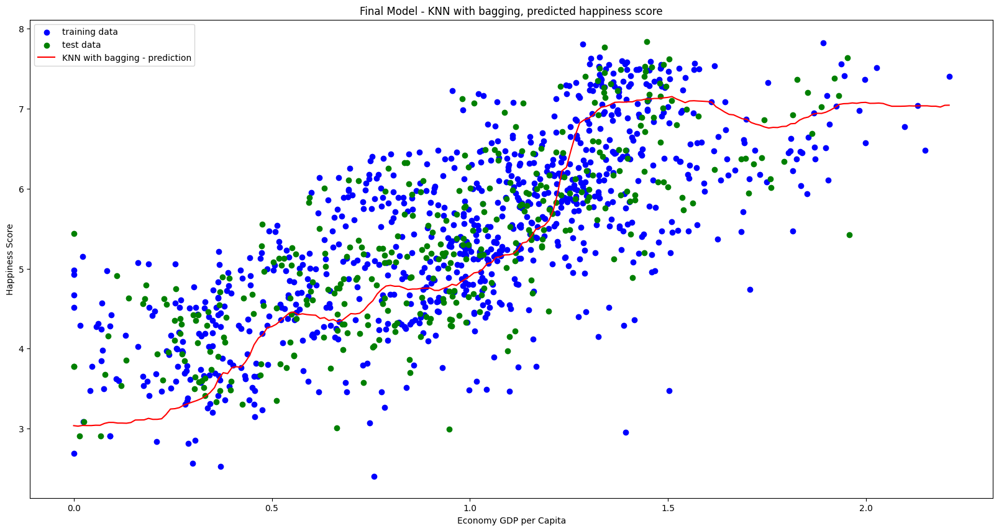

In [381]:
# Visualize the data
plt.figure(figsize=(20, 10))
plt.scatter(x_train.iloc[:,0], y_train, color='blue', label = 'training data')
plt.scatter(x_test.iloc[:, 0], y_test, color='green', label = 'test data')
plt.title('Final Model - KNN with bagging, predicted happiness score')
plt.xlabel('Economy GDP per Capita')
plt.ylabel('Happiness Score')

# Add the model
plt.plot(x_new.iloc[:, 0], y_vis, color="red", label = 'KNN with bagging - prediction')

plt.legend()
plt.show()